In [6]:
import pandas as pd
import numpy as np
import torch
from scipy.stats import gamma, norm
from darts.models import RNNModel,RegressionModel , RandomForest, XGBModel
from darts.metrics import rmse, mape
# from darts.ad import ThresholdAD
from darts import TimeSeries

import pywt
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error
import json
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import STL
import os


from pptx import Presentation
from pptx.util import Inches, Pt
from pptx.enum.shapes import MSO_SHAPE
from pptx.dml.color import RGBColor

import geopandas as gpd
from shapely.geometry import Point
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.lines import Line2D


# Set random seed for reproducibility
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False



Read and preprocess the input data


In [2]:

def fit_gamma(precip: pd.Series) -> tuple:
    non_zero = precip[precip > 0]
    if len(non_zero) == 0:
        return np.nan, np.nan, 1.0
    shape, _, scale = gamma.fit(non_zero, floc=0)
    zero_prob = (precip == 0).mean()
    return shape, scale, zero_prob


def compute_spi(roll: pd.Series, shape: float, scale: float, zero_prob: float) -> np.ndarray:
    # probs = zero_prob + (1 - zero_prob) * gamma.cdf(roll, shape, scale=scale)
    probs = np.where(
    roll.isna(),
    np.nan,
    zero_prob + (1 - zero_prob) * gamma.cdf(roll, shape, scale=scale)
    )
    probs = np.clip(probs, 1e-10, 1 - 1e-10)
    return norm.ppf(probs)


def process_station(df_station: pd.DataFrame) -> pd.DataFrame:
    df_station = df_station.sort_values('ds').reset_index(drop=True)
    # shape, scale, zero_prob = fit_gamma(df_station['precip'])
    result = {'ds': df_station['ds']}

    for s in [1, 3, 6, 9, 12, 24]:
        roll = df_station['precip'].rolling(s, min_periods=s).sum()
        shape, scale, zero_prob = fit_gamma(roll.dropna())

        spi = compute_spi(roll, shape, scale, zero_prob)
        # z-score manually
        mean, std = np.nanmean(spi), np.nanstd(spi)
        result[f'SPI_{s}'] = (spi - mean) / std

    result_df = pd.DataFrame(result)
    result_df['station_id'] = df_station['station_id'].iloc[0]
    return result_df


# Load & aggregate to monthly totals
df = (
    pd.read_csv('../result/merged_data.csv', parse_dates=['data'])
      .assign(ds=lambda d: d['data'].dt.to_period('M').dt.to_timestamp())
      .groupby(['station_id', 'ds'])['rrr24']
      .sum()
      .reset_index(name='precip')
)

# Compute SPI for each station
spi_list = [process_station(g) for _, g in df.groupby('station_id')]
all_spi = pd.concat(spi_list, ignore_index=True)


C:\Users\varas\AppData\Local\Temp\ipykernel_15528\4171478131.py:42: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.read_csv('../result/merged_data.csv', parse_dates=['data'])


class TaylorDiagram

In [4]:

class TaylorDiagram:
    def __init__(self, ref_std, fig=None, rect=111, label='Reference'):
        self.ref_std = ref_std
        self.sample_points = []

        self.fig = fig if fig is not None else plt.figure(figsize=(8, 6))
        self.ax = self.fig.add_subplot(rect, polar=True)

        # Configure polar axes
        self.ax.set_theta_zero_location('E')

        self.ax.set_theta_direction(-1)
        self.ax.set_theta_offset(np.pi / 2)
        self.ax.set_ylim(0, 1.5 * ref_std)
        self.ax.set_thetamin(0)
        self.ax.set_thetamax(90)

        # Set up correlation coefficient grid
        self._setup_axes()

        # Plot reference point
        self.ax.plot([0], [ref_std], 'k*', markersize=12, label=label)

    def _setup_axes(self):
        corrs = np.array([0.0, 0.2, 0.4, 0.6, 0.8, 0.9, 0.95, 0.99, 1.0])
        angles = np.arccos(corrs)

        self.ax.set_thetagrids(np.degrees(angles), labels=[f"{c:.2f}" for c in corrs], fontsize=10)
        self.ax.set_rlabel_position(135)
        self.ax.set_ylabel('Standard Deviation', fontsize=12)

        # Add radial grid lines manually
        for angle in angles:
            self.ax.plot([angle, angle], [0, self.ax.get_ylim()[1]], color='lightgray', linestyle='--', linewidth=0.5)

    def add_sample(self, stddev, corrcoef, label, marker='o', color=None):
        theta = np.arccos(corrcoef)
        point, = self.ax.plot(theta, stddev, marker=marker, label=label, color=color, markersize=8)
        self.sample_points.append(point)

    def add_contours(self, levels=6, cmap='coolwarm', linewidths=1.2):
        rs, ts = np.meshgrid(
            np.linspace(0, self.ax.get_ylim()[1], 300),
            np.linspace(0, np.pi / 2, 300)
        )
        rms = np.sqrt(
            self.ref_std**2 + rs**2 - 2 * self.ref_std * rs * np.cos(ts)
        )
        contours = self.ax.contour(
            ts, rs, rms,
            levels=np.linspace(0, self.ax.get_ylim()[1], levels),
            cmap=cmap,
            linewidths=linewidths
        )
        self.fig.colorbar(contours, ax=self.ax, pad=0.1, orientation='vertical', label="RMS Difference")
        return contours

    def show(self, title='Taylor Diagram'):
        self.ax.set_title(title, fontsize=14, pad=20)
        self.ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
        plt.tight_layout()
        plt.show()


Define Models and train


In [42]:

class WBBLSTMModel:
    def __init__(self, wavelet='db1', level=1, **lstm_kwargs):
        self.wavelet = wavelet
        self.level = level
        self.lstm_kwargs = lstm_kwargs
        self.lstm_model = RNNModel(model='LSTM', **lstm_kwargs)
        
    def wavelet_decompose(self, series: TimeSeries):
        coeffs = pywt.wavedec(series.values().flatten(), self.wavelet, level=self.level)
        return coeffs
    
    def wavelet_reconstruct(self, coeffs):
        return pywt.waverec(coeffs, self.wavelet)
    
    def fit(self, series: TimeSeries):
        # Decompose
        coeffs = self.wavelet_decompose(series)
        approx = coeffs[0]  # Use approximation coeffs as input to LSTM
        approx_series = TimeSeries.from_values(approx.reshape(-1, 1))
        
        # Fit the internal LSTM model
        self.lstm_model.fit(approx_series)

    def predict(self, n,series):
        # 1) Decompose historical series into coeffs
        hist_coeffs = self.wavelet_decompose(series)
        hist_approx, *hist_details = hist_coeffs

        # 2) Forecast only the approximation coeffs (with correct time index)
        approx_ts = self.lstm_model.predict(n, series=series)
        approx_pred = approx_ts.values().flatten()

        # 3) Build a new approximation array: [historic approx | predicted approx]
        full_approx = np.concatenate([hist_approx, approx_pred])

        # # 4) Reconstruct full series (history + forecast) from full_approx + historic details
        # full_coeffs = [full_approx] + hist_details
        # full_series = self.wavelet_reconstruct(full_coeffs)

        # # 5) Extract the last `n` points (the forecasted window)
        # pred_values = full_series[-n:]

        # # 6) Wrap back into a TimeSeries with the forecast's original time index
        # return TimeSeries.from_times_and_values(
        #     approx_ts.time_index,
        #     pred_values.reshape(-1, 1),
        #     columns=approx_ts.components
        # )

        # dummy_coeffs  = pywt.wavedec(
        #                np.zeros_like(full_approx),
        #                self.wavelet,
        #                level=self.level
        #            )       # these have the exact shapes we need
        # 1. Create a dummy signal with same shape as approx_pred
        dummy_signal = np.zeros_like(approx_pred)

        # 2. Decompose dummy to get the correct coeff shapes
        dummy_coeffs = pywt.wavedec(dummy_signal, self.wavelet, level=self.level)

        full_coeffs   = [full_approx] + [np.zeros_like(c) for c in dummy_coeffs[1:]]
        print("Full approx length:", len(full_approx))
        print("Expected shapes:")
        for i, c in enumerate(dummy_coeffs):
            print(f"  Coeff {i}: shape = {c.shape}")

        print("\nYour full_coeffs shapes:")
        for i, c in enumerate(full_coeffs):
                print(f"  Coeff {i}: shape = {c.shape}")

        

        # 3. Replace only the *approximation level* with your forecast (but RESHAPED to the correct length)
        approx_pred_downsampled = pywt.wavedec(approx_pred, self.wavelet, level=self.level)[0]

        # 4. Now use it with the correct detail coeff shapes
        coeffs = [approx_pred_downsampled] + [np.zeros_like(c) for c in dummy_coeffs[1:]]

        # 5. Reconstruct
        full_series = self.wavelet_reconstruct(coeffs)

        # 5) zero out all detail levels (you could also keep hist_details if you want)

        # # 6) reconstruct the full signal
        # full_series   = self.wavelet_reconstruct(full_coeffs)

        # 7) extract just the last n points (the forecast window)
        forecast_vals = full_series[-n:]

        # 8) wrap back into TimeSeries with the right ds index
        return TimeSeries.from_times_and_values(
            approx_ts.time_index,
            forecast_vals.reshape(-1, 1),
            columns=approx_ts.components
        )
    def save(self, path):
        # os.makedirs(path, exist_ok=True)

        # Save LSTM model
        self.lstm_model.save(path)

        # Save wavelet settings and kwargs
        meta = {
        'wavelet': self.wavelet,
            'level': self.level,
            'lstm_kwargs': self.lstm_kwargs
        }

        with open(os.path.join(os.path.dirname(path), "WBILSTMmeta.json"), "w") as f:
            json.dump(meta, f)

    @classmethod
    def load(cls, path):
        with open(os.path.join(os.path.dirname(path), "WBILSTMmeta.json"), "r") as f:
            meta = json.load(f)


        wavelet = meta['wavelet']
        level = meta['level']
        lstm_kwargs = meta['lstm_kwargs']
        instance = cls(wavelet=wavelet, level=level, **lstm_kwargs)

        # instance = cls(**meta)
        instance.lstm_model = RNNModel.load(path)
        return instance



window_size = 12
num_epochs=300
model_constructors = {
    # 'ExtraTF'   : lambda: XGBModel(lags=window_size, objective='reg:squarederror', random_state=SEED),
    # 'RandomRF'  : lambda: RandomForest(lags=window_size, n_estimators=100, random_state=SEED),
    # 'SVR'       : lambda: RegressionModel(model=SVR(kernel='rbf'),lags=window_size),
    # 'LSTM'      : lambda: RNNModel(model='LSTM', input_chunk_length=window_size, output_chunk_length=6,
    #                                hidden_dim=25, n_rnn_layers=2, dropout=0.1,
    #                                batch_size=16, n_epochs=num_epochs, optimizer_kwargs={'lr':1e-3},
    #                                random_state=SEED)
    #                                ,
    'WBBLSTM'   : lambda: WBBLSTMModel(
        wavelet='db1',
        level=1,
        input_chunk_length=12,
        output_chunk_length=6,
        hidden_dim=25,
        n_rnn_layers=2,
        dropout=0.1,
        batch_size=16,
        n_epochs=num_epochs,
        optimizer_kwargs={'lr':1e-3},
        random_state=SEED
    )
}


def compute_metrics(obs: np.ndarray, pred: np.ndarray):
    rmse = np.sqrt(mean_squared_error(obs, pred))
    std_obs, std_pred = np.std(obs), np.std(pred)
    corr = np.corrcoef(obs, pred)[0,1]
    return std_obs, std_pred, corr, rmse

results = {}  
base_dir = "all_results3"
os.makedirs(base_dir, exist_ok=True)



for station_id, group in all_spi.groupby('station_id'):
    results[station_id] = {}
    # if station_id !=40708:
    #          continue
    for col in [c for c in group.columns if c.startswith("SPI_")]:
        # if col != "SPI_3":
        #     continue
        print(f"\n=== Station {station_id} | {col} ===")
        sub_df = group[['ds', col]].dropna()

        series = TimeSeries.from_dataframe(sub_df, time_col='ds', value_cols=col)
        
        # split once per series
        train, val = series.split_before(0.8)

        

        # model_folder = os.path.join(base_dir, "{station_id}/{col}")
        model_folder = os.path.join(base_dir, f"{station_id}/{col}")

        os.makedirs(model_folder, exist_ok=True)





        model_stats = {}
        forecasts = {}
        for name, mk in model_constructors.items():
            model_path = os.path.join(model_folder, name)
            if os.path.exists(model_path):
                print(f"Model {name} already trained. Skipping.")
                model_class = {
                    'LSTM': RNNModel,
                    'SVR': RegressionModel,
                    'RandomRF': RandomForest,
                    'ExtraTF': XGBModel,
                    'WBBLSTM': WBBLSTMModel
                }[name]
                print(f"!!!@@@-----Loading {name} model from {model_path}…")
                model = model_class.load(model_path)

            else:
                print(f"!!!@@@------Training {name}…", end='')
                model = mk()

                model.fit(series=train)
                model.save(model_path)

                print(" saved.")

            forecast = model.predict(len(val), series=train)
            o = val.values().flatten()
            p = forecast.values().flatten()

            
            std_o, std_p, corr, rmse_val = compute_metrics(o, p)
            mape_val = mape(val, forecast)

            model_stats[name] = (std_o, std_p, corr, rmse_val, mape_val)
            forecasts[name] = forecast
        results[station_id][col] = model_stats




ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs



=== Station 40700 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40700/SPI_1\WBBLSTM…
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 75.15it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs



Full approx length: 248
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (248,)
  Coeff 1: shape = (42,)

=== Station 40700 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40700/SPI_3\WBBLSTM…
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 101.20it/s]
Full approx length: 247
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (247,)
  Coeff 1: shape = (42,)

=== Station 40700 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40700/SPI_6\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.52it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 245
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (245,)
  Coeff 1: shape = (42,)

=== Station 40700 | SPI_9 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40700/SPI_9\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 299.72it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 243
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (243,)
  Coeff 1: shape = (41,)

=== Station 40700 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40700/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.22it/s]
Full approx length: 241
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (241,)
  Coeff 1: shape = (41,)

=== Station 40700 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40700/SPI_24\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.53it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 234
Expected shapes:
  Coeff 0: shape = (40,)
  Coeff 1: shape = (40,)

Your full_coeffs shapes:
  Coeff 0: shape = (234,)
  Coeff 1: shape = (40,)

=== Station 40701 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40701/SPI_1\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.58it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 248
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (248,)
  Coeff 1: shape = (42,)

=== Station 40701 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40701/SPI_3\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 47.98it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 247
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (247,)
  Coeff 1: shape = (42,)

=== Station 40701 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40701/SPI_6\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 68.51it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 245
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (245,)
  Coeff 1: shape = (42,)

=== Station 40701 | SPI_9 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40701/SPI_9\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 59.24it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 243
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (243,)
  Coeff 1: shape = (41,)

=== Station 40701 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40701/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 80.72it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs



Full approx length: 241
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (241,)
  Coeff 1: shape = (41,)

=== Station 40701 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40701/SPI_24\WBBLSTM…
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 88.42it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 234
Expected shapes:
  Coeff 0: shape = (40,)
  Coeff 1: shape = (40,)

Your full_coeffs shapes:
  Coeff 0: shape = (234,)
  Coeff 1: shape = (40,)

=== Station 40704 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40704/SPI_1\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 64.18it/s]
Full approx length: 248
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (248,)
  Coeff 1: shape = (42,)

=== Station 40704 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40704/SPI_3\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 43.28it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False



Full approx length: 247
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (247,)
  Coeff 1: shape = (42,)

=== Station 40704 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40704/SPI_6\WBBLSTM…


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.64it/s] 

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs



Full approx length: 245
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (245,)
  Coeff 1: shape = (42,)

=== Station 40704 | SPI_9 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40704/SPI_9\WBBLSTM…
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 61.80it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 243
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (243,)
  Coeff 1: shape = (41,)

=== Station 40704 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40704/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 154.65it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 241
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (241,)
  Coeff 1: shape = (41,)

=== Station 40704 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40704/SPI_24\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 43.24it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 234
Expected shapes:
  Coeff 0: shape = (40,)
  Coeff 1: shape = (40,)

Your full_coeffs shapes:
  Coeff 0: shape = (234,)
  Coeff 1: shape = (40,)

=== Station 40705 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40705/SPI_1\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 333.99it/s]
Full approx length: 210
Expected shapes:
  Coeff 0: shape = (36,)
  Coeff 1: shape = (36,)

Your full_coeffs shapes:
  Coeff 0: shape = (210,)
  Coeff 1: shape = (36,)

=== Station 40705 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40705/SPI_3\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 128.01it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 209
Expected shapes:
  Coeff 0: shape = (36,)
  Coeff 1: shape = (36,)

Your full_coeffs shapes:
  Coeff 0: shape = (209,)
  Coeff 1: shape = (36,)

=== Station 40705 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40705/SPI_6\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 333.41it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 207
Expected shapes:
  Coeff 0: shape = (35,)
  Coeff 1: shape = (35,)

Your full_coeffs shapes:
  Coeff 0: shape = (207,)
  Coeff 1: shape = (35,)

=== Station 40705 | SPI_9 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40705/SPI_9\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 157.89it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 205
Expected shapes:
  Coeff 0: shape = (35,)
  Coeff 1: shape = (35,)

Your full_coeffs shapes:
  Coeff 0: shape = (205,)
  Coeff 1: shape = (35,)

=== Station 40705 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40705/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 95.87it/s] 

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 204
Expected shapes:
  Coeff 0: shape = (35,)
  Coeff 1: shape = (35,)

Your full_coeffs shapes:
  Coeff 0: shape = (204,)
  Coeff 1: shape = (35,)

=== Station 40705 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40705/SPI_24\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 82.38it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 196
Expected shapes:
  Coeff 0: shape = (33,)
  Coeff 1: shape = (33,)

Your full_coeffs shapes:
  Coeff 0: shape = (196,)
  Coeff 1: shape = (33,)

=== Station 40706 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40706/SPI_1\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 80.90it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 248
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (248,)
  Coeff 1: shape = (42,)

=== Station 40706 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40706/SPI_3\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 59.45it/s] 

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 247
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (247,)
  Coeff 1: shape = (42,)

=== Station 40706 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40706/SPI_6\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 47.75it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs



Full approx length: 245
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (245,)
  Coeff 1: shape = (42,)

=== Station 40706 | SPI_9 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40706/SPI_9\WBBLSTM…
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 108.13it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 243
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (243,)
  Coeff 1: shape = (41,)

=== Station 40706 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40706/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 69.41it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 241
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (241,)
  Coeff 1: shape = (41,)

=== Station 40706 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40706/SPI_24\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 99.21it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 234
Expected shapes:
  Coeff 0: shape = (40,)
  Coeff 1: shape = (40,)

Your full_coeffs shapes:
  Coeff 0: shape = (234,)
  Coeff 1: shape = (40,)

=== Station 40708 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40708/SPI_1\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 52.79it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 248
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (248,)
  Coeff 1: shape = (42,)

=== Station 40708 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40708/SPI_3\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 84.89it/s]
Full approx length: 247
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (247,)
  Coeff 1: shape = (42,)

=== Station 40708 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40708/SPI_6\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 500.04it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 245
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (245,)
  Coeff 1: shape = (42,)

=== Station 40708 | SPI_9 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40708/SPI_9\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 90.11it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 243
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (243,)
  Coeff 1: shape = (41,)

=== Station 40708 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40708/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 63.70it/s]
Full approx length: 241
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (241,)
  Coeff 1: shape = (41,)

=== Station 40708 | SPI_24 ===


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40708/SPI_24\WBBLSTM…
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 186.70it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 234
Expected shapes:
  Coeff 0: shape = (40,)
  Coeff 1: shape = (40,)

Your full_coeffs shapes:
  Coeff 0: shape = (234,)
  Coeff 1: shape = (40,)

=== Station 40710 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40710/SPI_1\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 72.15it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 248
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (248,)
  Coeff 1: shape = (42,)

=== Station 40710 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40710/SPI_3\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 70.85it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 247
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (247,)
  Coeff 1: shape = (42,)

=== Station 40710 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40710/SPI_6\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<?, ?it/s]
Full approx length: 245
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (245,)
  Coeff 1: shape = (42,)

=== Station 40710 | SPI_9 ===

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs



Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40710/SPI_9\WBBLSTM…
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 73.66it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 243
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (243,)
  Coeff 1: shape = (41,)

=== Station 40710 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40710/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 55.63it/s]
Full approx length: 241
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (241,)
  Coeff 1: shape = (41,)

=== Station 40710 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40710/SPI_24\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 100.95it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 234
Expected shapes:
  Coeff 0: shape = (40,)
  Coeff 1: shape = (40,)

Your full_coeffs shapes:
  Coeff 0: shape = (234,)
  Coeff 1: shape = (40,)

=== Station 40712 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40712/SPI_1\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.71it/s] 
Full approx length: 248
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (248,)
  Coeff 1: shape = (42,)

=== Station 40712 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40712/SPI_3\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 56.62it/s]
Full approx length: 247
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (247,)
  Coeff 1: shape = (42,)

=== Station 40712 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40712/SPI_6\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.80it/s]
Full approx length: 245
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (245,)
  Coeff 1: shape = (42,)

=== Station 40712 | SPI_9 ===

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40712/SPI_9\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 55.84it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 243
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (243,)
  Coeff 1: shape = (41,)

=== Station 40712 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40712/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 32.23it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 241
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (241,)
  Coeff 1: shape = (41,)

=== Station 40712 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40712/SPI_24\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 78.31it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 234
Expected shapes:
  Coeff 0: shape = (40,)
  Coeff 1: shape = (40,)

Your full_coeffs shapes:
  Coeff 0: shape = (234,)
  Coeff 1: shape = (40,)

=== Station 40713 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40713/SPI_1\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.30it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 248
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (248,)
  Coeff 1: shape = (42,)

=== Station 40713 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40713/SPI_3\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 94.92it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 247
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (247,)
  Coeff 1: shape = (42,)

=== Station 40713 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40713/SPI_6\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 83.28it/s]
Full approx length: 245
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (245,)
  Coeff 1: shape = (42,)

=== Station 40713 | SPI_9 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40713/SPI_9\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.29it/s]
Full approx length: 243
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (243,)
  Coeff 1: shape = (41,)

=== Station 40713 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40713/SPI_12\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 107.36it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 241
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (241,)
  Coeff 1: shape = (41,)

=== Station 40713 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40713/SPI_24\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 86.53it/s]
Full approx length: 234
Expected shapes:
  Coeff 0: shape = (40,)
  Coeff 1: shape = (40,)

Your full_coeffs shapes:
  Coeff 0: shape = (234,)
  Coeff 1: shape = (40,)

=== Station 40716 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40716/SPI_1\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 65.99it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False



Full approx length: 248
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (248,)
  Coeff 1: shape = (42,)

=== Station 40716 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40716/SPI_3\WBBLSTM…


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 121.24it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs



Full approx length: 247
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (247,)
  Coeff 1: shape = (42,)

=== Station 40716 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40716/SPI_6\WBBLSTM…
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 91.19it/s] 

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 245
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (245,)
  Coeff 1: shape = (42,)

=== Station 40716 | SPI_9 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40716/SPI_9\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 74.33it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 243
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (243,)
  Coeff 1: shape = (41,)

=== Station 40716 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40716/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 65.18it/s]
Full approx length: 241
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (241,)
  Coeff 1: shape = (41,)

=== Station 40716 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40716/SPI_24\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 84.66it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs



Full approx length: 234
Expected shapes:
  Coeff 0: shape = (40,)
  Coeff 1: shape = (40,)

Your full_coeffs shapes:
  Coeff 0: shape = (234,)
  Coeff 1: shape = (40,)

=== Station 40717 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40717/SPI_1\WBBLSTM…
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 58.88it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 248
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (248,)
  Coeff 1: shape = (42,)

=== Station 40717 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40717/SPI_3\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 99.89it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 247
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (247,)
  Coeff 1: shape = (42,)

=== Station 40717 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40717/SPI_6\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 56.57it/s]
Full approx length: 245
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (245,)
  Coeff 1: shape = (42,)

=== Station 40717 | SPI_9 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40717/SPI_9\WBBLSTM…


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 90.62it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 243
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (243,)
  Coeff 1: shape = (41,)

=== Station 40717 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40717/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 90.35it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 241
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (241,)
  Coeff 1: shape = (41,)

=== Station 40717 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40717/SPI_24\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 60.54it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 234
Expected shapes:
  Coeff 0: shape = (40,)
  Coeff 1: shape = (40,)

Your full_coeffs shapes:
  Coeff 0: shape = (234,)
  Coeff 1: shape = (40,)

=== Station 40726 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40726/SPI_1\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.37it/s] 

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 248
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (248,)
  Coeff 1: shape = (42,)

=== Station 40726 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40726/SPI_3\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.60it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False



Full approx length: 247
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (247,)
  Coeff 1: shape = (42,)

=== Station 40726 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40726/SPI_6\WBBLSTM…


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 75.31it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs



Full approx length: 245
Expected shapes:
  Coeff 0: shape = (42,)
  Coeff 1: shape = (42,)

Your full_coeffs shapes:
  Coeff 0: shape = (245,)
  Coeff 1: shape = (42,)

=== Station 40726 | SPI_9 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40726/SPI_9\WBBLSTM…
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 91.21it/s] 

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 243
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (243,)
  Coeff 1: shape = (41,)

=== Station 40726 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40726/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 83.07it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 241
Expected shapes:
  Coeff 0: shape = (41,)
  Coeff 1: shape = (41,)

Your full_coeffs shapes:
  Coeff 0: shape = (241,)
  Coeff 1: shape = (41,)

=== Station 40726 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\40726/SPI_24\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 79.21it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 234
Expected shapes:
  Coeff 0: shape = (40,)
  Coeff 1: shape = (40,)

Your full_coeffs shapes:
  Coeff 0: shape = (234,)
  Coeff 1: shape = (40,)

=== Station 88107 | SPI_1 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\88107/SPI_1\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 83.36it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 147
Expected shapes:
  Coeff 0: shape = (25,)
  Coeff 1: shape = (25,)

Your full_coeffs shapes:
  Coeff 0: shape = (147,)
  Coeff 1: shape = (25,)

=== Station 88107 | SPI_3 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\88107/SPI_3\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 85.84it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 146
Expected shapes:
  Coeff 0: shape = (25,)
  Coeff 1: shape = (25,)

Your full_coeffs shapes:
  Coeff 0: shape = (146,)
  Coeff 1: shape = (25,)

=== Station 88107 | SPI_6 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\88107/SPI_6\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 110.32it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 144
Expected shapes:
  Coeff 0: shape = (25,)
  Coeff 1: shape = (25,)

Your full_coeffs shapes:
  Coeff 0: shape = (144,)
  Coeff 1: shape = (25,)

=== Station 88107 | SPI_9 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\88107/SPI_9\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 96.35it/s] 
Full approx length: 142
Expected shapes:
  Coeff 0: shape = (24,)
  Coeff 1: shape = (24,)

Your full_coeffs shapes:
  Coeff 0: shape = (142,)
  Coeff 1: shape = (24,)


ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



=== Station 88107 | SPI_12 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\88107/SPI_12\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 88.20it/s]

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.



Full approx length: 141
Expected shapes:
  Coeff 0: shape = (24,)
  Coeff 1: shape = (24,)

Your full_coeffs shapes:
  Coeff 0: shape = (141,)
  Coeff 1: shape = (24,)

=== Station 88107 | SPI_24 ===
Model WBBLSTM already trained. Skipping.
!!!@@@-----Loading WBBLSTM model from all_results3\88107/SPI_24\WBBLSTM…


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 88.23it/s]
Full approx length: 133
Expected shapes:
  Coeff 0: shape = (23,)
  Coeff 1: shape = (23,)

Your full_coeffs shapes:
  Coeff 0: shape = (133,)
  Coeff 1: shape = (23,)


Loop over stations & timescales, 
 forecast

WBBLSTM — std_p: 0.54, corr: -0.05, rmse: 1.12, mape: 252.82


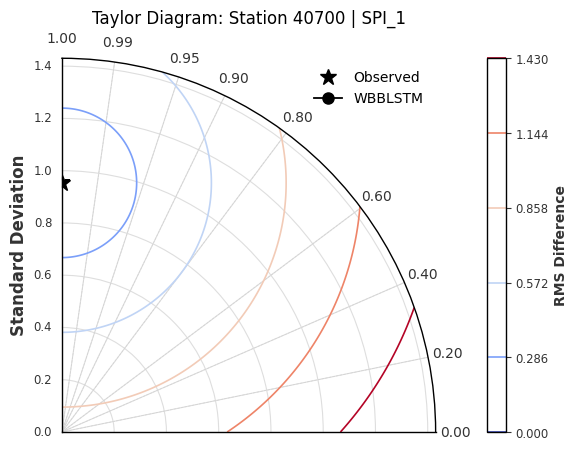

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40700 | SPI_1: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 80.77it/s, train_loss=0.202]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 78.65it/s, train_loss=0.202]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 23.91it/s]
Full approx length: 530
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (530,)
  Coeff 1: shape = (162,)


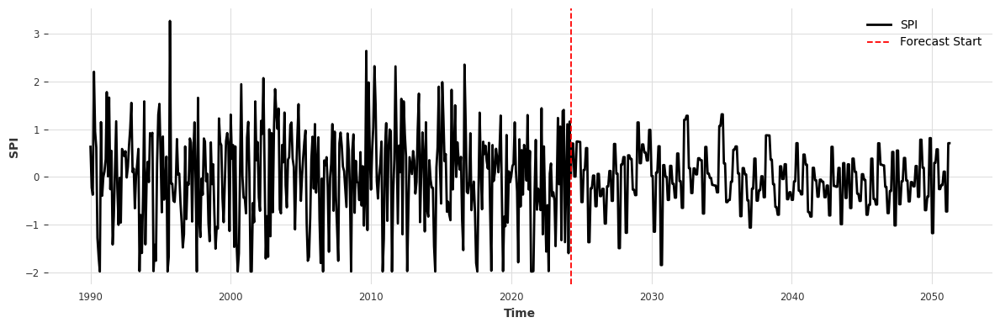

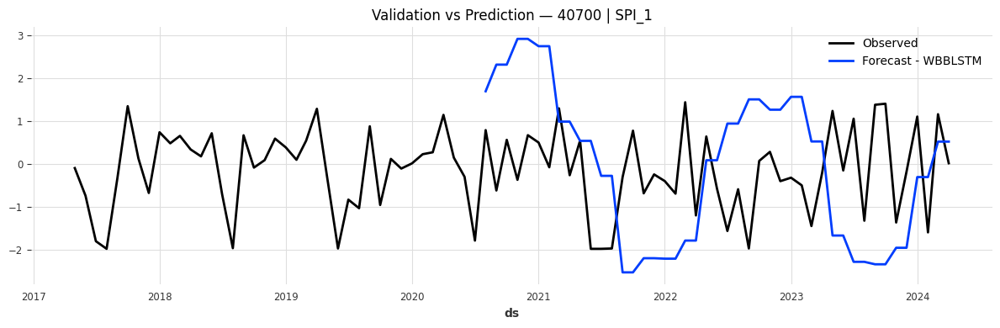

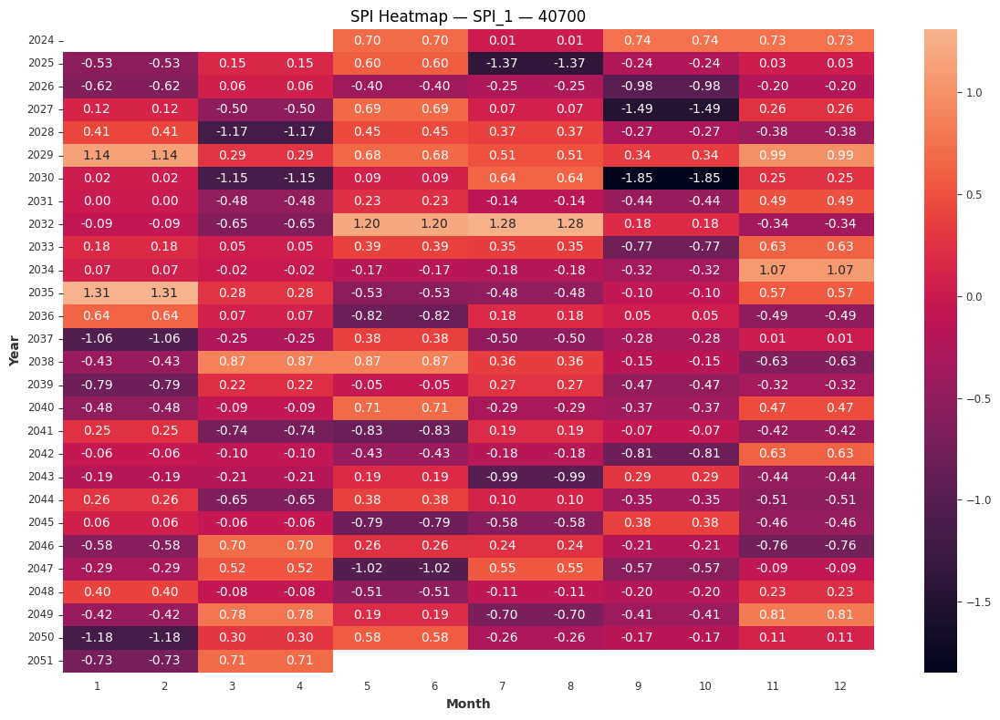

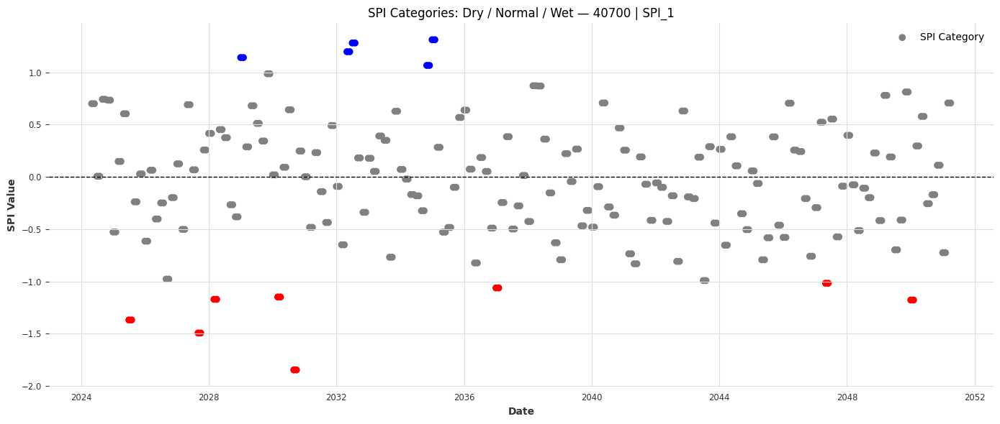

✔️ Done with 40700 | SPI_1

WBBLSTM — std_p: 0.86, corr: -0.17, rmse: 1.46, mape: 557.14


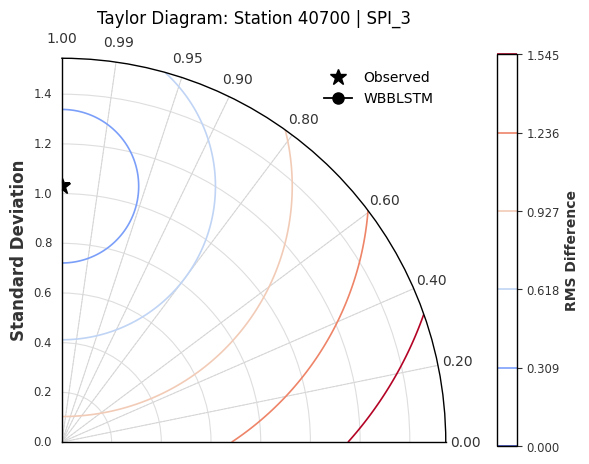

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40700 | SPI_3: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 67.29it/s, train_loss=0.186] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 66.55it/s, train_loss=0.186]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 21.42it/s]
Full approx length: 529
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (529,)
  Coeff 1: shape = (162,)


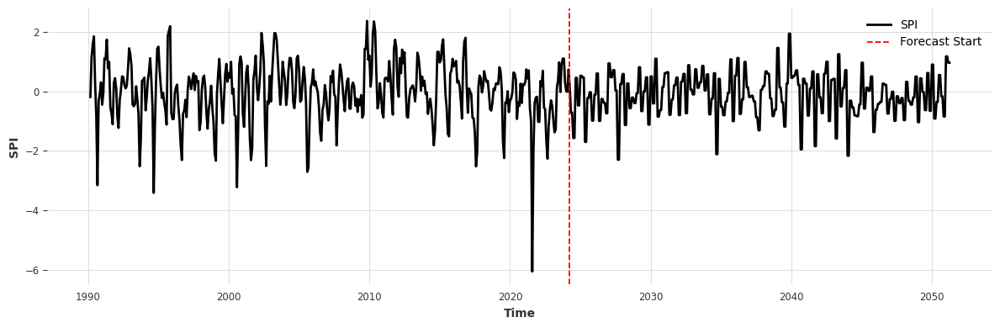

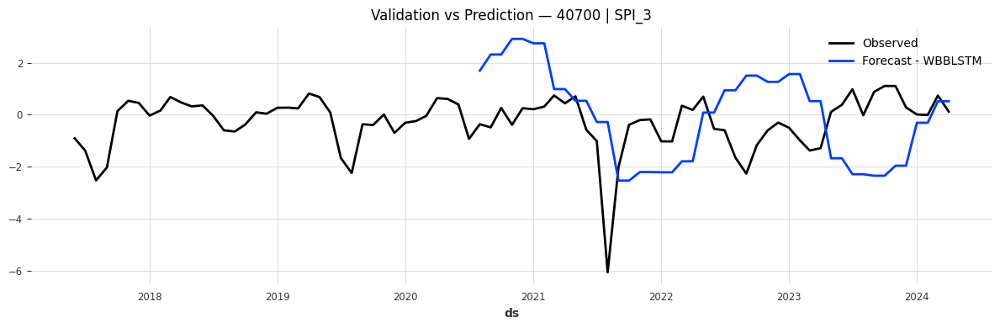

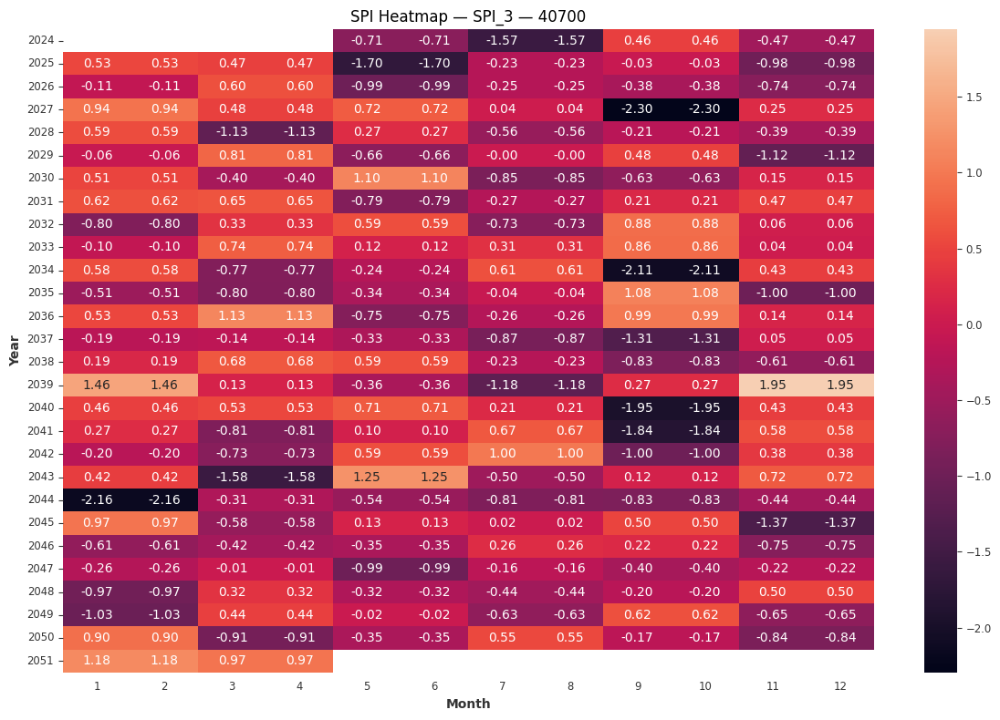

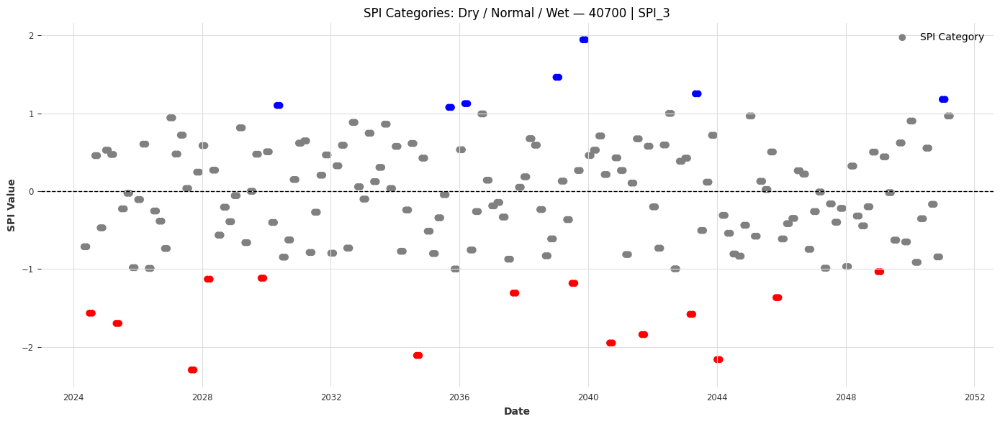

✔️ Done with 40700 | SPI_3

WBBLSTM — std_p: 1.20, corr: 0.27, rmse: 1.50, mape: 616.98


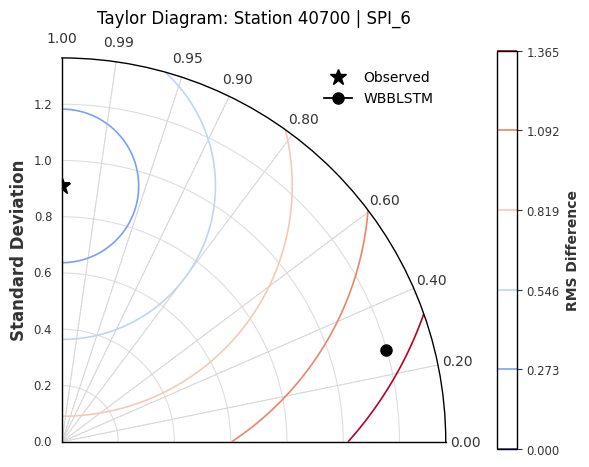

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40700 | SPI_6: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 87.93it/s, train_loss=0.148] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 87.29it/s, train_loss=0.148]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.02it/s]
Full approx length: 528
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (528,)
  Coeff 1: shape = (162,)


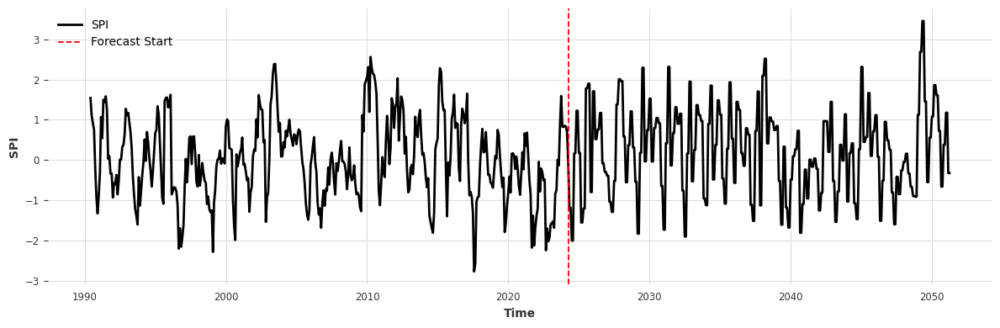

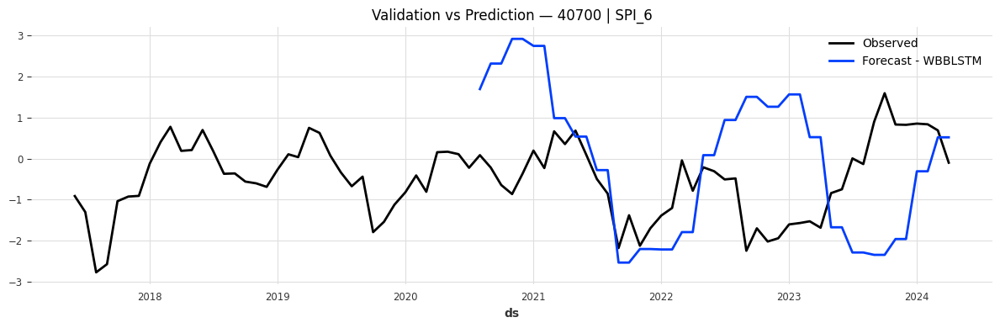

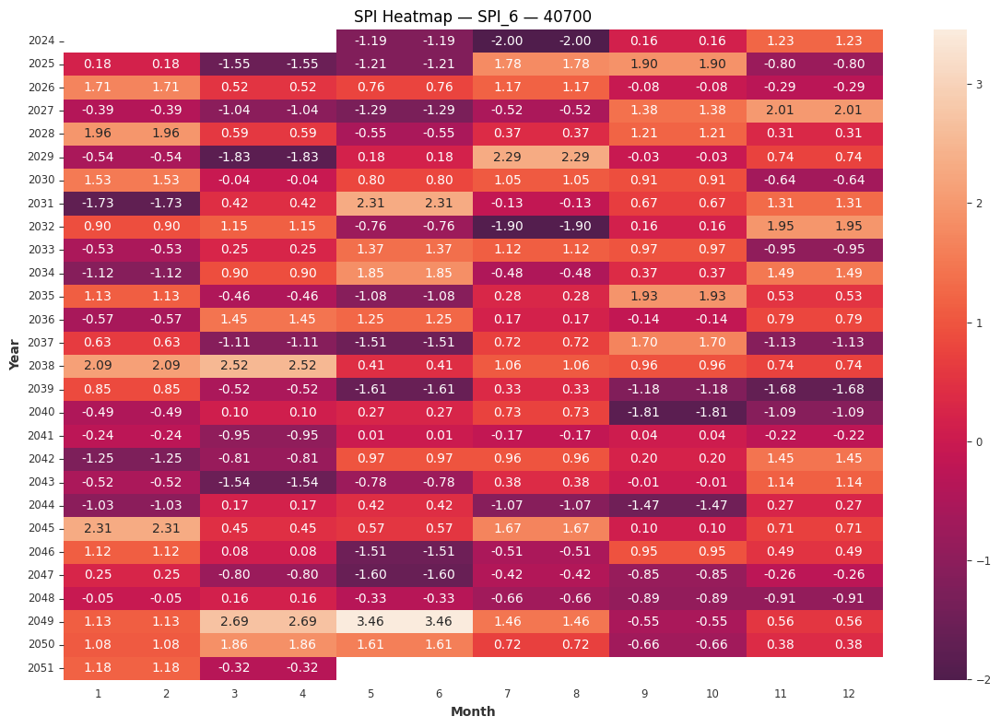

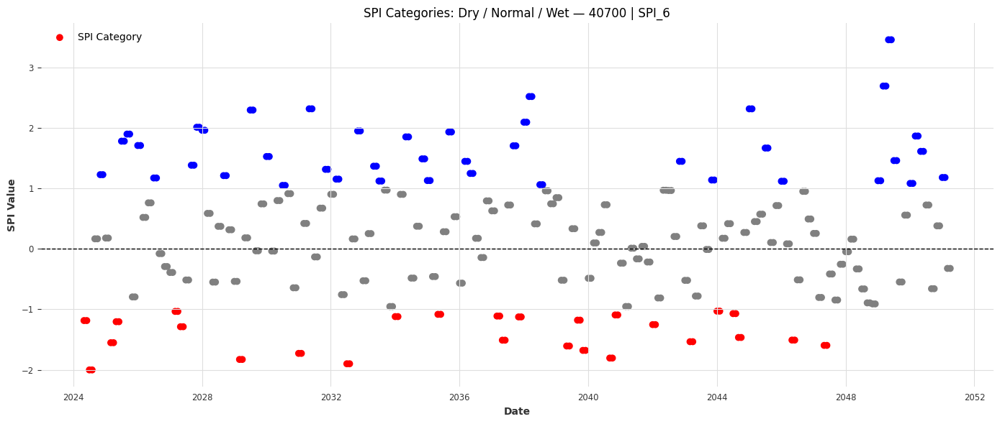

✔️ Done with 40700 | SPI_6

WBBLSTM — std_p: 0.84, corr: -0.12, rmse: 1.31, mape: 388.13


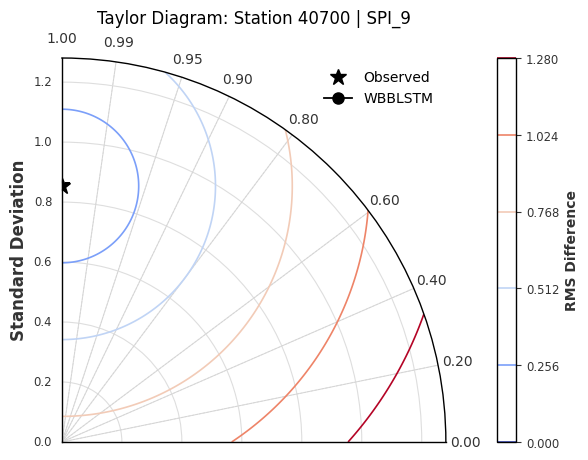

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40700 | SPI_9: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 87.28it/s, train_loss=0.191] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 86.03it/s, train_loss=0.191]

GPU available: False, used: False


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 17.67it/s]
Full approx length: 526
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (526,)
  Coeff 1: shape = (162,)


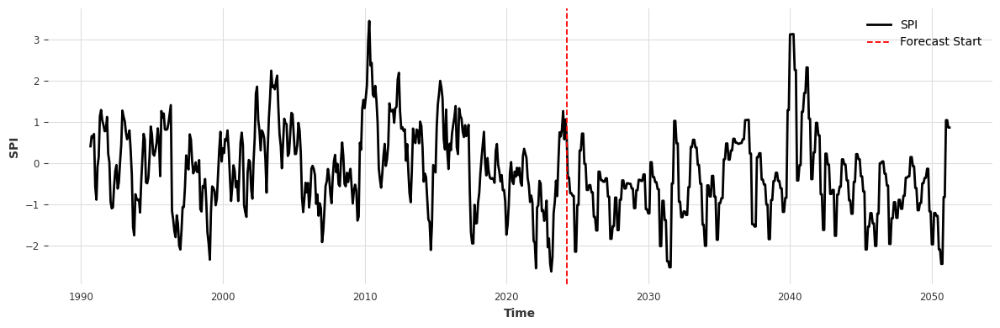

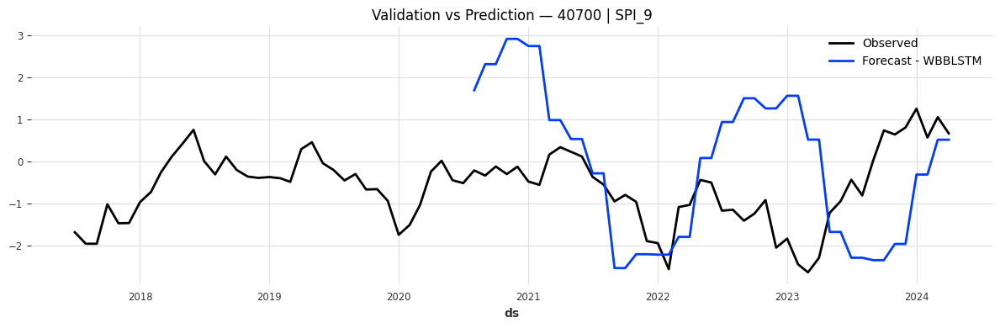

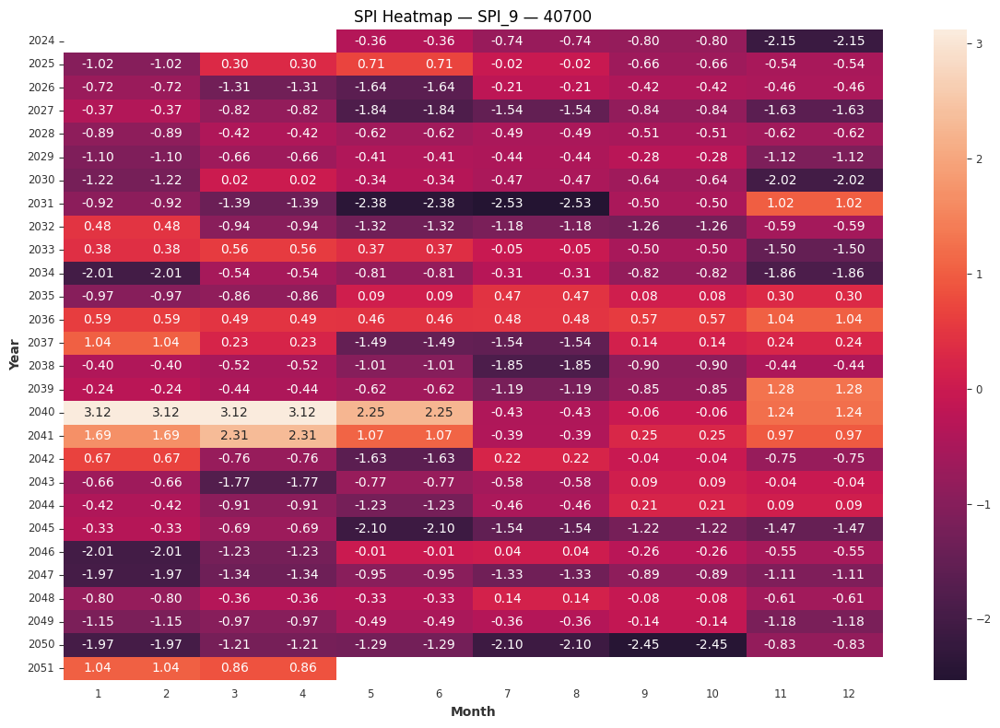

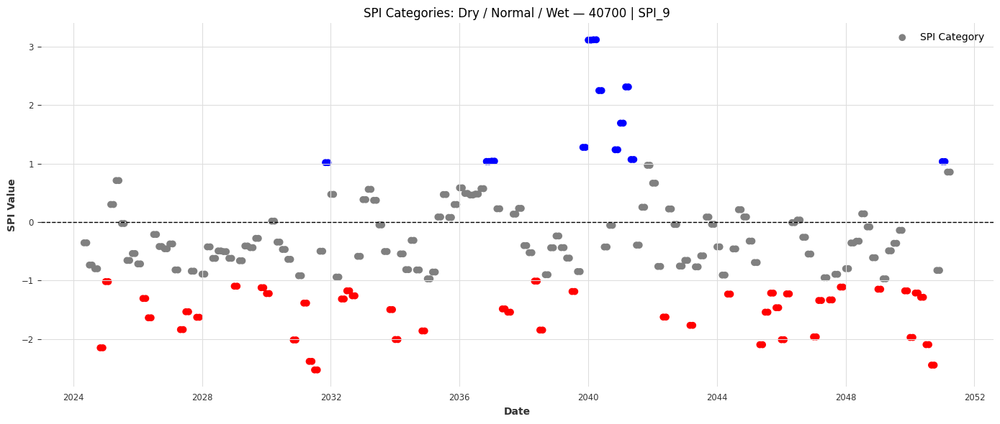

✔️ Done with 40700 | SPI_9

WBBLSTM — std_p: 1.26, corr: -0.22, rmse: 1.87, mape: 1279.26


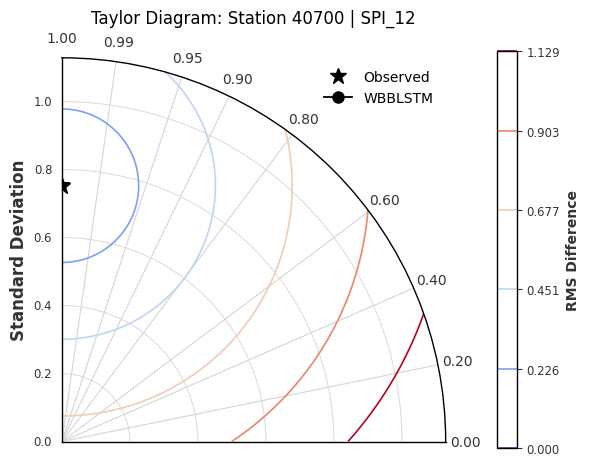

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40700 | SPI_12: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 86.06it/s, train_loss=0.103] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 85.45it/s, train_loss=0.103]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 21.47it/s]
Full approx length: 525
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (525,)
  Coeff 1: shape = (162,)


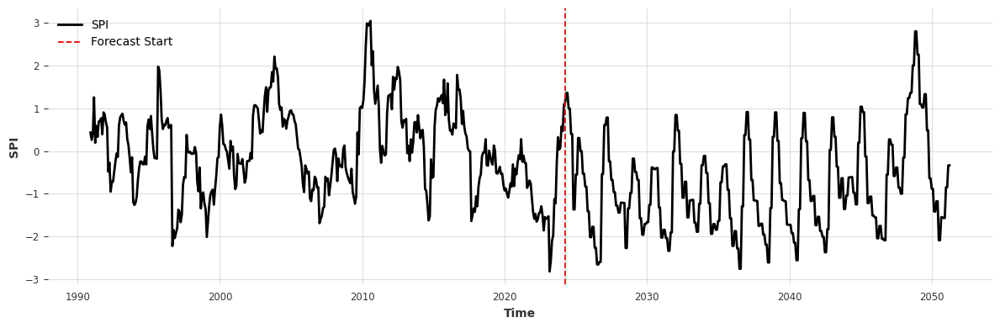

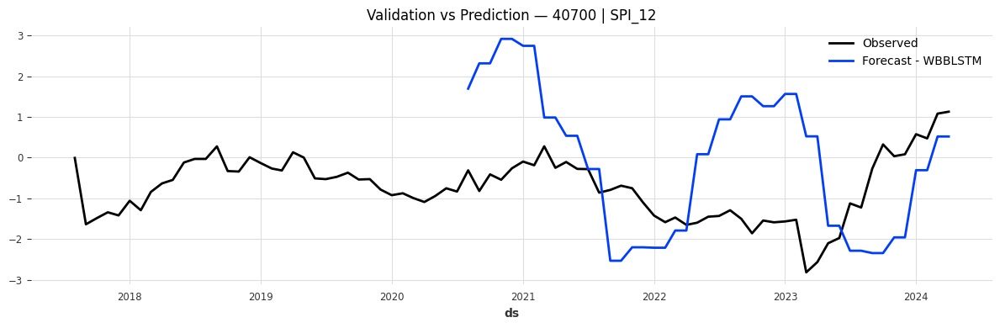

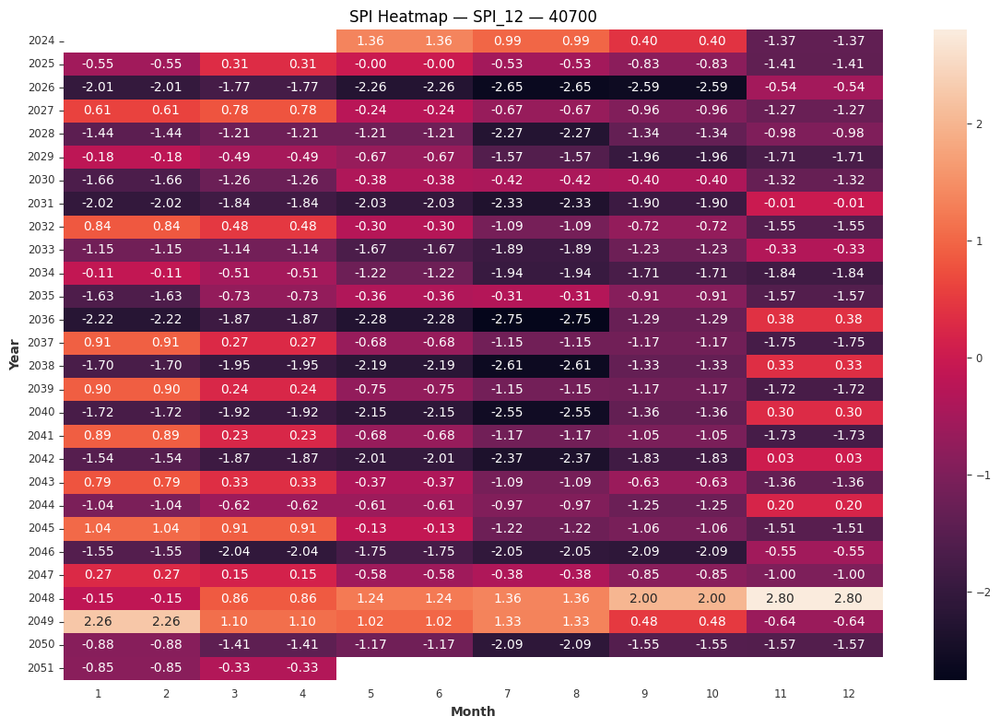

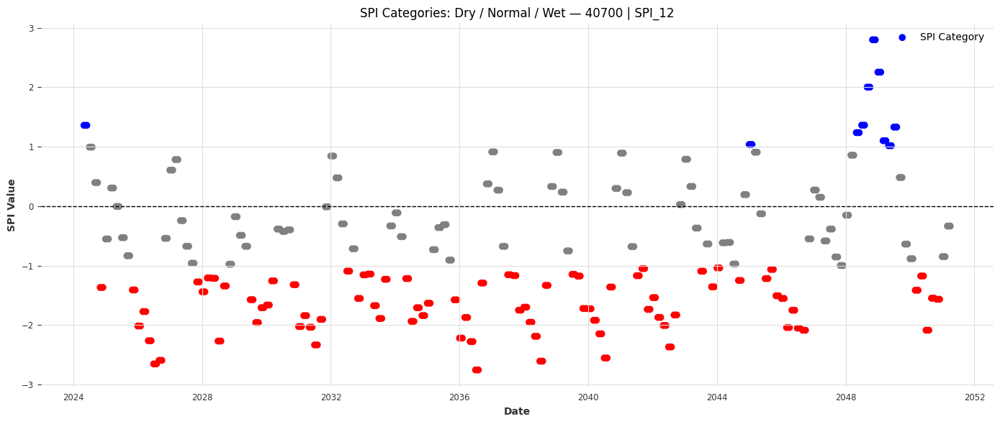

✔️ Done with 40700 | SPI_12

WBBLSTM — std_p: 1.24, corr: 0.03, rmse: 1.56, mape: 358.76


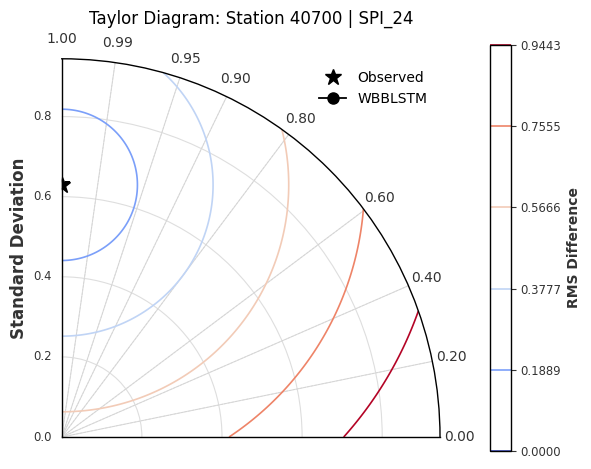

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40700 | SPI_24: WBBLSTM
Epoch 299: 100%|██████████| 11/11 [00:00<00:00, 90.12it/s, train_loss=0.0717]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 11/11 [00:00<00:00, 88.67it/s, train_loss=0.0717]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.07it/s]
Full approx length: 519
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (519,)
  Coeff 1: shape = (162,)


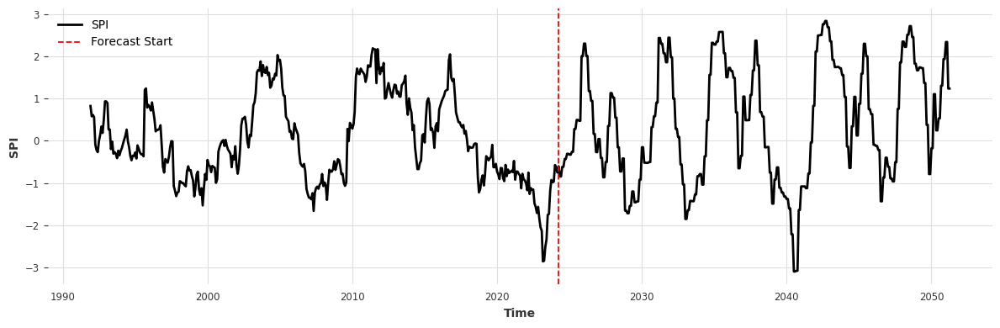

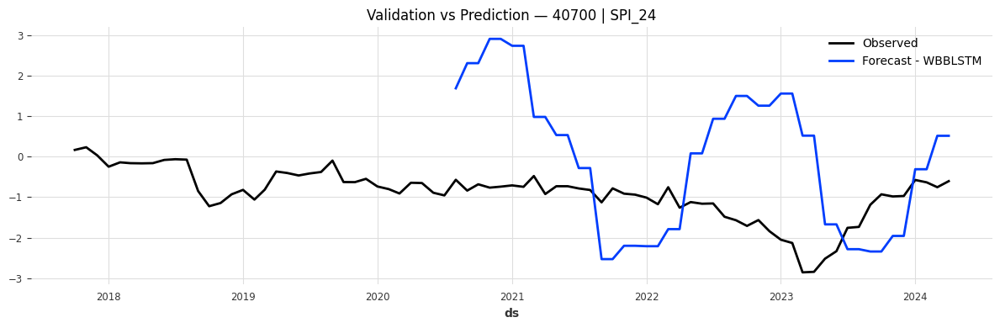

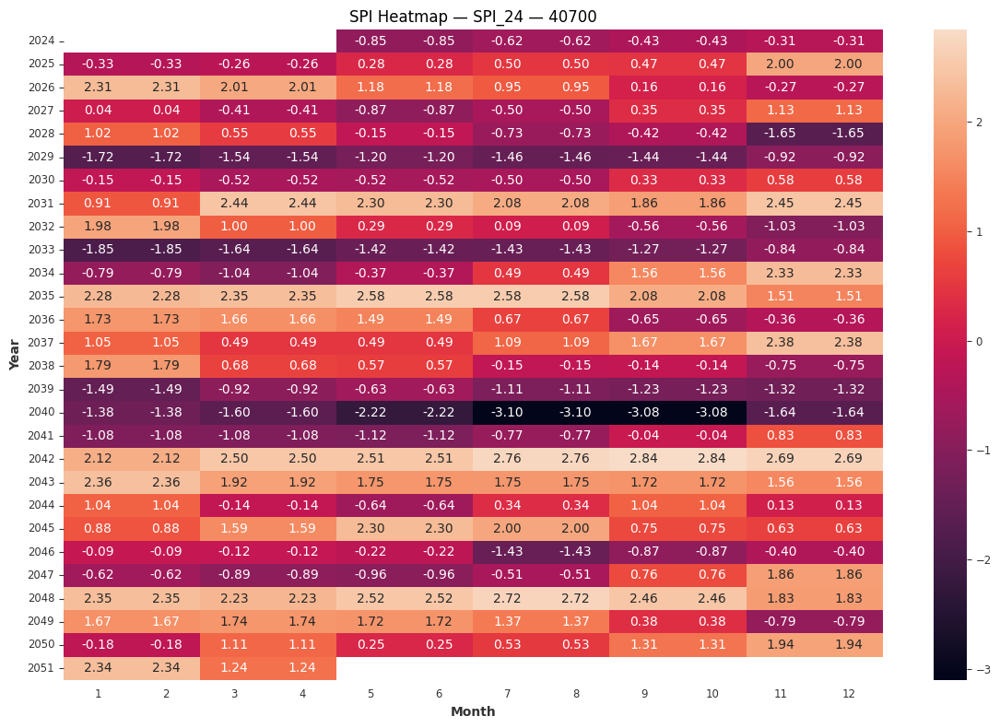

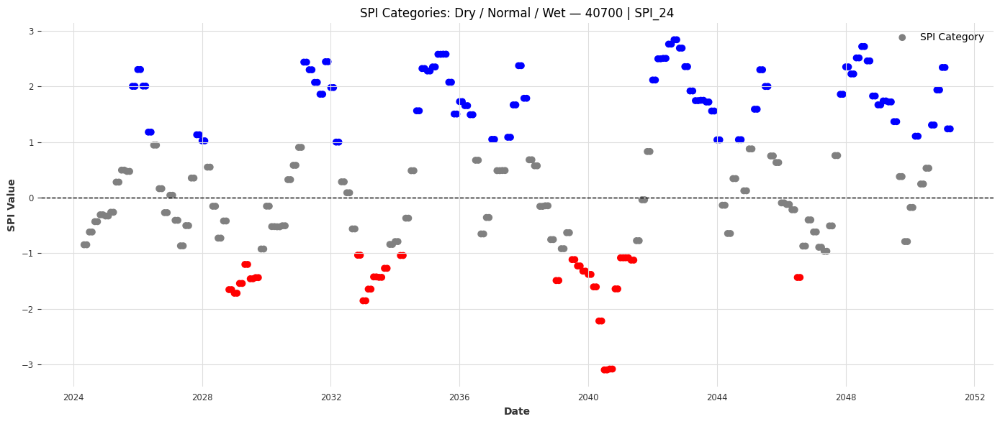

✔️ Done with 40700 | SPI_24

WBBLSTM — std_p: 0.72, corr: 0.28, rmse: 1.14, mape: 743.21


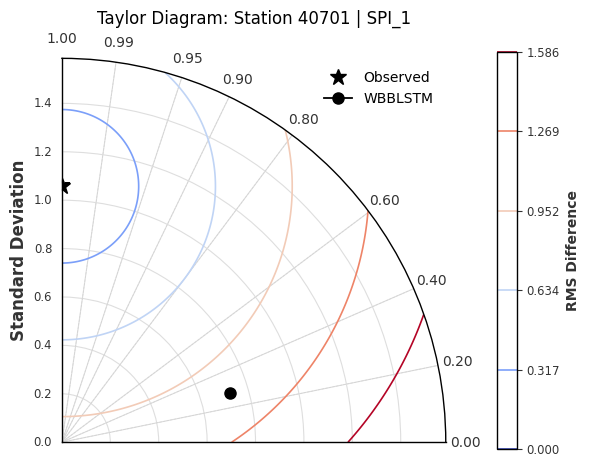

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40701 | SPI_1: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 83.64it/s, train_loss=0.236]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 82.99it/s, train_loss=0.236]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 17.07it/s]
Full approx length: 530
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (530,)
  Coeff 1: shape = (162,)


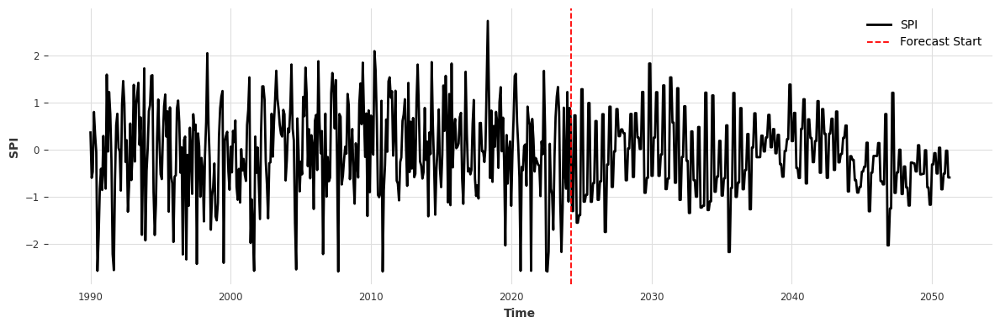

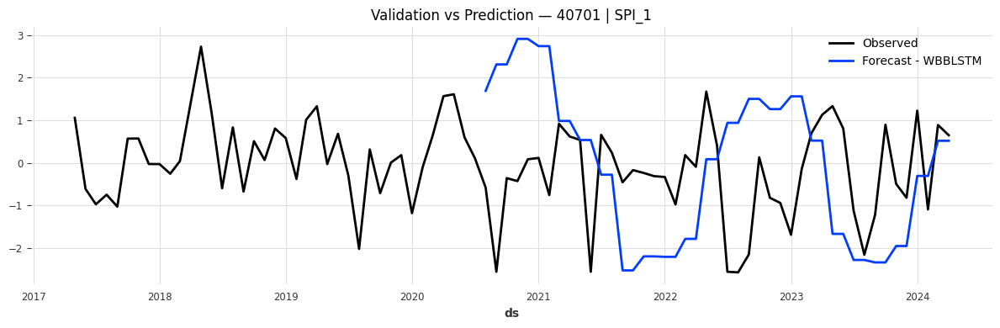

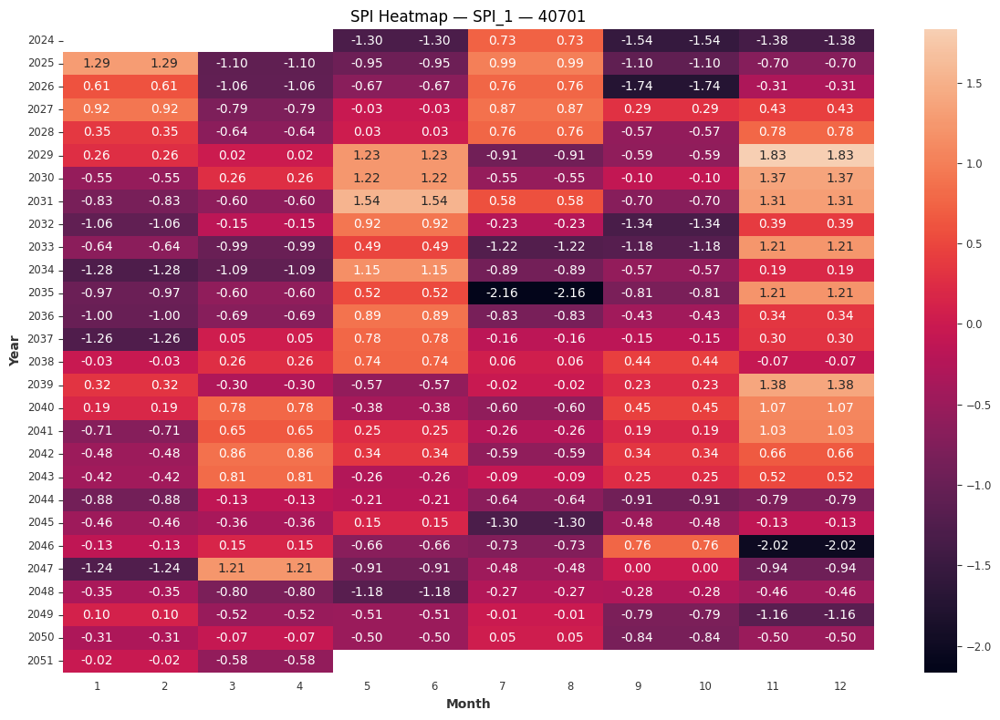

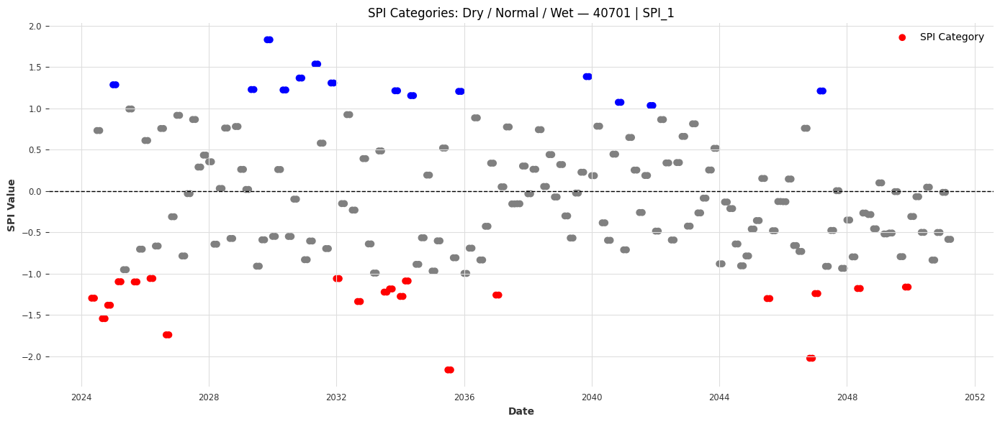

✔️ Done with 40701 | SPI_1

WBBLSTM — std_p: 0.56, corr: -0.12, rmse: 1.33, mape: 338.58


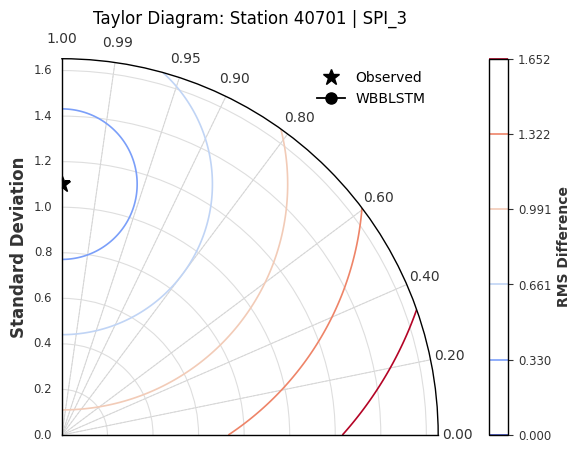

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40701 | SPI_3: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 88.75it/s, train_loss=0.173]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 87.39it/s, train_loss=0.173]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.44it/s]
Full approx length: 529
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (529,)
  Coeff 1: shape = (162,)


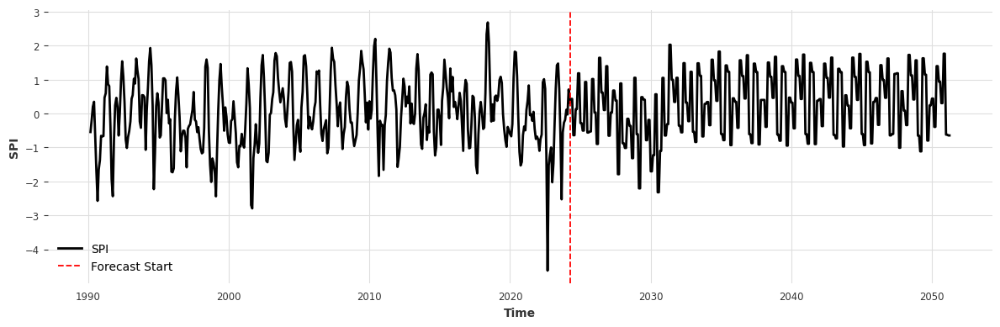

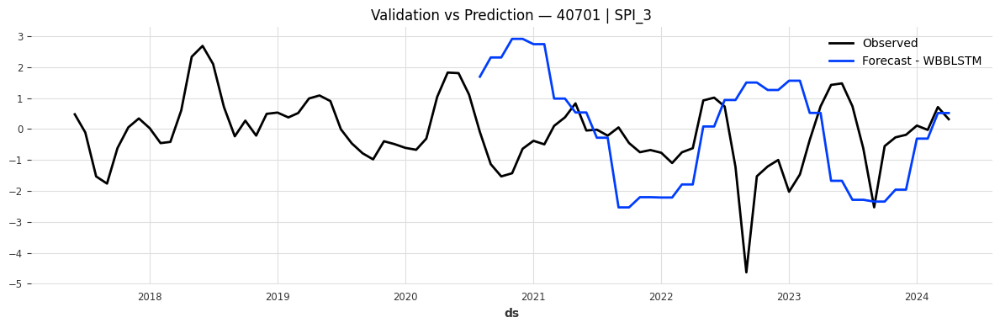

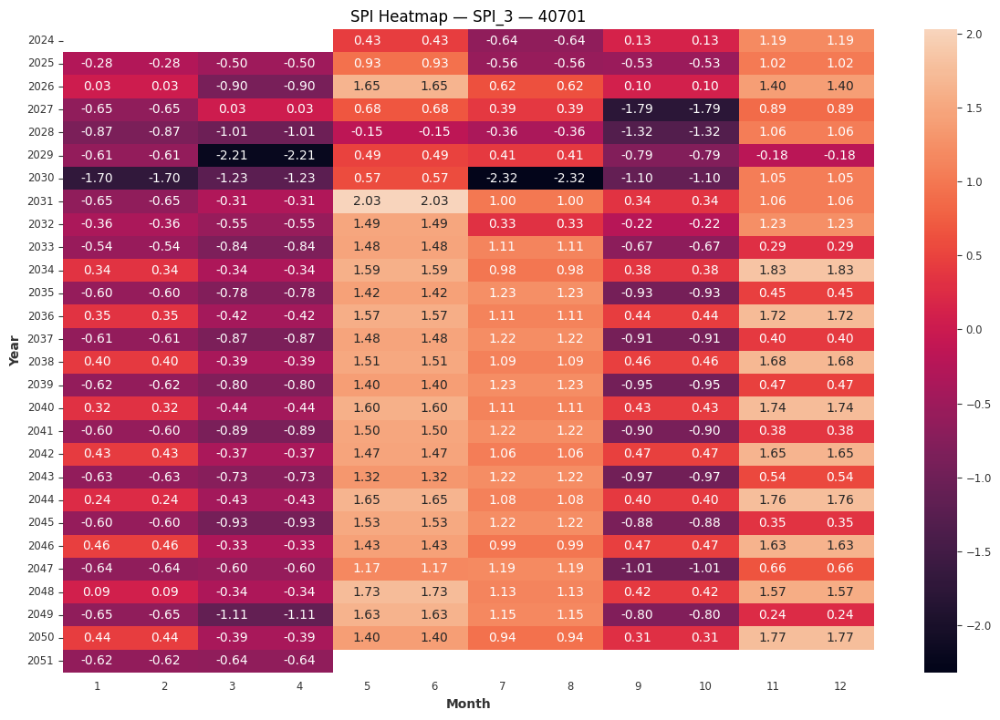

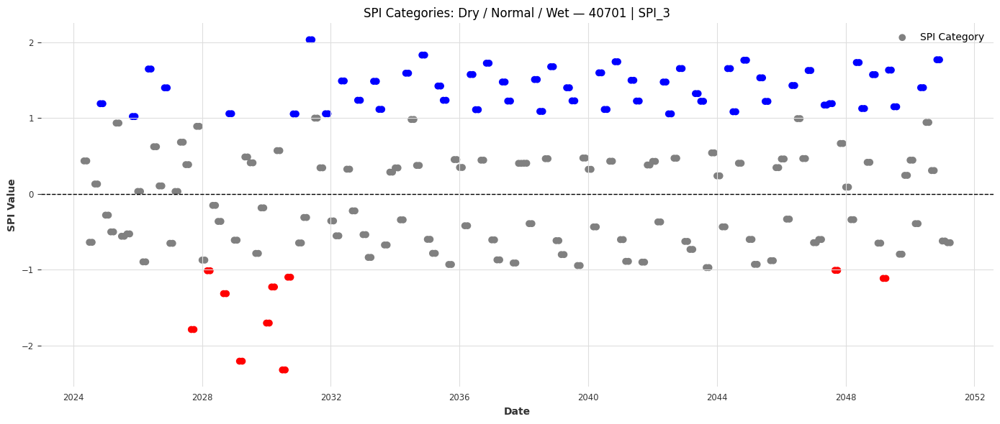

✔️ Done with 40701 | SPI_3

WBBLSTM — std_p: 1.27, corr: 0.06, rmse: 1.61, mape: 514.44


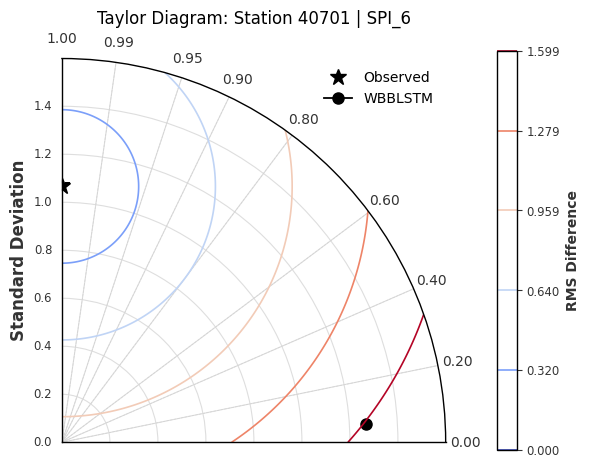

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40701 | SPI_6: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 84.81it/s, train_loss=0.114] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 83.62it/s, train_loss=0.114]

GPU available: False, used: False


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.36it/s]
Full approx length: 528
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (528,)
  Coeff 1: shape = (162,)


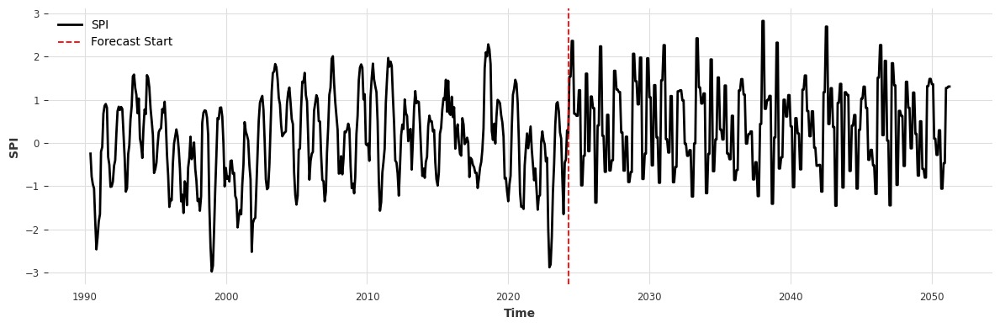

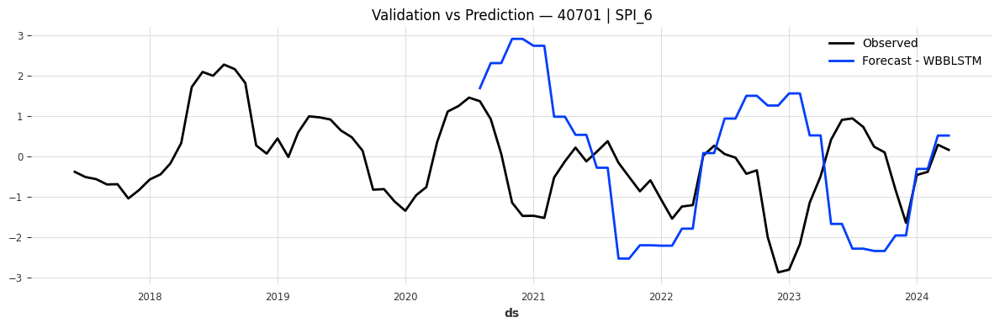

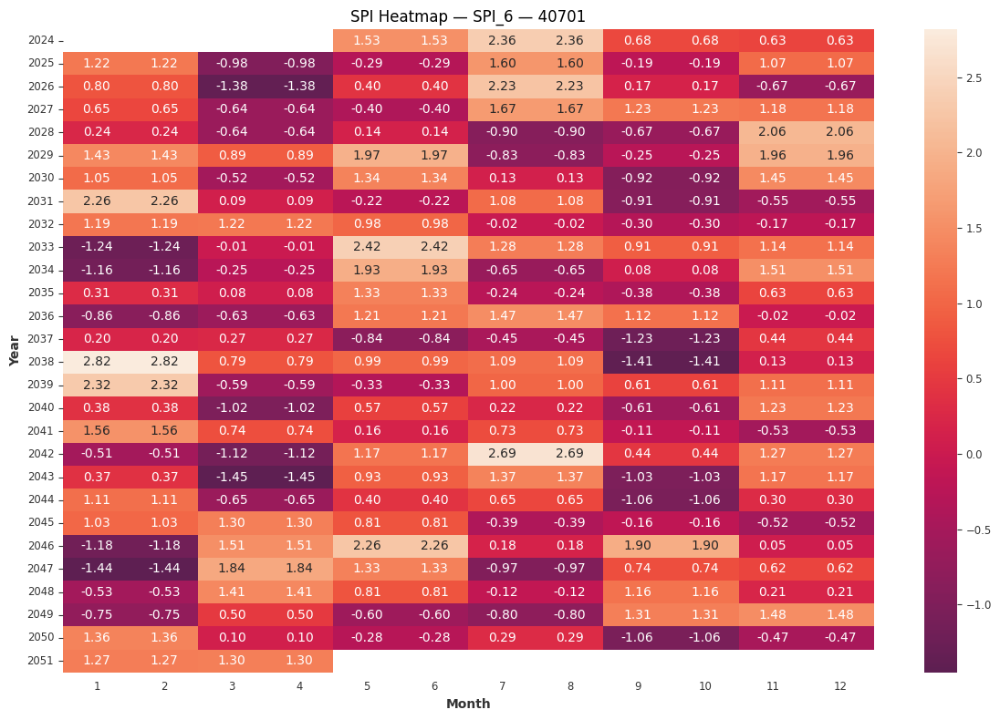

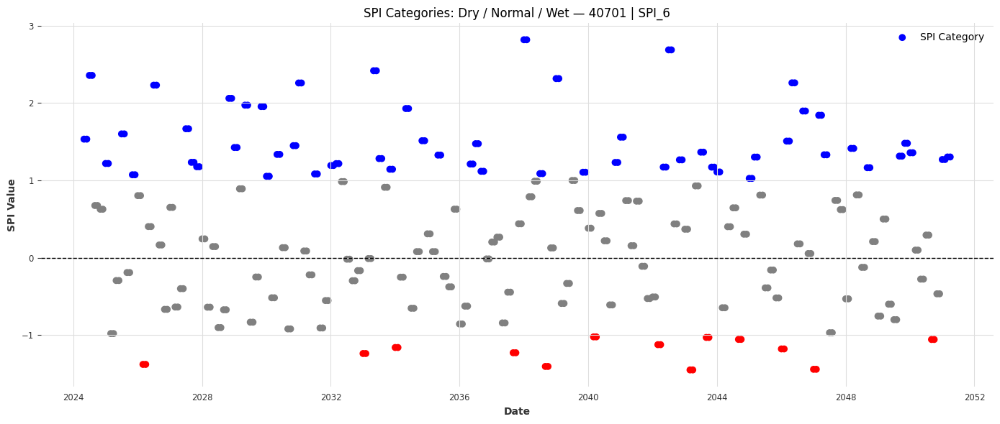

✔️ Done with 40701 | SPI_6

WBBLSTM — std_p: 0.51, corr: 0.18, rmse: 1.19, mape: 301.30


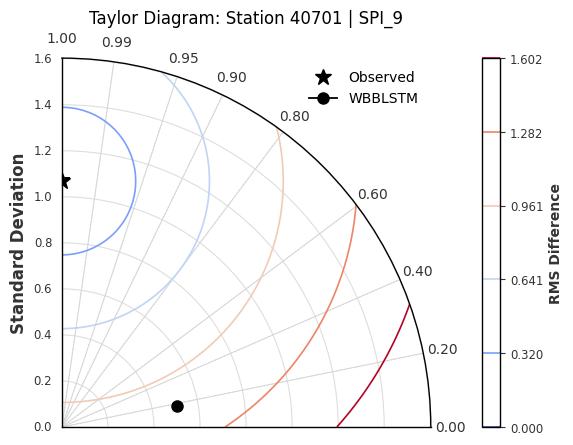

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40701 | SPI_9: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 84.89it/s, train_loss=0.148] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 84.30it/s, train_loss=0.148]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.05it/s]
Full approx length: 526
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (526,)
  Coeff 1: shape = (162,)


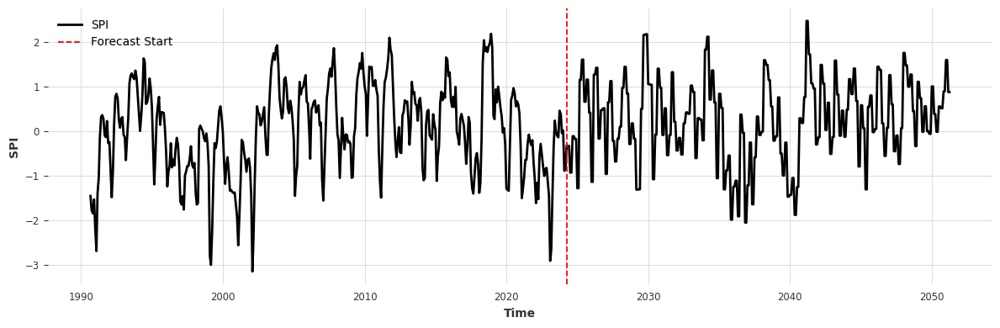

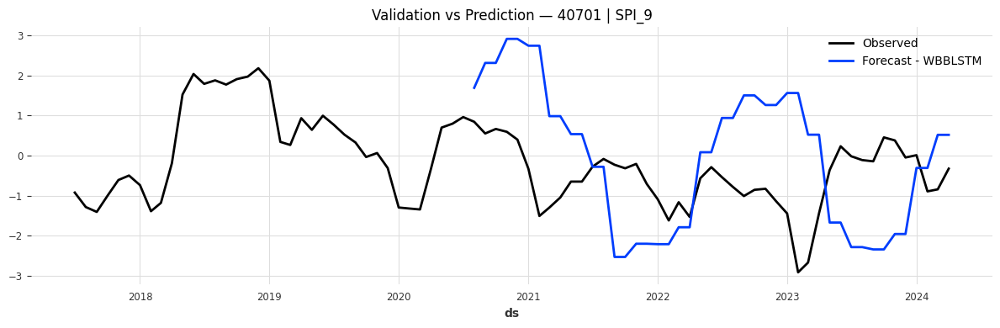

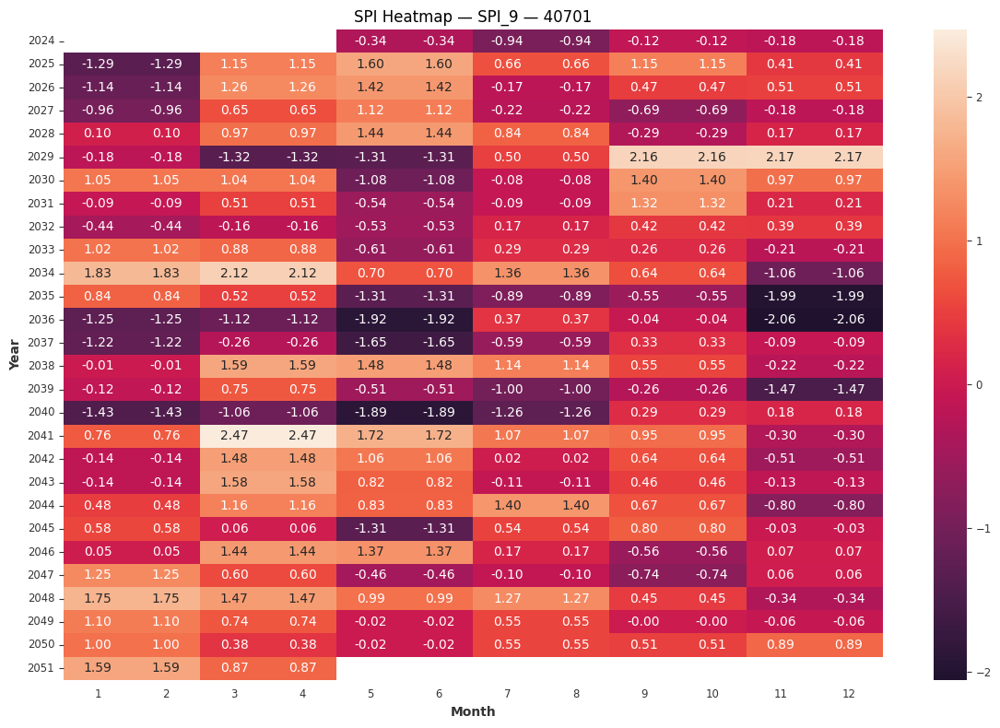

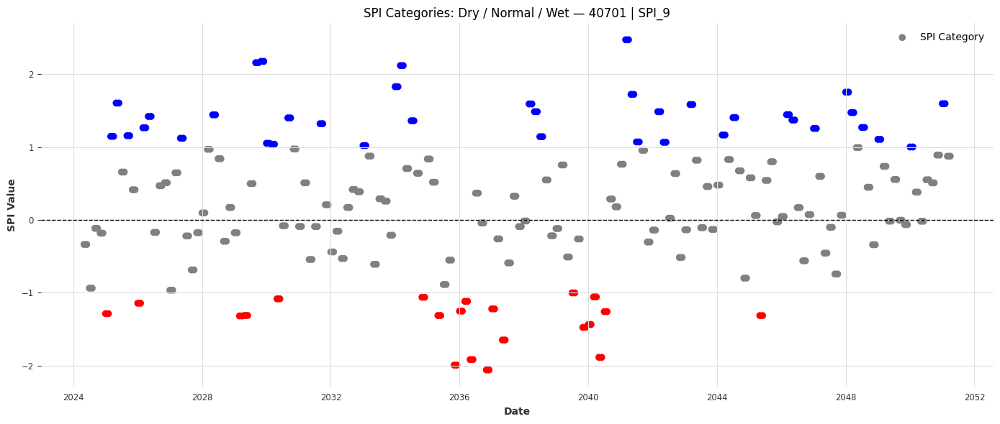

✔️ Done with 40701 | SPI_9

WBBLSTM — std_p: 1.40, corr: -0.43, rmse: 2.19, mape: 319.42


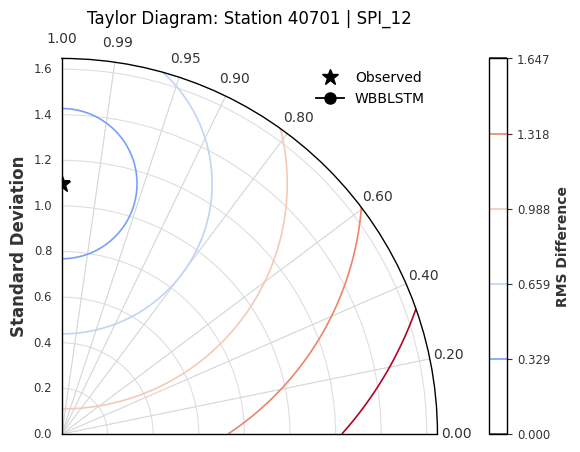

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40701 | SPI_12: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 88.64it/s, train_loss=0.108] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 87.35it/s, train_loss=0.108]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 20.90it/s]
Full approx length: 525
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (525,)
  Coeff 1: shape = (162,)


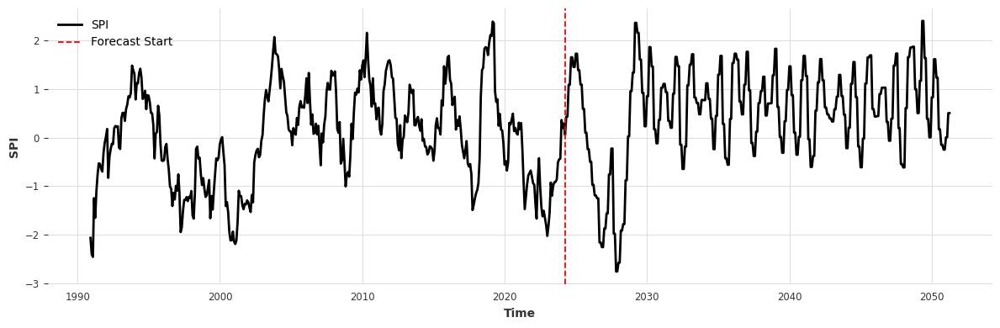

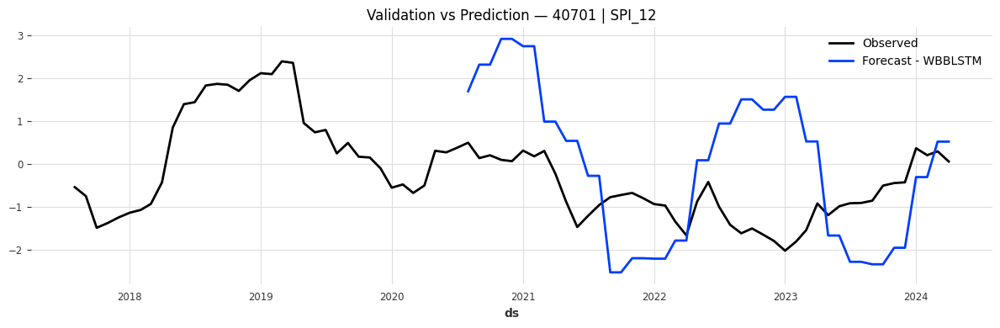

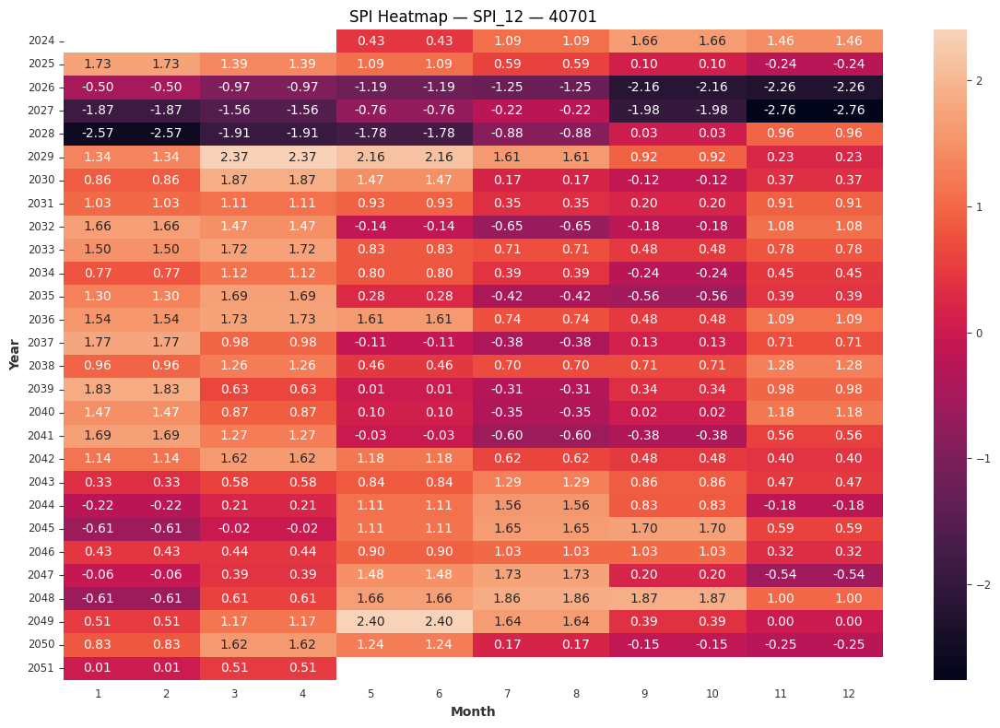

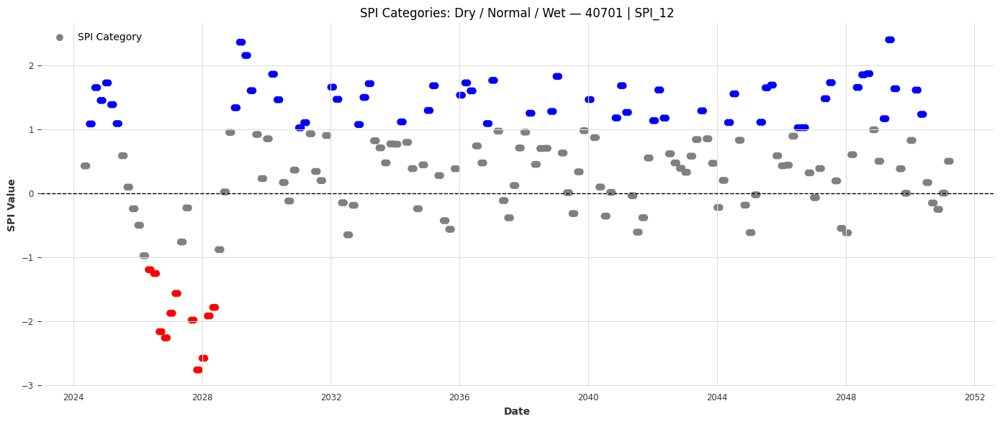

✔️ Done with 40701 | SPI_12

WBBLSTM — std_p: 1.39, corr: -0.35, rmse: 2.17, mape: 306.02


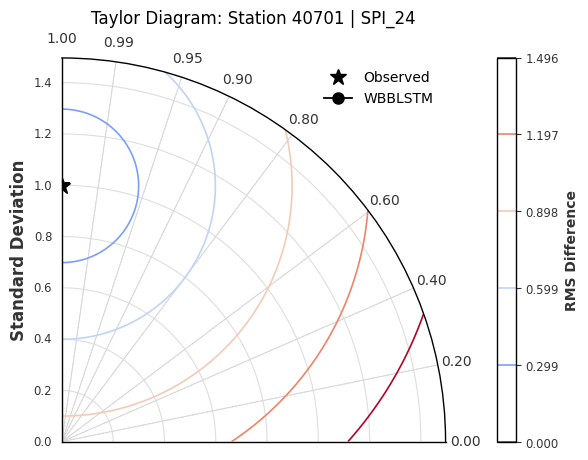

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40701 | SPI_24: WBBLSTM
Epoch 299: 100%|██████████| 11/11 [00:00<00:00, 84.38it/s, train_loss=0.0581]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 11/11 [00:00<00:00, 83.11it/s, train_loss=0.0581]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.35it/s]
Full approx length: 519
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (519,)
  Coeff 1: shape = (162,)


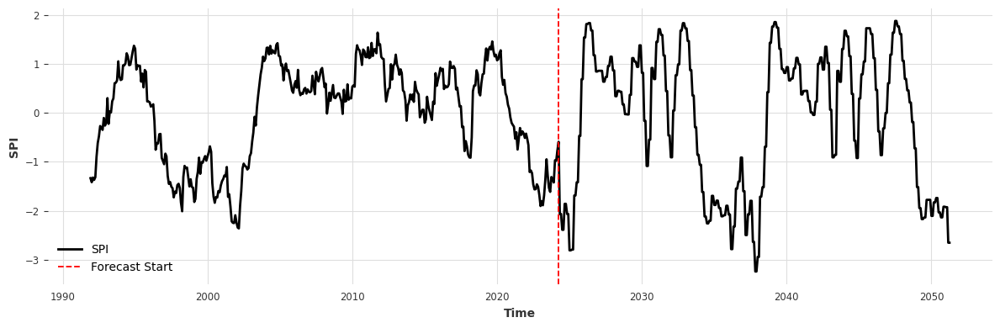

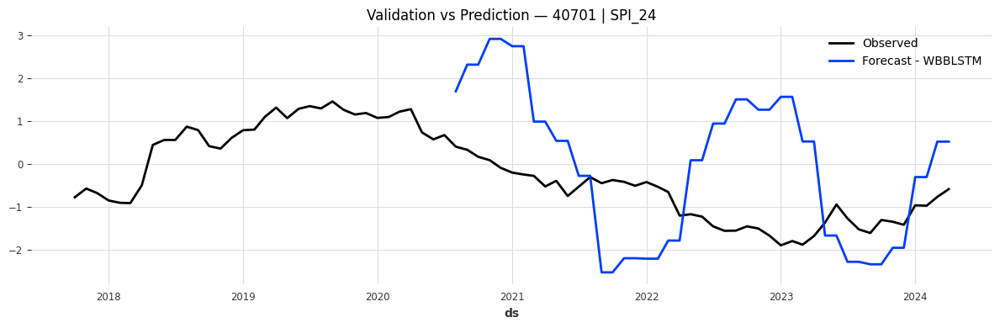

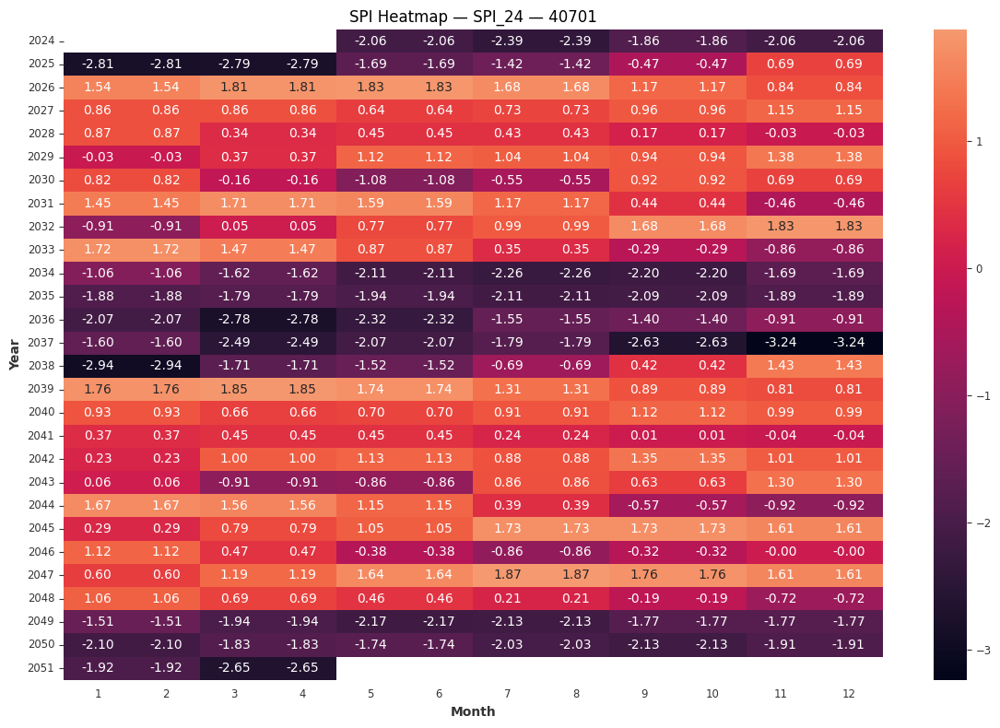

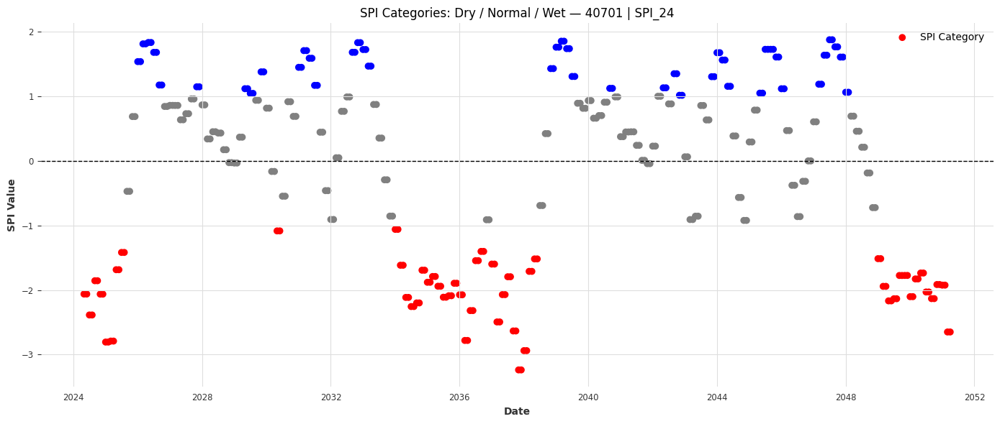

✔️ Done with 40701 | SPI_24

WBBLSTM — std_p: 0.87, corr: 0.06, rmse: 1.25, mape: 787.41


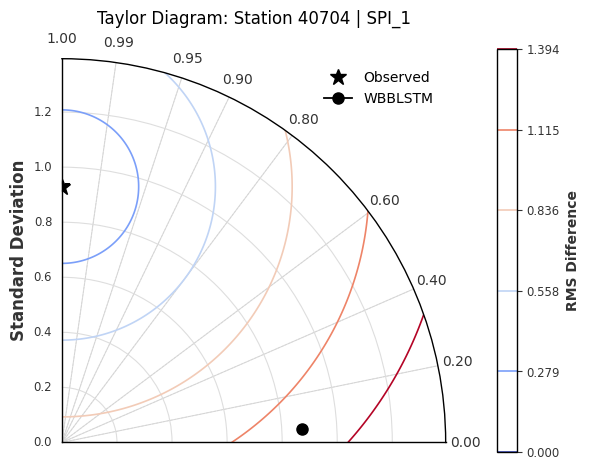

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40704 | SPI_1: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 84.85it/s, train_loss=0.306]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 84.26it/s, train_loss=0.306]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 13.57it/s]
Full approx length: 530
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (530,)
  Coeff 1: shape = (162,)


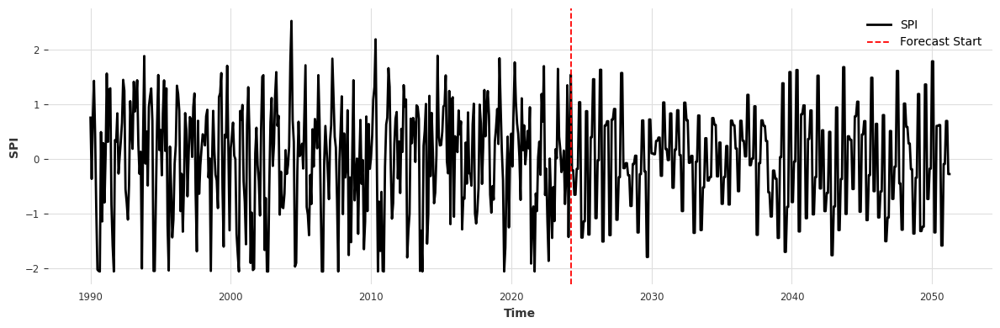

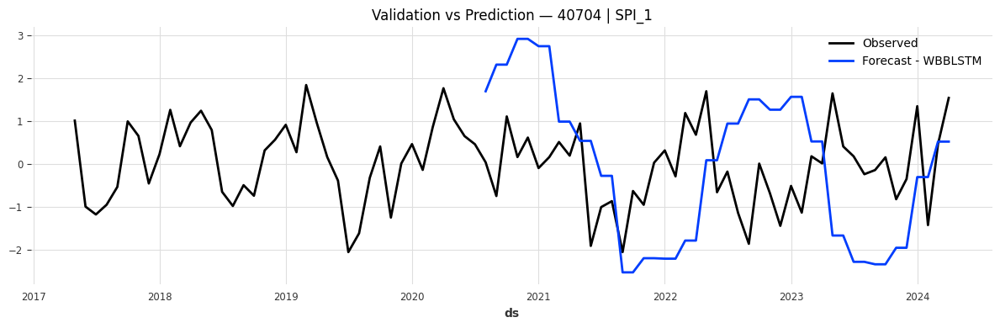

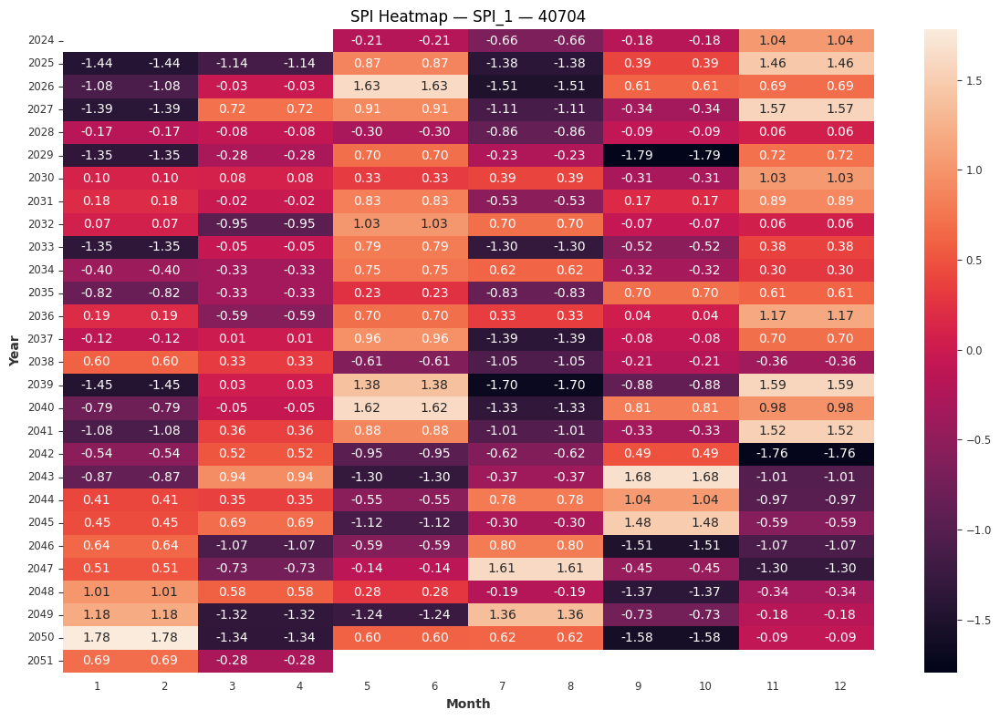

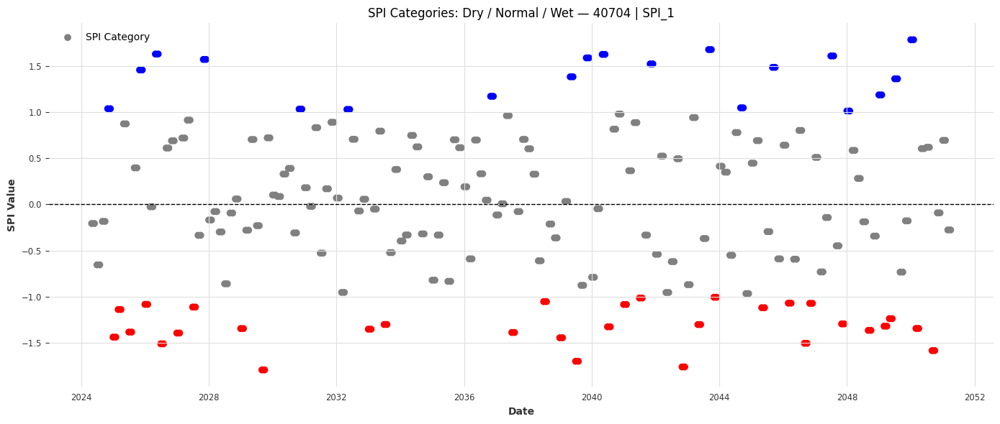

✔️ Done with 40704 | SPI_1

WBBLSTM — std_p: 0.80, corr: 0.06, rmse: 1.22, mape: 192.76


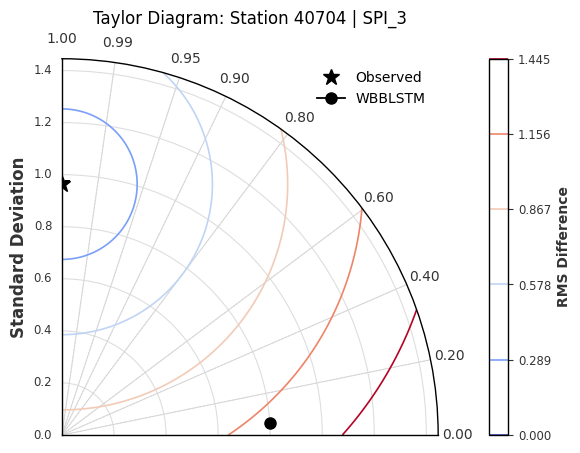

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40704 | SPI_3: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 77.17it/s, train_loss=0.249]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 76.19it/s, train_loss=0.249]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 21.11it/s]
Full approx length: 529
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (529,)
  Coeff 1: shape = (162,)


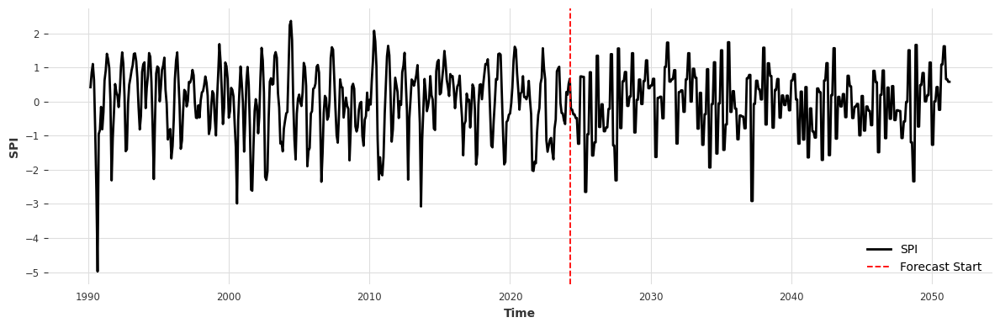

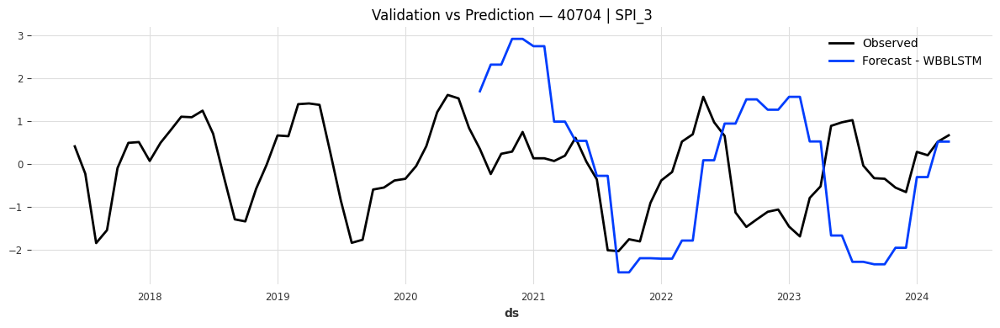

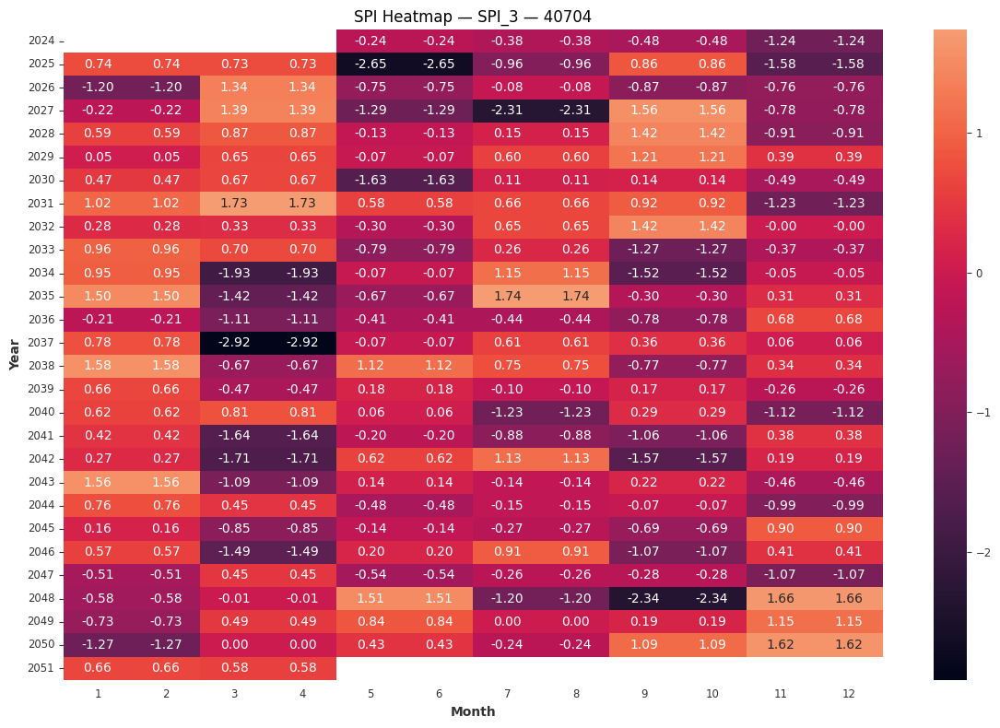

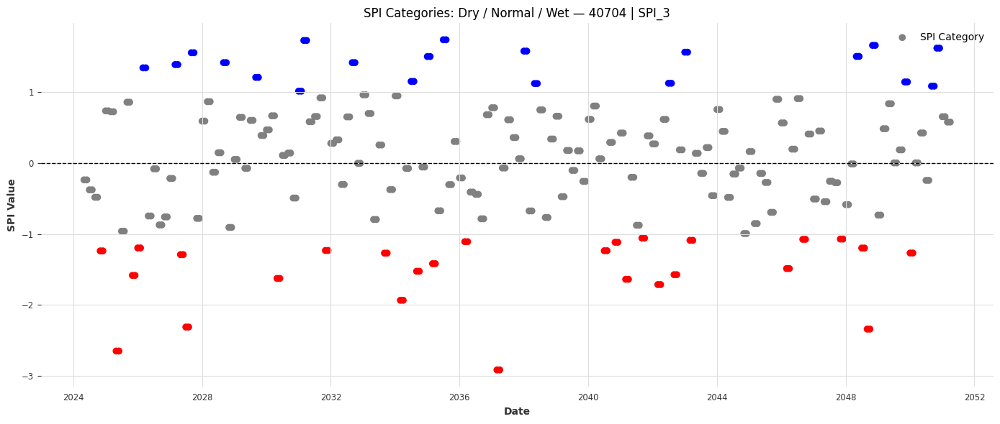

✔️ Done with 40704 | SPI_3

WBBLSTM — std_p: 1.07, corr: 0.16, rmse: 1.46, mape: 270.12


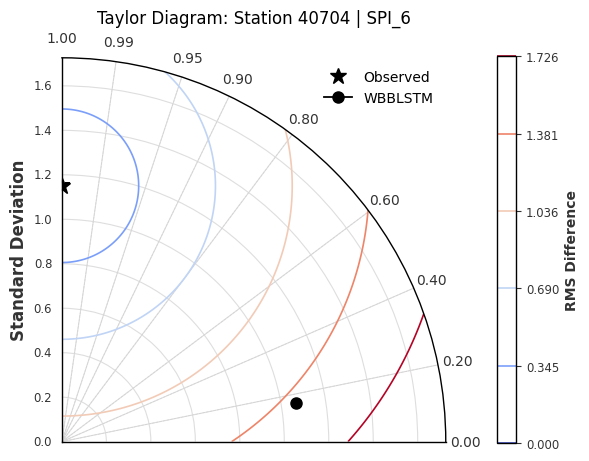

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40704 | SPI_6: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 77.84it/s, train_loss=0.130] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 76.59it/s, train_loss=0.130]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.68it/s]
Full approx length: 528
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (528,)
  Coeff 1: shape = (162,)


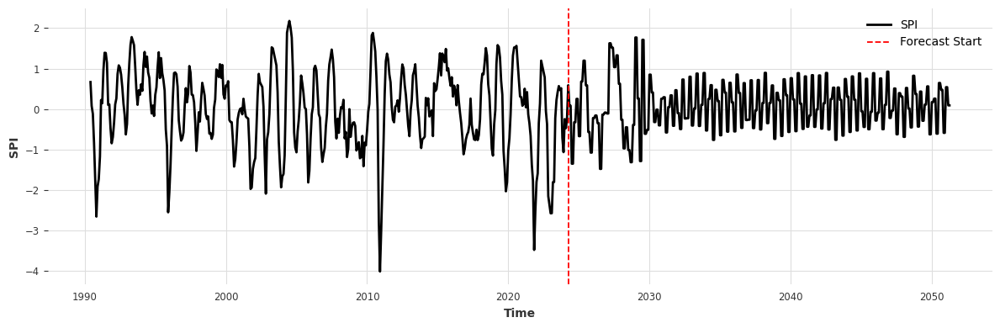

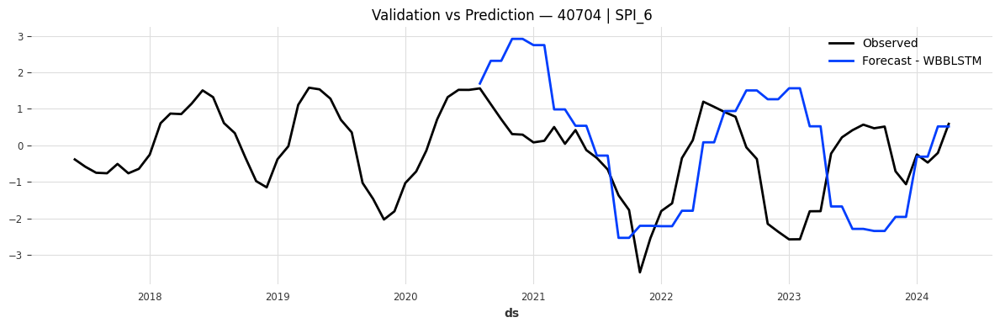

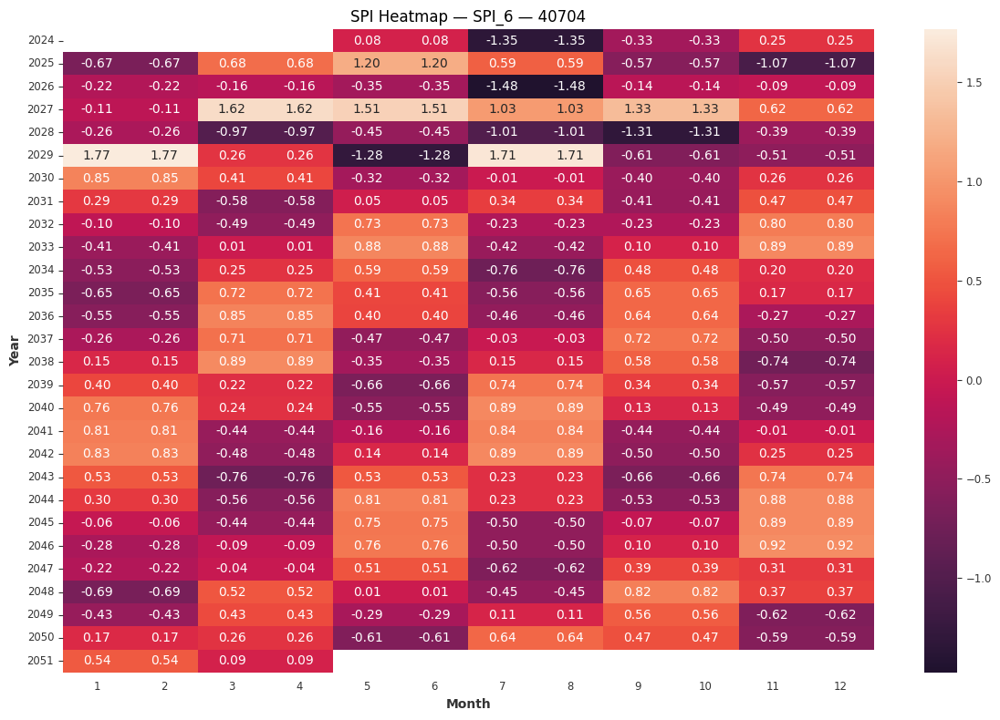

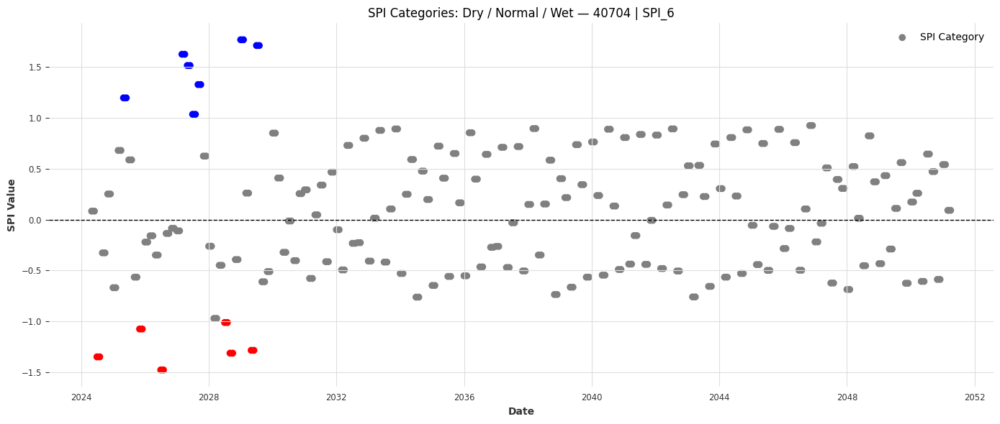

✔️ Done with 40704 | SPI_6

WBBLSTM — std_p: 1.09, corr: 0.22, rmse: 1.40, mape: 536.24


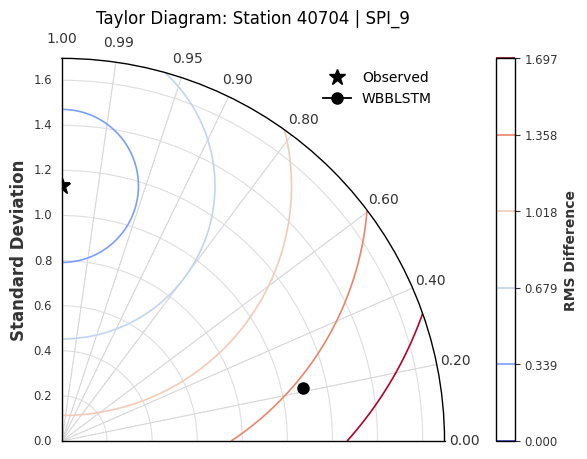

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40704 | SPI_9: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 75.05it/s, train_loss=0.208] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 74.35it/s, train_loss=0.208]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.05it/s]
Full approx length: 526
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (526,)
  Coeff 1: shape = (162,)


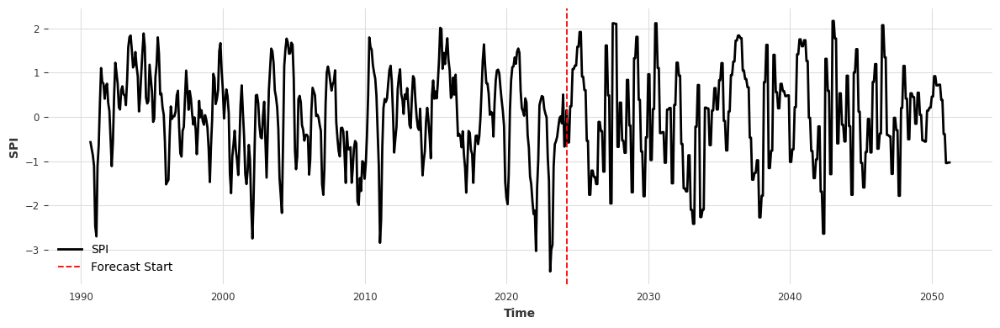

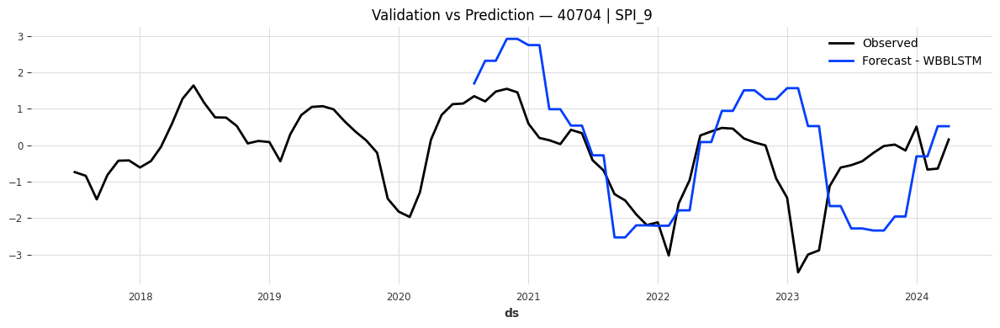

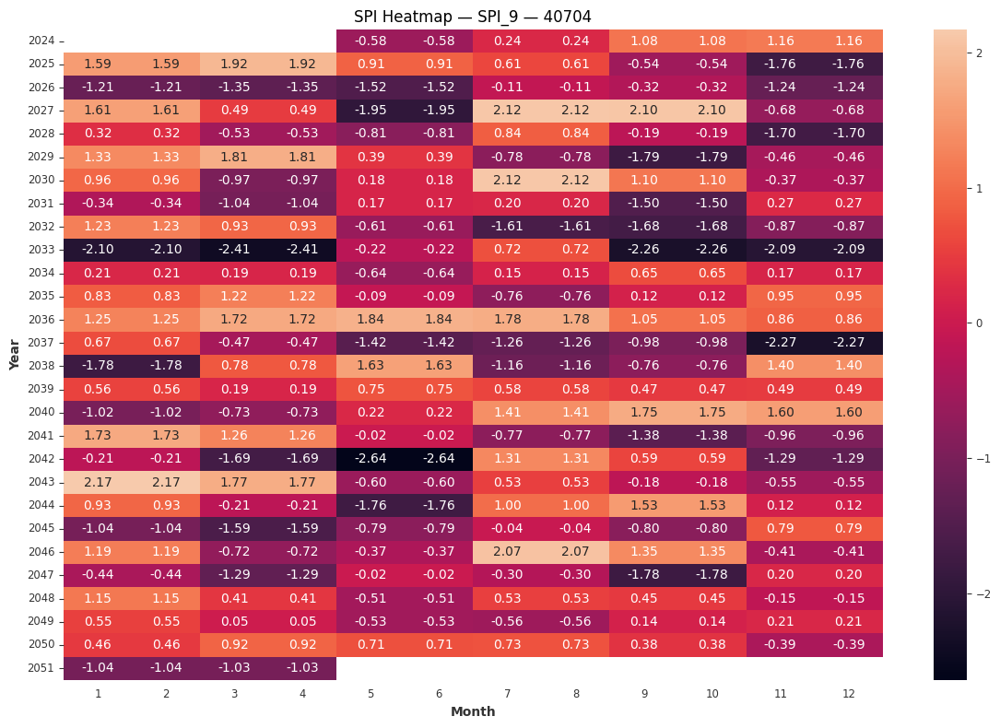

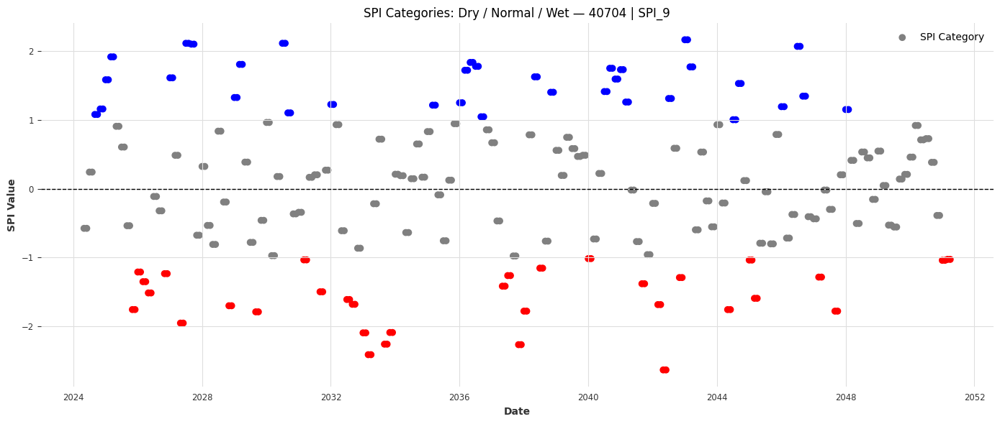

✔️ Done with 40704 | SPI_9

WBBLSTM — std_p: 0.99, corr: 0.03, rmse: 1.45, mape: 472.51


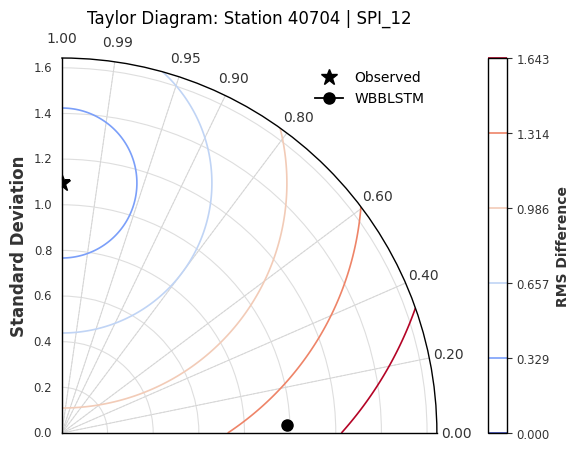

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40704 | SPI_12: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 71.59it/s, train_loss=0.210] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 70.75it/s, train_loss=0.210]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 12.16it/s]
Full approx length: 525
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (525,)
  Coeff 1: shape = (162,)


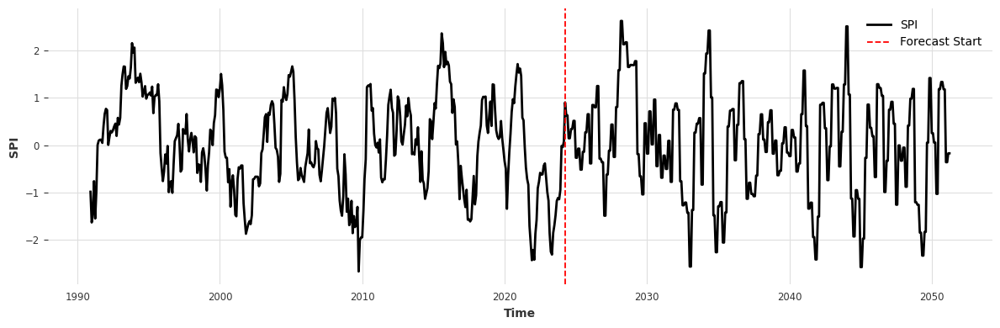

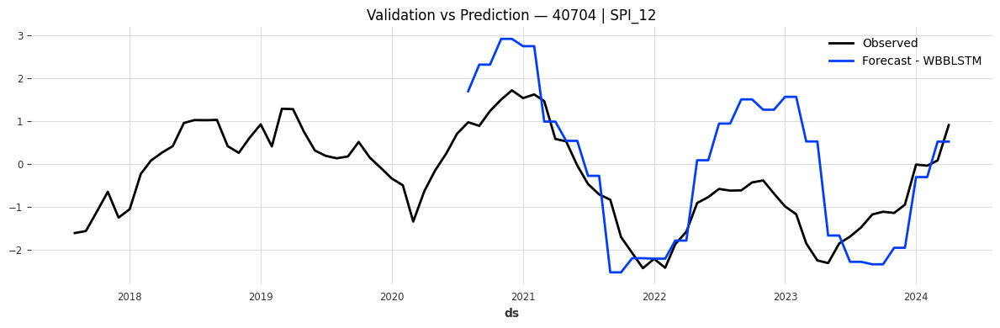

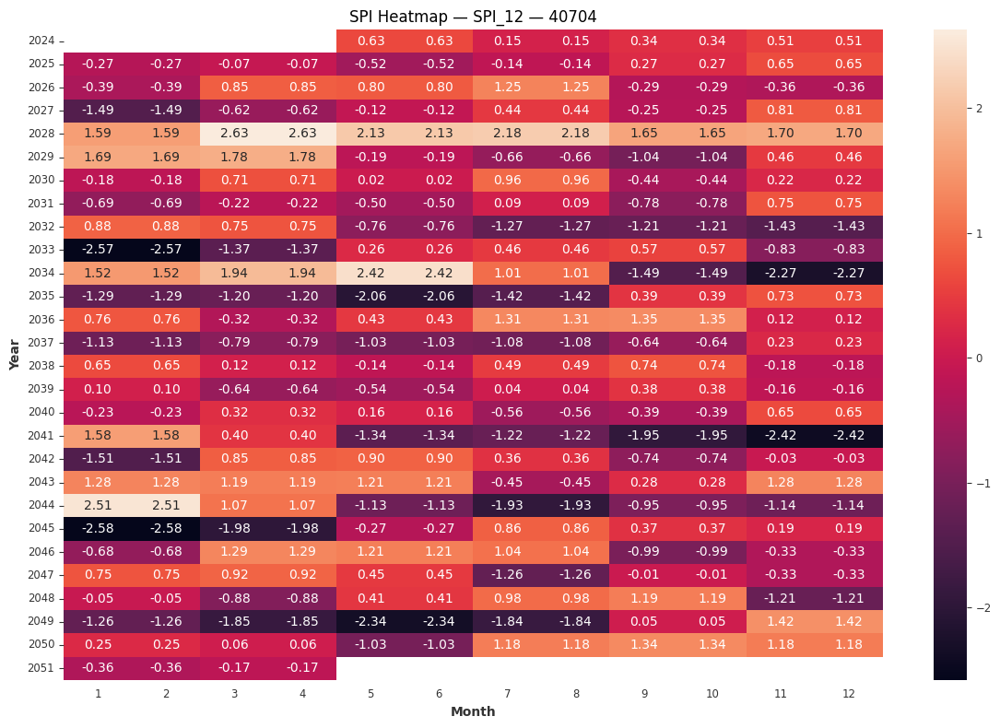

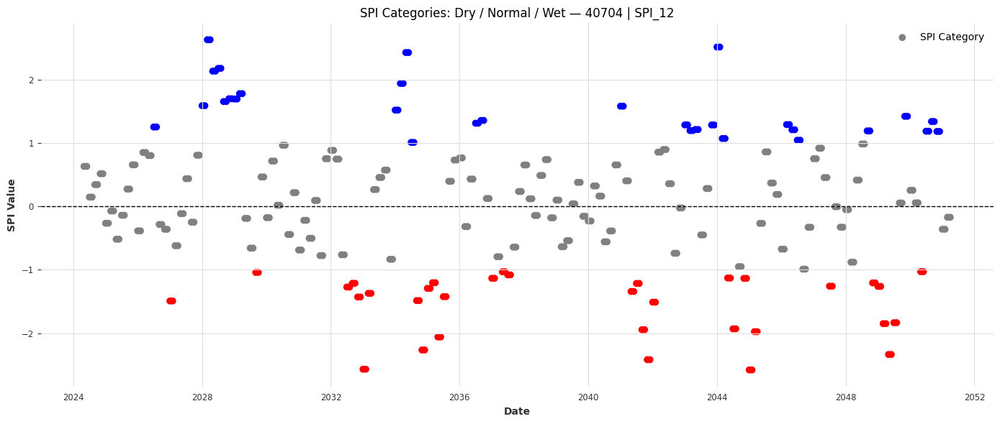

✔️ Done with 40704 | SPI_12

WBBLSTM — std_p: 0.09, corr: 0.14, rmse: 0.99, mape: 119.35


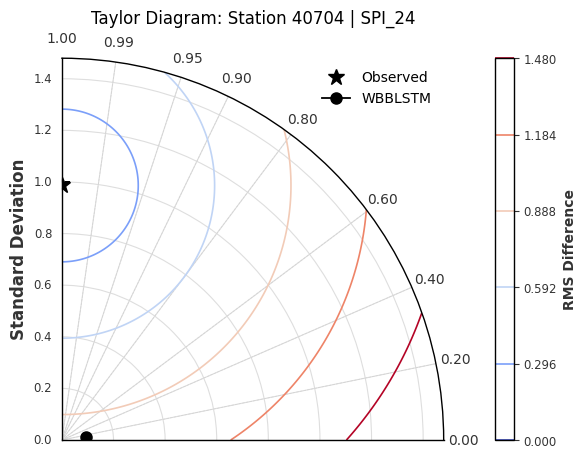

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40704 | SPI_24: WBBLSTM
Epoch 299: 100%|██████████| 11/11 [00:00<00:00, 79.81it/s, train_loss=0.0789]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 11/11 [00:00<00:00, 78.64it/s, train_loss=0.0789]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 17.24it/s]
Full approx length: 519
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (519,)
  Coeff 1: shape = (162,)


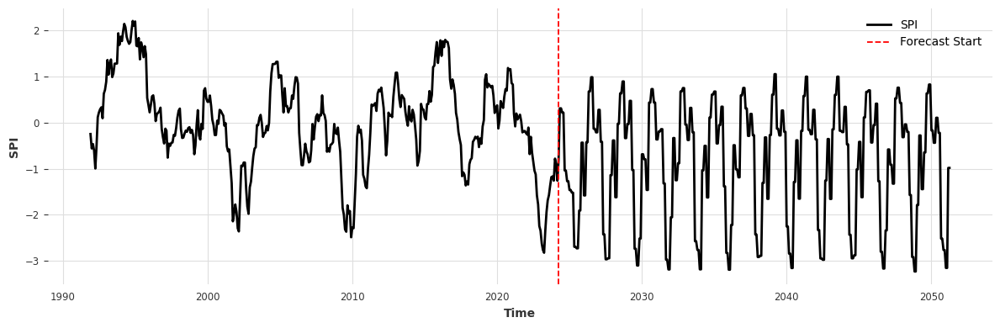

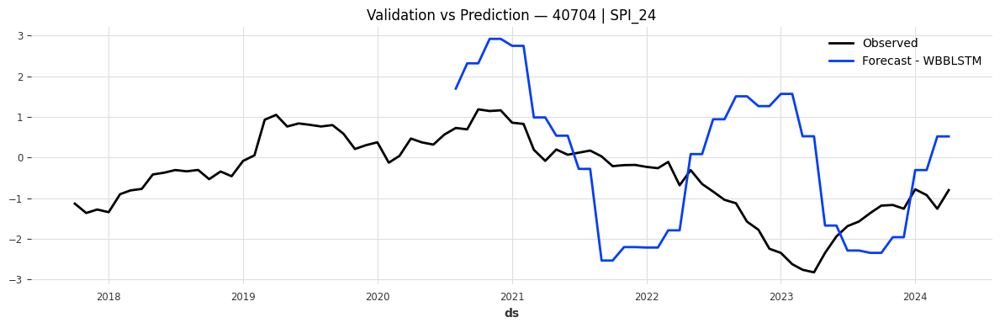

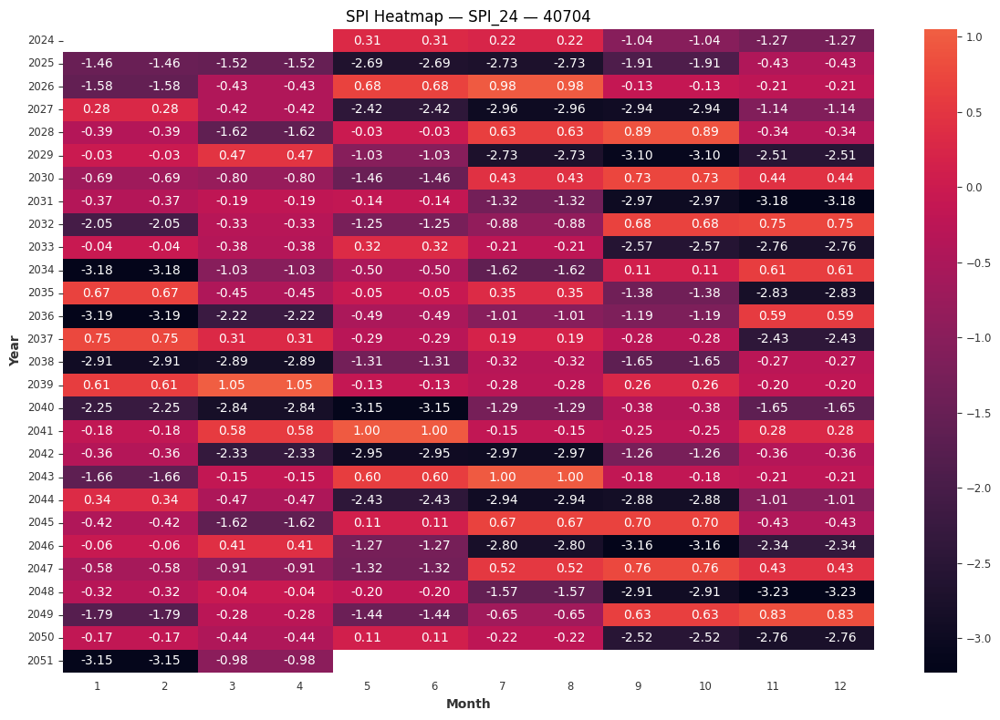

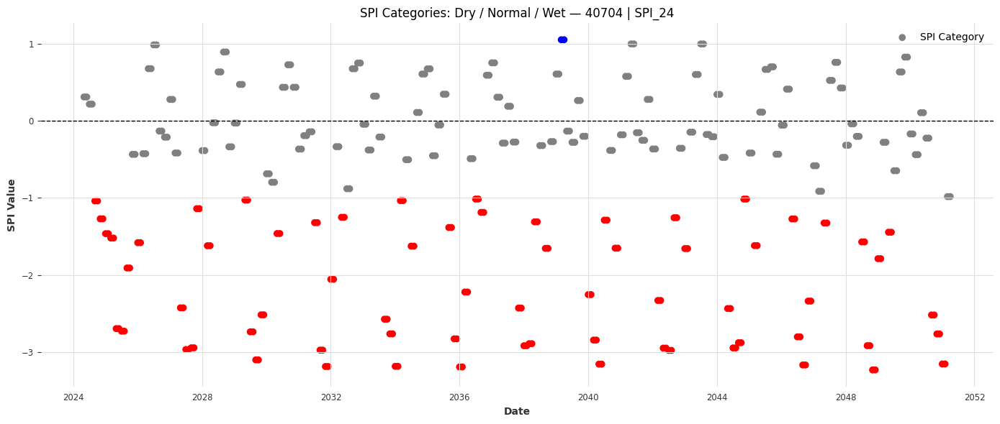

✔️ Done with 40704 | SPI_24

WBBLSTM — std_p: 0.84, corr: -0.06, rmse: 1.27, mape: 456.44


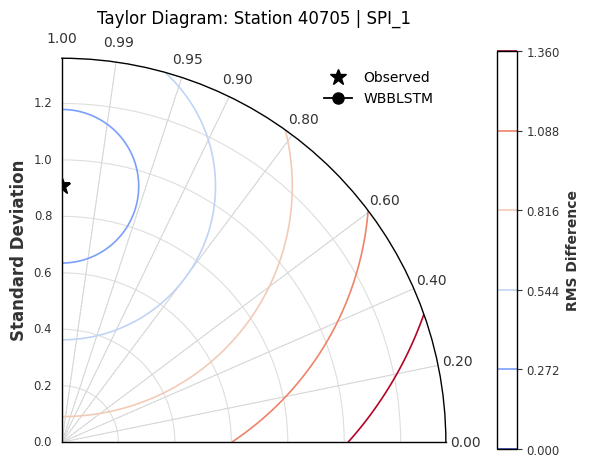

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40705 | SPI_1: WBBLSTM
Epoch 299: 100%|██████████| 10/10 [00:00<00:00, 78.38it/s, train_loss=0.161]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 10/10 [00:00<00:00, 76.87it/s, train_loss=0.161]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 14.91it/s]
Full approx length: 499
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (499,)
  Coeff 1: shape = (162,)


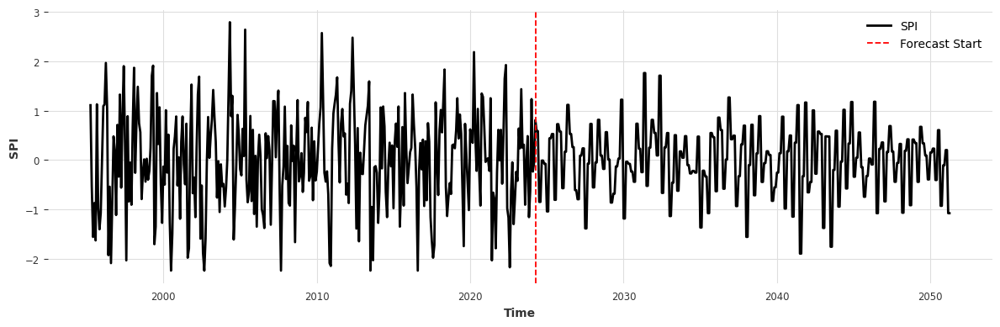

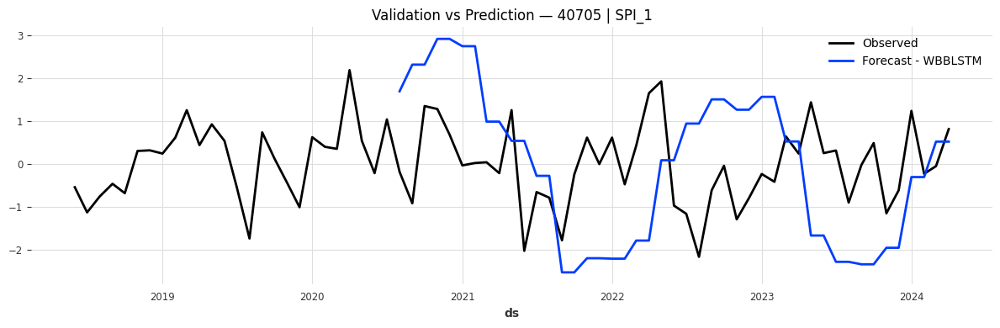

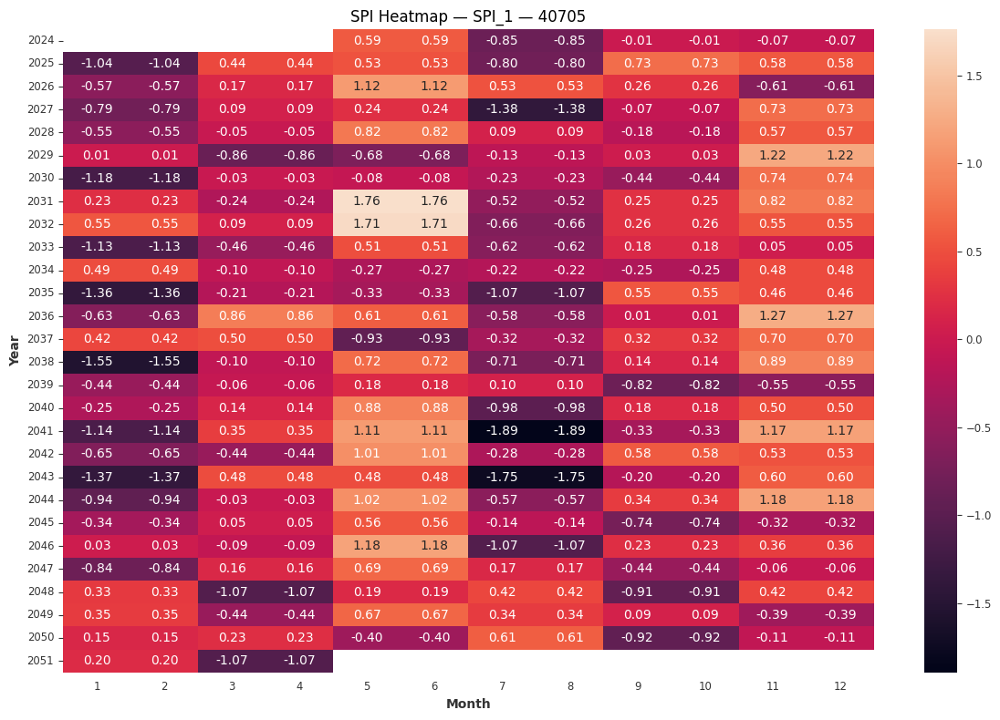

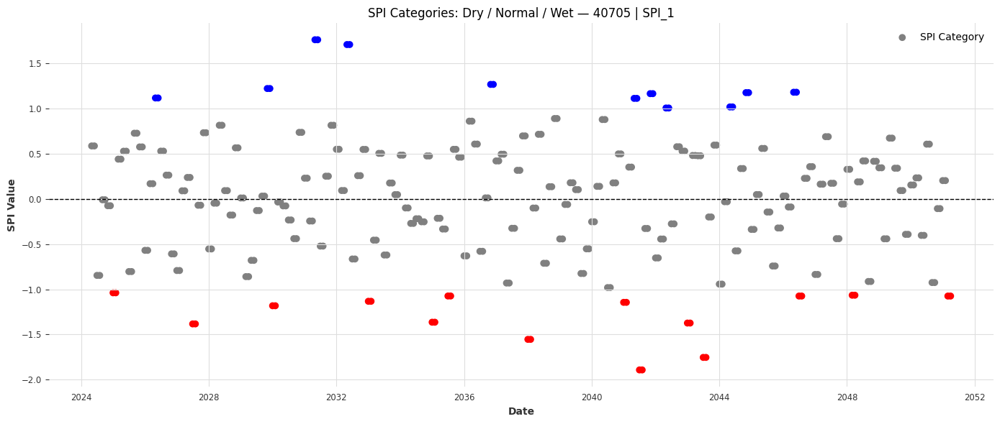

✔️ Done with 40705 | SPI_1

WBBLSTM — std_p: 1.08, corr: -0.13, rmse: 1.51, mape: 648.22


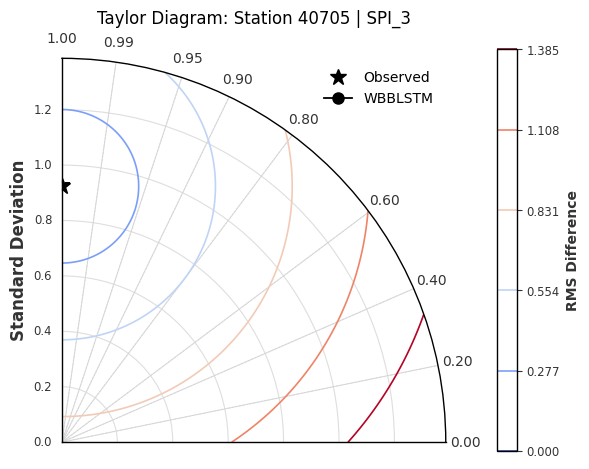

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40705 | SPI_3: WBBLSTM
Epoch 299: 100%|██████████| 10/10 [00:00<00:00, 79.55it/s, train_loss=0.254]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 10/10 [00:00<00:00, 78.92it/s, train_loss=0.254]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 19.35it/s]
Full approx length: 498
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (498,)
  Coeff 1: shape = (162,)


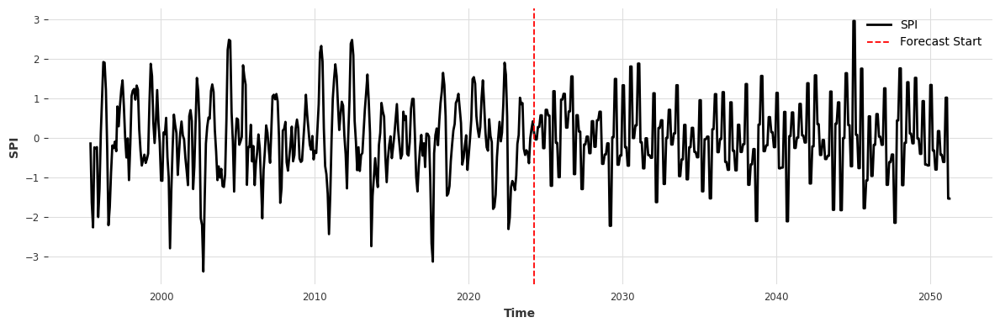

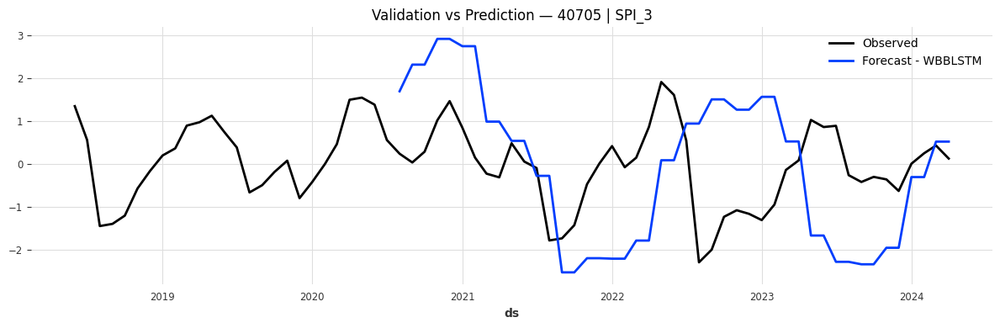

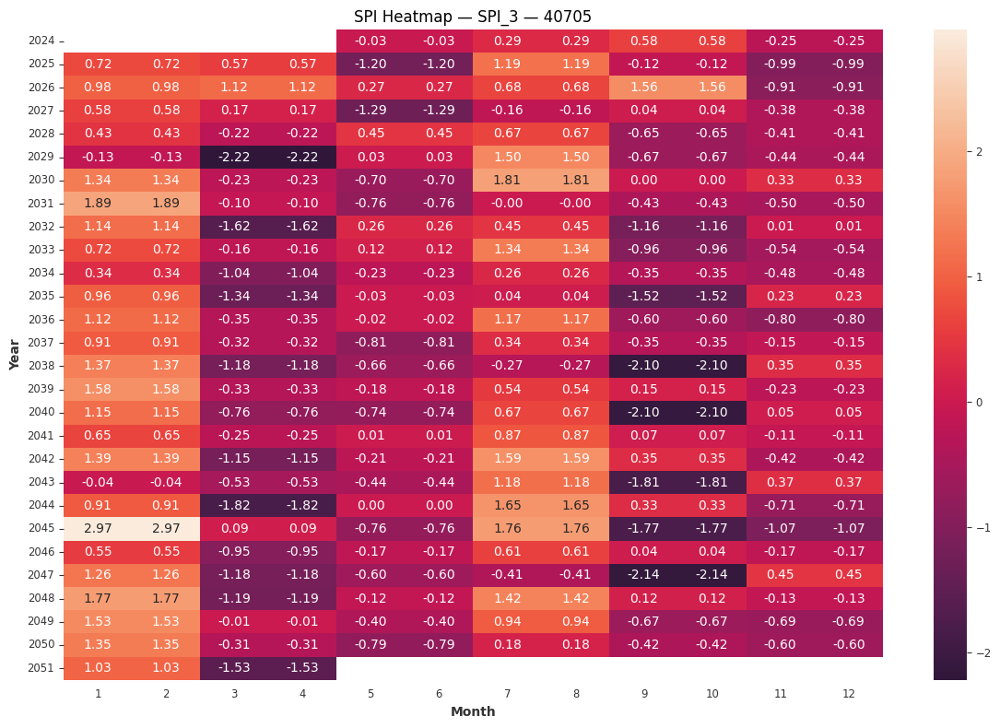

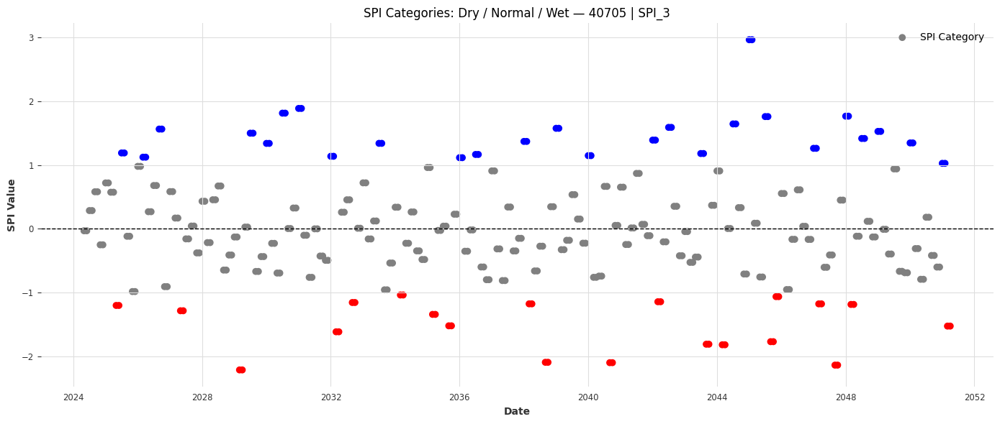

✔️ Done with 40705 | SPI_3

WBBLSTM — std_p: 1.13, corr: 0.06, rmse: 1.47, mape: 606.84


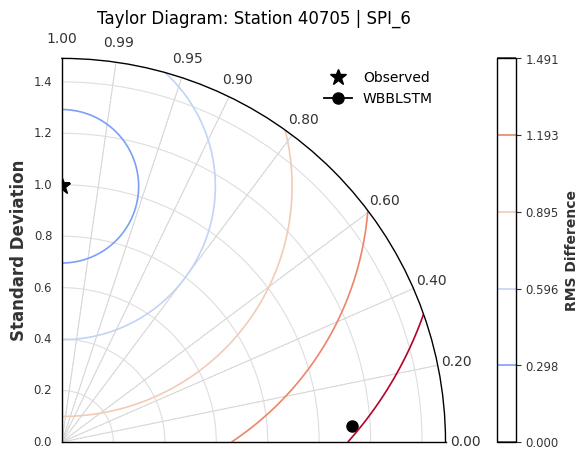

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40705 | SPI_6: WBBLSTM
Epoch 299: 100%|██████████| 10/10 [00:00<00:00, 56.98it/s, train_loss=0.103] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 10/10 [00:00<00:00, 56.66it/s, train_loss=0.103]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 11.54it/s]
Full approx length: 496
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (496,)
  Coeff 1: shape = (162,)


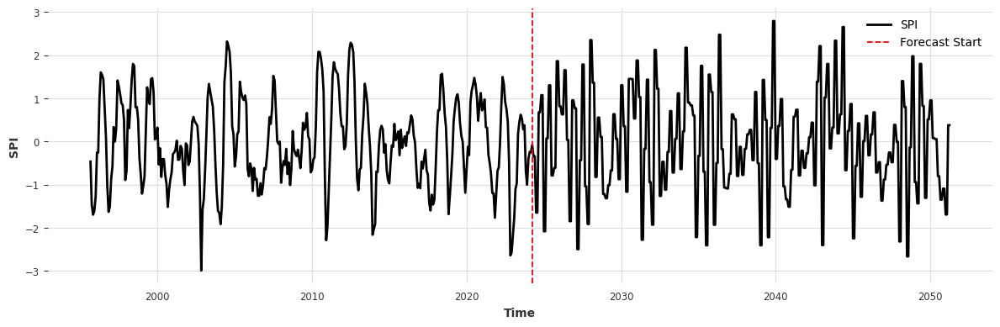

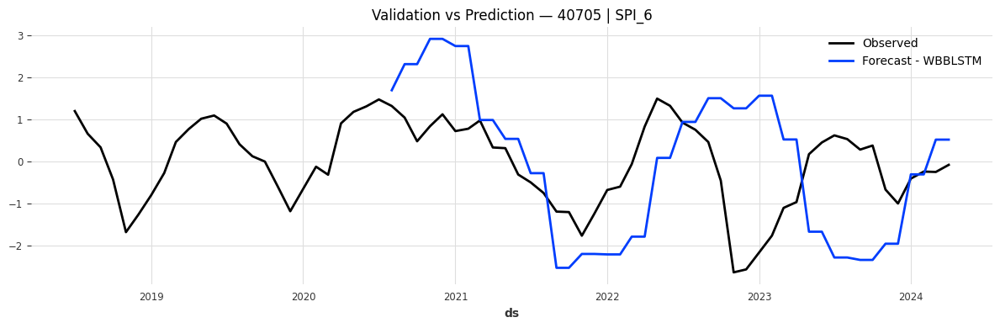

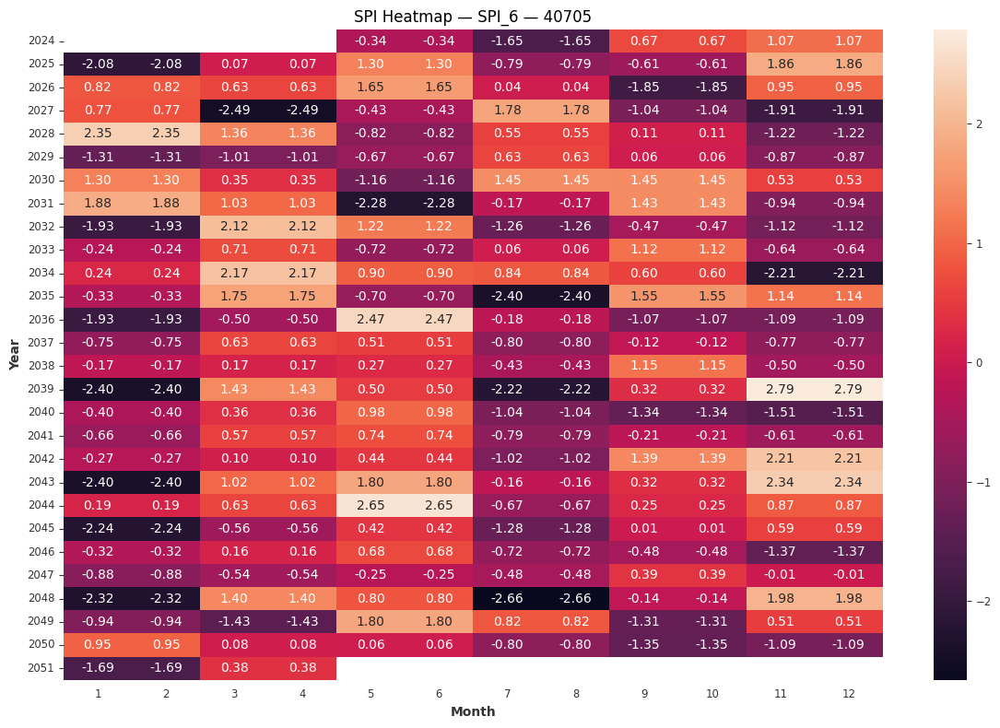

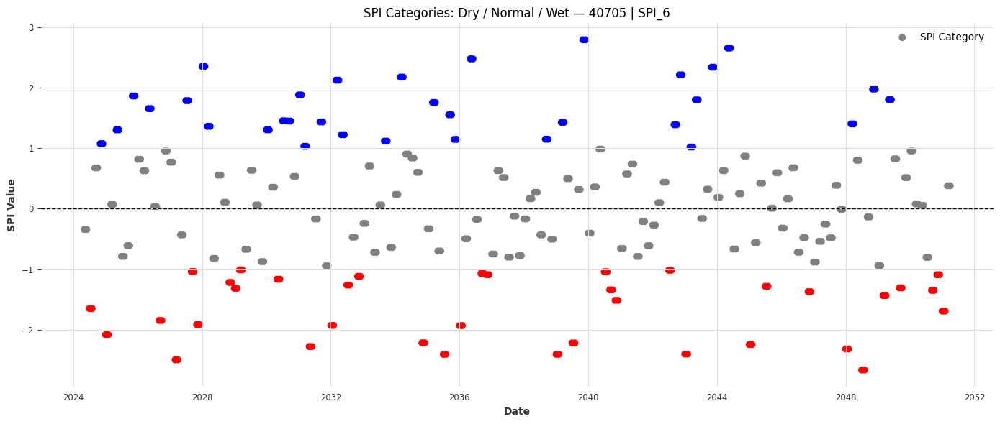

✔️ Done with 40705 | SPI_6

WBBLSTM — std_p: 0.81, corr: 0.36, rmse: 1.09, mape: 437.98


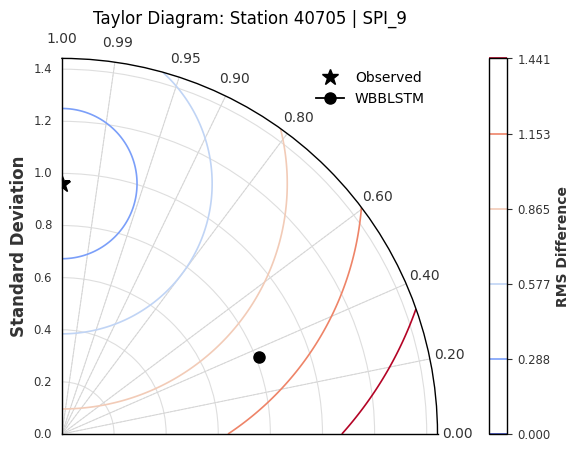

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40705 | SPI_9: WBBLSTM
Epoch 299: 100%|██████████| 10/10 [00:00<00:00, 81.98it/s, train_loss=0.115] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 10/10 [00:00<00:00, 81.98it/s, train_loss=0.115]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 16.75it/s]
Full approx length: 495
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (495,)
  Coeff 1: shape = (162,)


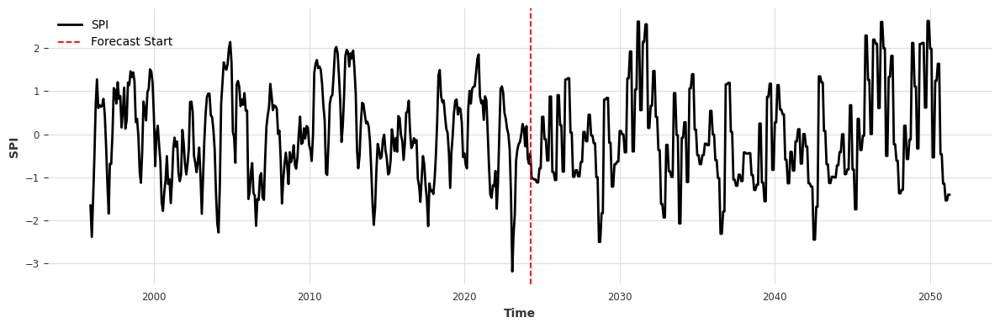

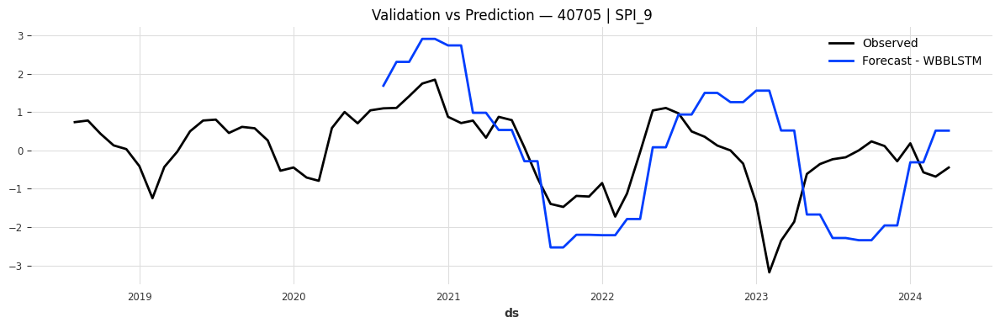

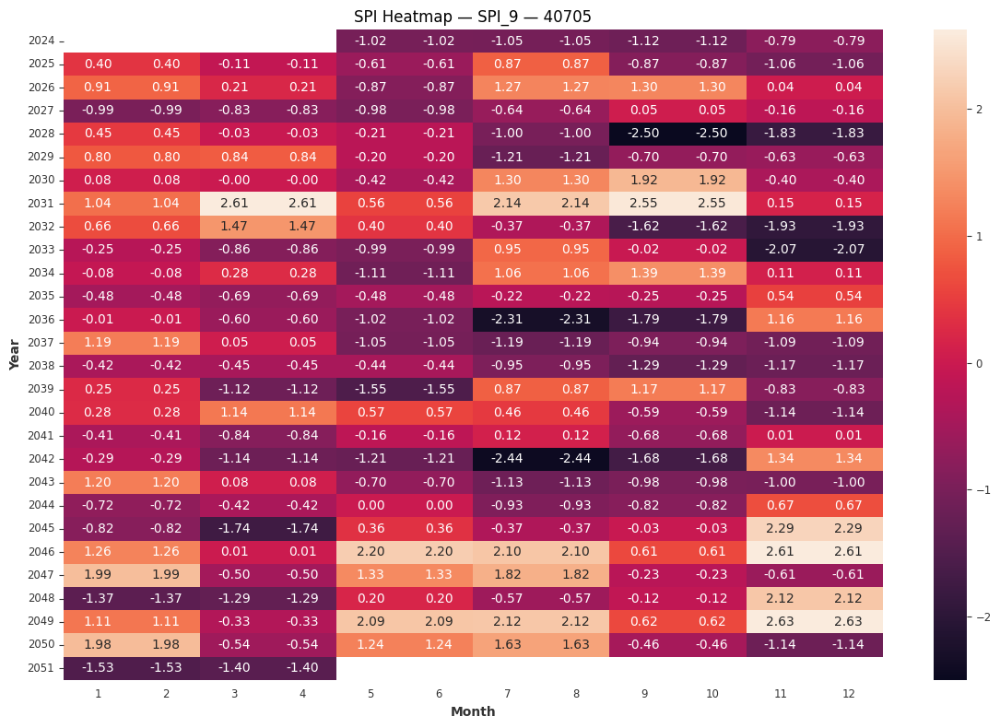

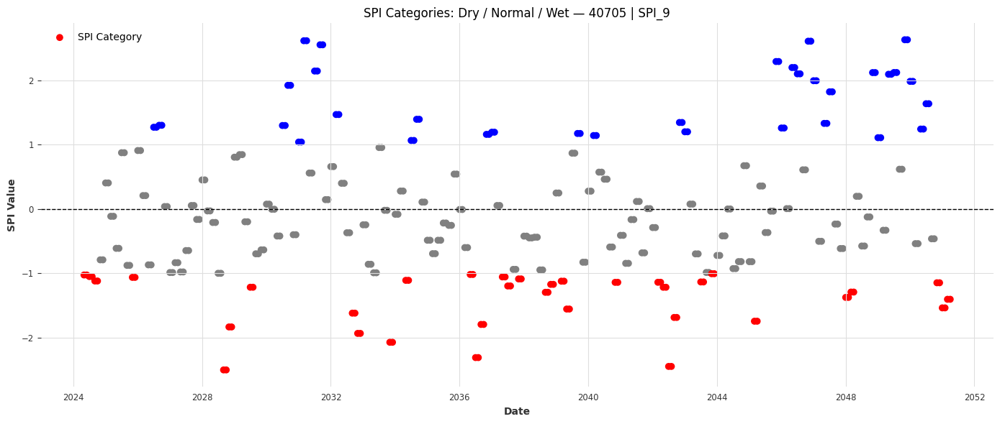

✔️ Done with 40705 | SPI_9

WBBLSTM — std_p: 1.20, corr: -0.04, rmse: 1.51, mape: 503.63


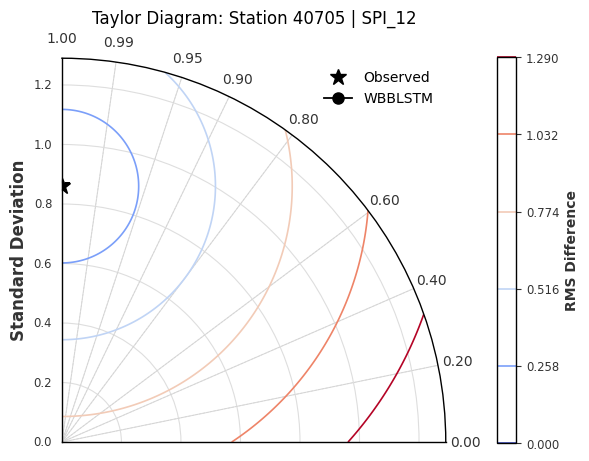

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40705 | SPI_12: WBBLSTM
Epoch 299: 100%|██████████| 10/10 [00:00<00:00, 84.40it/s, train_loss=0.134]  

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 10/10 [00:00<00:00, 83.56it/s, train_loss=0.134]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 17.15it/s]
Full approx length: 493
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (493,)
  Coeff 1: shape = (162,)


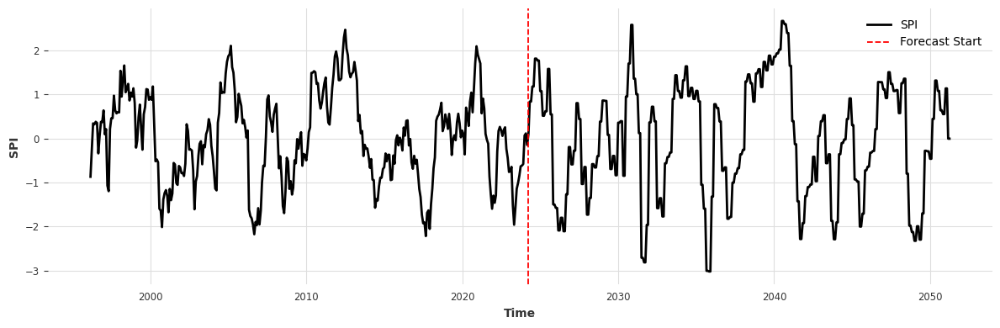

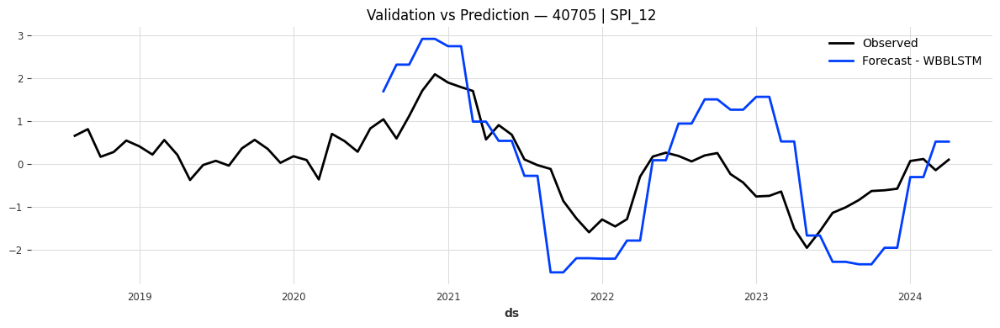

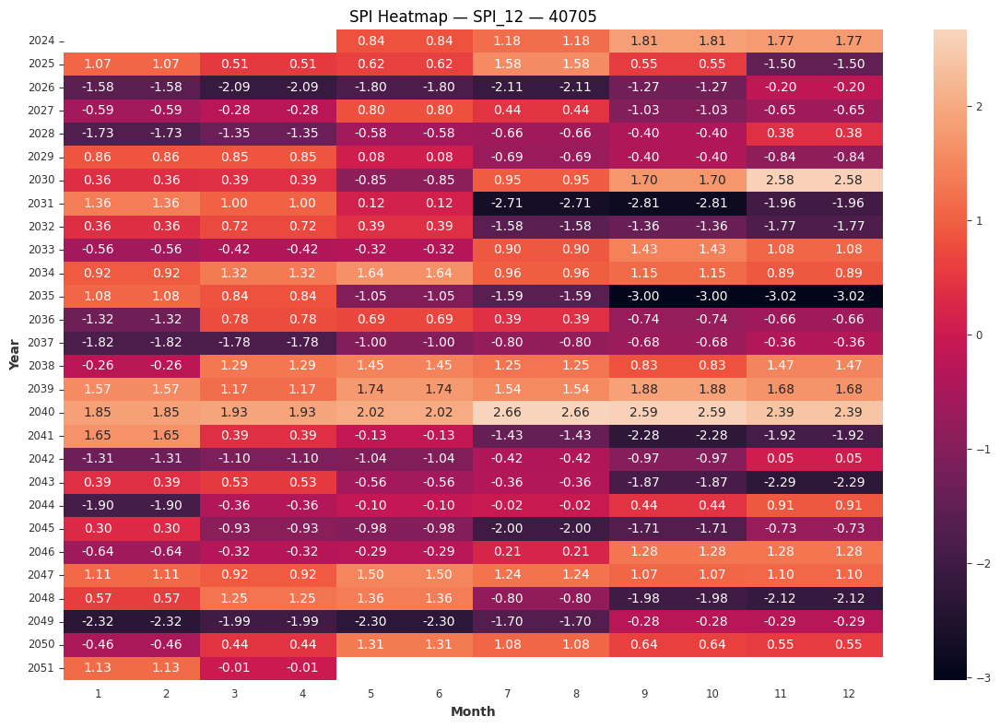

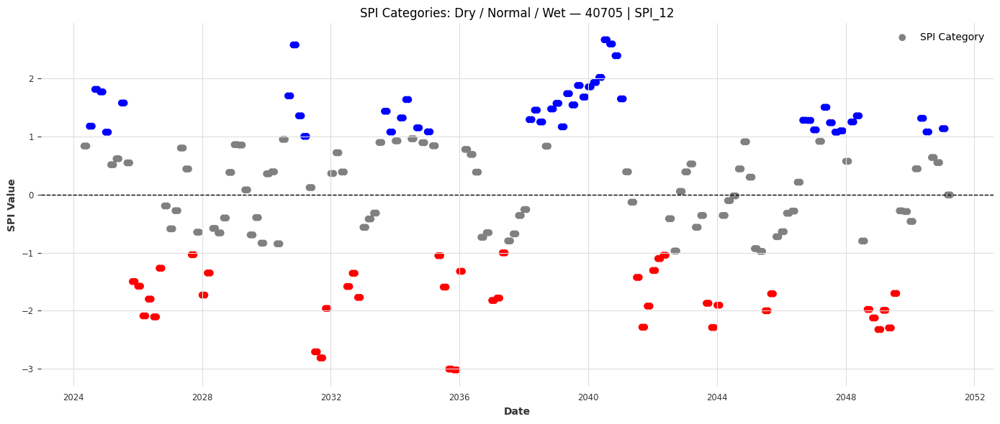

✔️ Done with 40705 | SPI_12

WBBLSTM — std_p: 1.56, corr: 0.56, rmse: 1.29, mape: 757.65


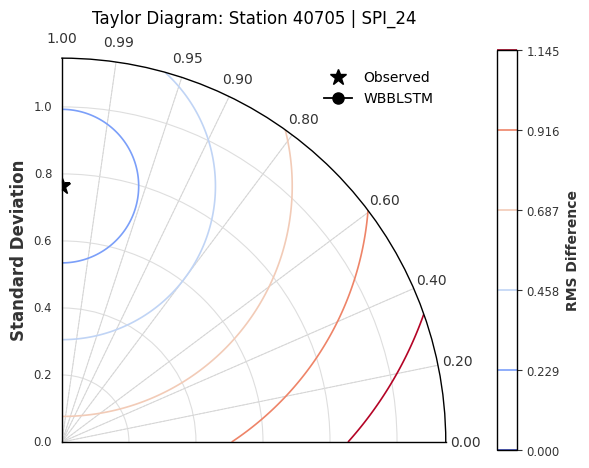

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40705 | SPI_24: WBBLSTM
Epoch 299: 100%|██████████| 9/9 [00:00<00:00, 84.92it/s, train_loss=0.0807] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 9/9 [00:00<00:00, 83.35it/s, train_loss=0.0807]

GPU available: False, used: False


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 15.67it/s]
Full approx length: 487
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (487,)
  Coeff 1: shape = (162,)


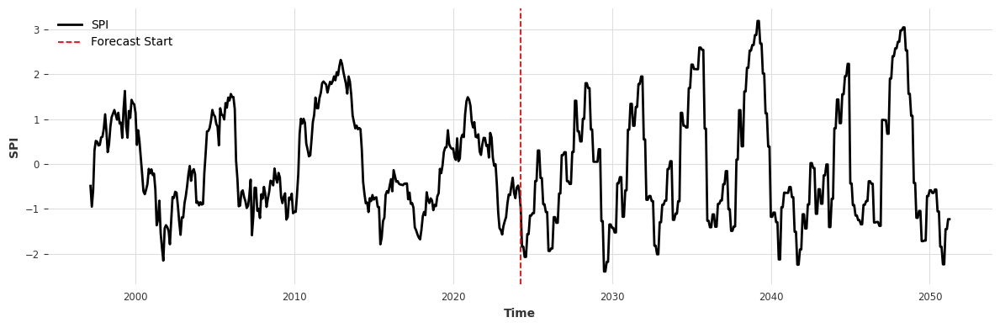

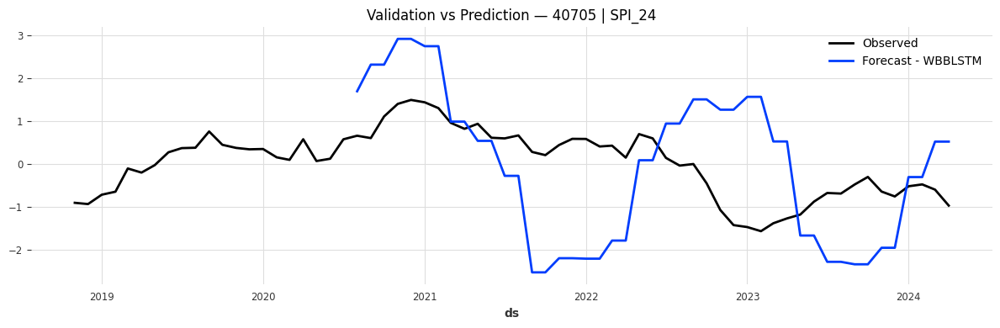

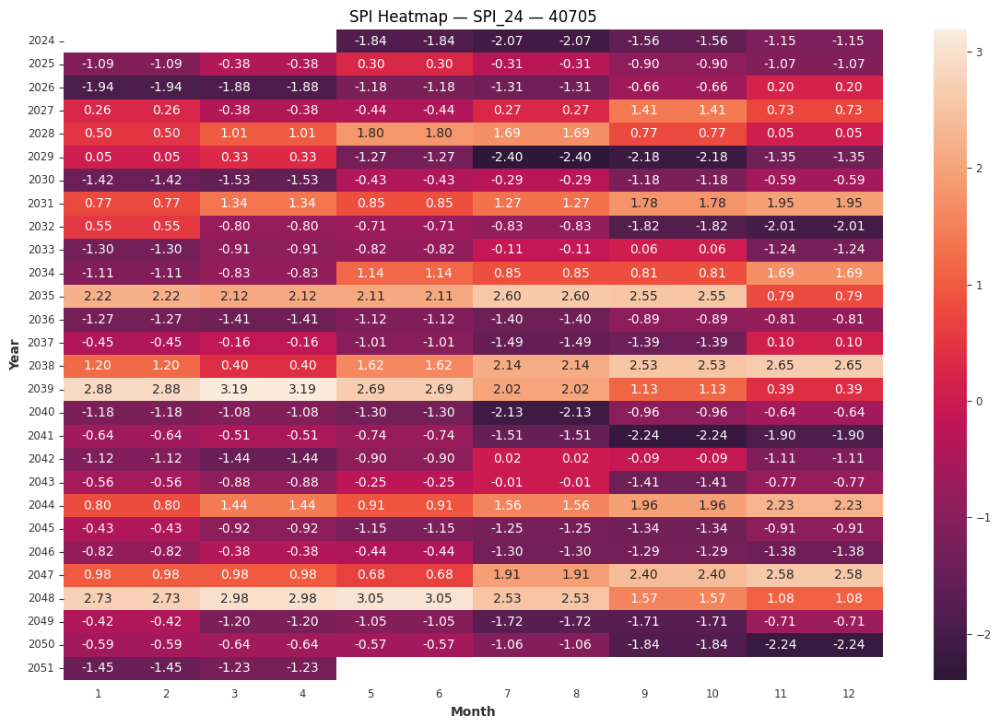

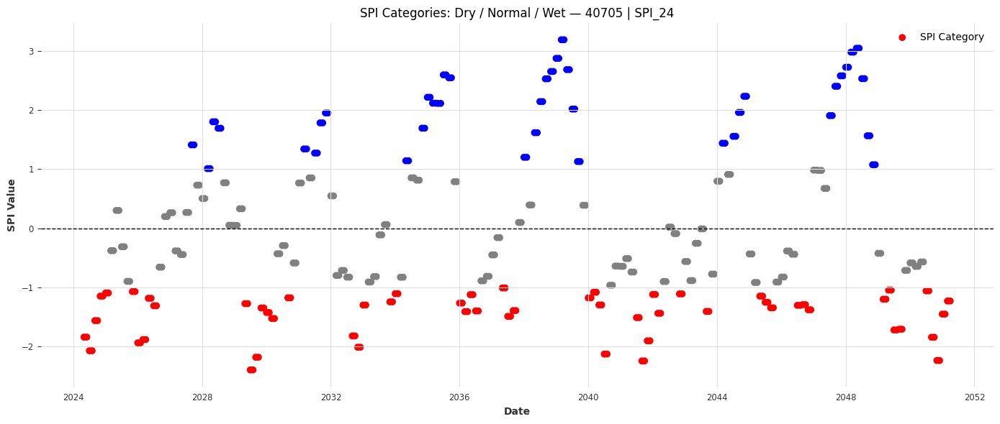

✔️ Done with 40705 | SPI_24

WBBLSTM — std_p: 0.77, corr: 0.11, rmse: 1.20, mape: 316.73


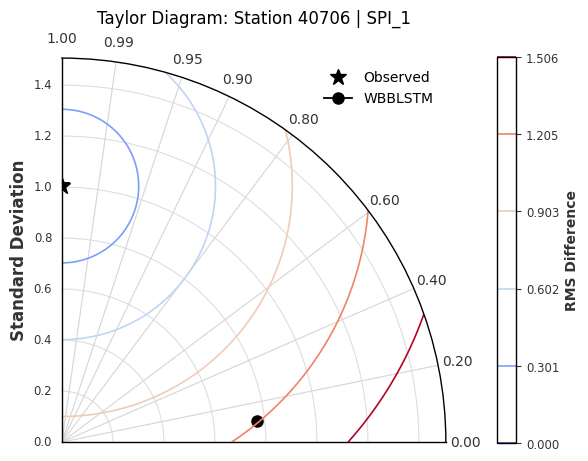

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40706 | SPI_1: WBBLSTM
Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 92.25it/s, train_loss=0.233] 

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 299: 100%|██████████| 12/12 [00:00<00:00, 92.25it/s, train_loss=0.233]


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 20.67it/s]
Full approx length: 530
Expected shapes:
  Coeff 0: shape = (162,)
  Coeff 1: shape = (162,)

Your full_coeffs shapes:
  Coeff 0: shape = (530,)
  Coeff 1: shape = (162,)


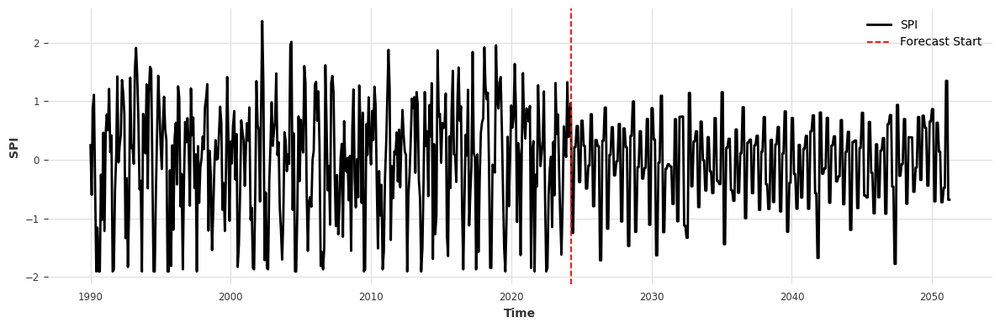

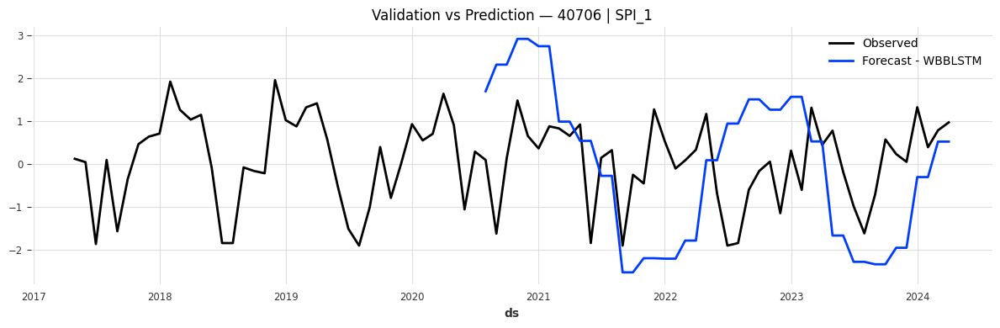

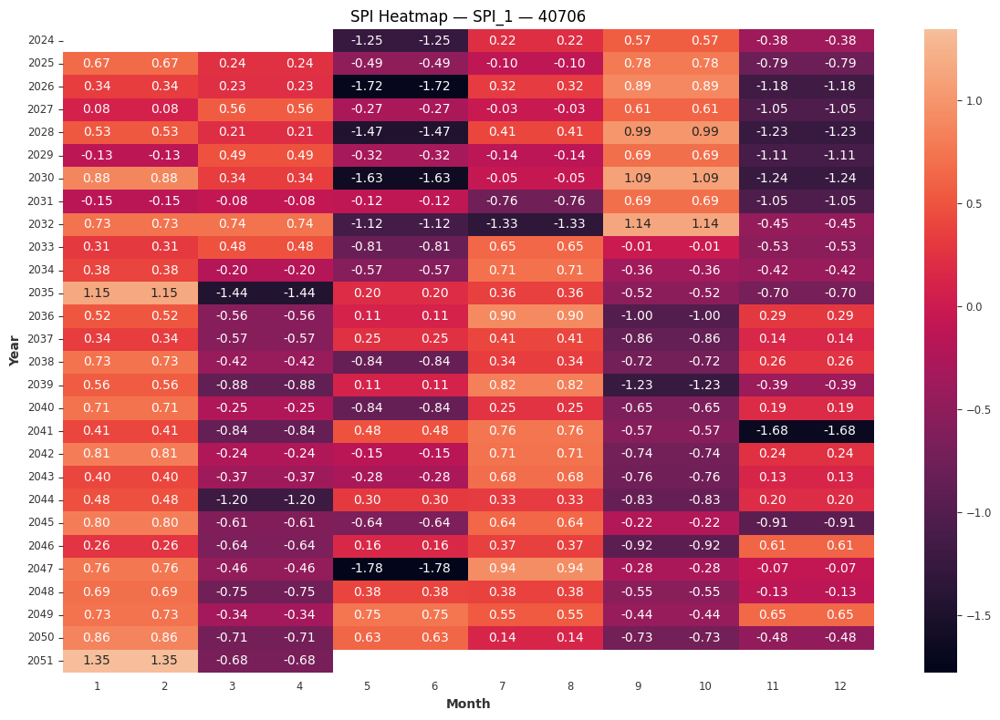

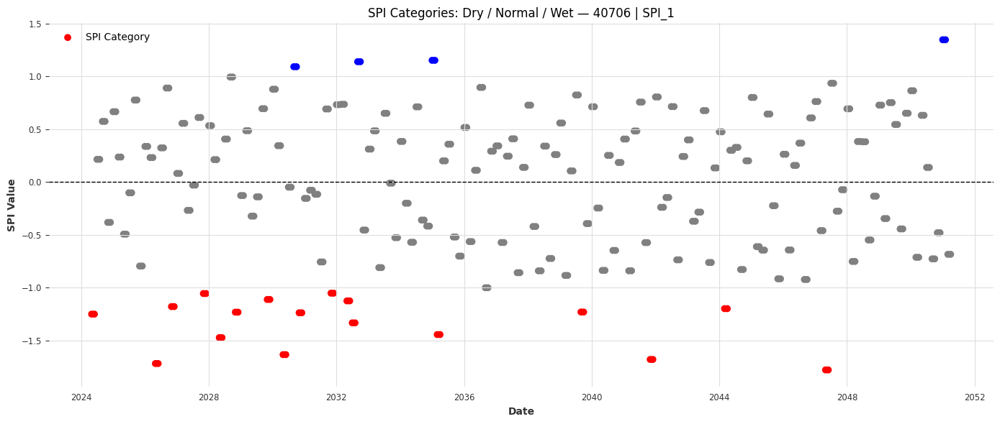

✔️ Done with 40706 | SPI_1

WBBLSTM — std_p: 0.96, corr: 0.23, rmse: 1.22, mape: 33057.39


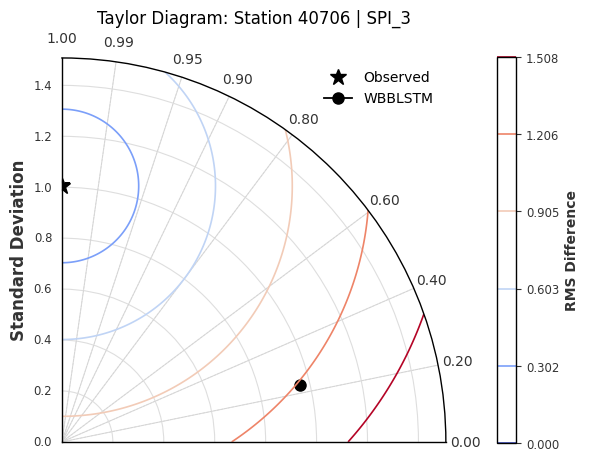

ignoring user defined `output_chunk_length`. RNNModel uses a fixed `output_chunk_length=1`.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 8.0 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
8.0 K     Trainable params
0         Non-trainable params
8.0 K     Total params
0.032     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode


Best model for 40706 | SPI_3: WBBLSTM
Epoch 218:   8%|▊         | 1/12 [00:00<00:00, 84.90it/s, train_loss=0.187]  

In [ ]:
for station_id, group in all_spi.groupby('station_id'):
        # if station_id !=40708:
        #      continue
        for col in [c for c in group.columns if c.startswith("SPI_")]:
            # if col != "SPI_3":
            #     continue
            model_stats = results[station_id][col]  
            sub_df = group[['ds', col]].dropna()

            series = TimeSeries.from_dataframe(sub_df, time_col='ds', value_cols=col)


            # Taylor Diagram
            ref_std = list(model_stats.values())[0][0]
            fig = plt.figure(figsize=(6, 6))
            taylor = TaylorDiagram(ref_std, fig, label='Observed')
            for name, (std_o, std_p, corr, rmse,_mape) in model_stats.items():
                print(f"{name} — std_p: {std_p:.2f}, corr: {corr:.2f}, rmse: {rmse:.2f}, mape: {_mape:.2f}")
                if np.isnan(std_p) or np.isnan(corr) or std_p == 0:
                    print(f"⚠️ Skipping {name} due to invalid metrics.")
                    continue
                taylor.add_sample(std_p, corr, label=name)
            taylor.add_contours()
            plt.legend()
            plt.title(f"Taylor Diagram: Station {station_id} | {col}")
            plt.tight_layout()
            fig.savefig(os.path.join(base_dir, f"{station_id}/taylor_{col}.png"))
            # plt.close()
            plt.show()

            # Best model
            best_model = min(model_stats.items(), key=lambda x: x[1][3])[0]
            best_model = min(model_stats.items(), key=lambda x: x[1][4])[0]  # MAPE

            # best_model = 'WBBLSTM'
            print(f"Best model for {station_id} | {col}: {best_model}")
            best = model_constructors[best_model]()
            best.fit(series)
            

            # Forecast to 2050
            horizon = (pd.Timestamp("2050-12-01") - series.end_time()).days // 30
            future = best.predict(horizon, series=series)


            if not isinstance(future.time_index, pd.DatetimeIndex):
                future = TimeSeries.from_times_and_values(
                    pd.date_range(
                        start=series.end_time() + pd.DateOffset(months=1),
                        periods=len(future),
                        freq="MS"
                    ),
                    future.values(),
                    columns=series.components
                )

            historical = series
            full_series = historical.append(future)

            plt.figure(figsize=(12, 4))
            full_series.plot(label="SPI")
            plt.axvline(x=historical.end_time(), color='r', linestyle='--', label="Forecast Start")
            # plt.title(title)
            plt.xlabel("Time")
            plt.ylabel("SPI")
            plt.grid(True)
            plt.legend()
            plt.tight_layout()
            plt.show()

            # Plot val vs forecast
            _, val = series.split_before(0.8)
            time_idx = val.time_index
            pred = forecasts[best_model]
            # val is your validation TimeSeries, pred is the forecast TimeSeries
            val_df  = val.to_dataframe()   # gives you a DataFrame with a DatetimeIndex
            pred_df = pred.to_dataframe()
            # pred_df.index = val_df.index
            # pred = TimeSeries.from_times_and_values(
            # time_idx,
            # pred.values(),
            # columns=pred.columns
            # )
            plt.figure(figsize=(12, 4))

            val.plot(label="Observed")
            pred.plot(label=f"Forecast - {best_model}")
            # plt.plot(val_df.index,  val_df[col],  label="Observed", linewidth=2)
            # plt.plot(pred_df.index, pred_df[col], label=f"Forecast – {best_model}", linewidth=2)
            plt.title(f"Validation vs Prediction — {station_id} | {col}")
            plt.grid(True)
            plt.legend()
            plt.tight_layout()
            plt.savefig(os.path.join(base_dir, f"{station_id}/val_vs_pred_{col}.png"))
            plt.show()

            # Prepare SPI dataframe for heatmap + category
            # spi_series = full_series.copy()
            spi_df = future.pd_dataframe().reset_index()
            # colll = 'ds' if best_model == "WBLSTM" else 'time'

            spi_df['year'] = pd.to_datetime(spi_df['ds']).dt.year
            spi_df['month'] = pd.to_datetime(spi_df['ds']).dt.month

            # SPI heatmap
            heatmap_data = spi_df.pivot_table(index='year', columns='month', values=col)
            plt.figure(figsize=(12, 8))
            sns.heatmap(heatmap_data, cmap='rocket', center=0, annot=True, fmt=".2f")
            plt.title(f"SPI Heatmap — {col} — {station_id}")
            plt.xlabel("Month")
            plt.ylabel("Year")
            plt.tight_layout()
            plt.grid(False)
            plt.savefig(os.path.join(base_dir, f"{station_id}/heatmap_{col}.png"))
            plt.show()

            spi_df['category'] = pd.cut(spi_df[col], bins=[-np.inf, -1, 1, np.inf], labels=['Dry', 'Normal', 'Wet'])
            colors = {'Dry': 'red', 'Normal': 'gray', 'Wet': 'blue'}

            plt.figure(figsize=(14, 6))
            plt.scatter(spi_df['ds'], spi_df[col], c=spi_df['category'].map(colors), label='SPI Category')
            plt.axhline(0, color='black', lw=1, linestyle='--')
            plt.title(f"SPI Categories: Dry / Normal / Wet — {station_id} | {col}")
            plt.xlabel("Date")
            plt.ylabel("SPI Value")
            plt.grid(True)
            plt.tight_layout()
            plt.legend()
            plt.savefig(os.path.join(base_dir, f"{station_id}/scatter_{col}.png"))
            plt.show()


            # # Use a simple threshold detector
            # detector = ThresholdAD(low_threshold=-1.5, high_threshold=1.5)
            # anomalies = detector.detect(full_series)

            # # Plot
            # full_series.plot(label="SPI")
            # anomalies.plot(label="Anomalies", color='red', marker='o')
            # plt.legend()
            # plt.title(f"Darts Anomaly Detection — {station_id} | {col}")
            # plt.show()

            print(f"✔️ Done with {station_id} | {col}\n")


then auto slide creation or pdf

In [81]:
ppt_path = os.path.join(base_dir, "SPI_Results_Summary.pptx")
prs = Presentation()

title_slide_layout = prs.slide_layouts[0]
blank_slide_layout = prs.slide_layouts[6]

# Title slide
slide = prs.slides.add_slide(title_slide_layout)
slide.shapes.title.text = "SPI Forecast & Evaluation Summary"
slide.placeholders[1].text = "Auto-generated using python-pptx\nIncludes Taylor Diagrams, Heatmaps, Model Metrics & Forecasts"

# Loop through all stations
for station_id in sorted(os.listdir(base_dir)):
    station_path = os.path.join(base_dir, station_id)
    if not os.path.isdir(station_path):
        continue

    for col in results.get(int(station_id), {}):  # Ensure `station_id` matches results keys
        # Add slide for this station/SPI
        slide = prs.slides.add_slide(blank_slide_layout)
        # Add title
        title_box = slide.shapes.add_textbox(Inches(0.5), Inches(0.3), Inches(9), Inches(0.5))
        tf = title_box.text_frame
        tf.text = f"Station {station_id} — {col}"
        tf.paragraphs[0].font.size = Pt(24)
        tf.paragraphs[0].font.bold = True

        # Add metrics table
        metrics = results[int(station_id)][col]
        rows, cols = len(metrics) + 1, 5
        table = slide.shapes.add_table(rows, cols, Inches(0.5), Inches(1), Inches(8), Inches(0.6 + rows * 0.4)).table
        table.cell(0, 0).text = "Model"
        table.cell(0, 1).text = "RMSE"
        table.cell(0, 2).text = "MAPE"
        table.cell(0, 3).text = "Corr"
        table.cell(0, 4).text = "Std. Dev (Pred)"

        for i, (model_name, (std_o, std_p, corr, rmse, mape)) in enumerate(metrics.items(), start=1):
            table.cell(i, 0).text = model_name
            table.cell(i, 1).text = f"{rmse:.3f}"
            table.cell(i, 2).text = f"{mape:.2f}%"
            table.cell(i, 3).text = f"{corr:.2f}"
            table.cell(i, 4).text = f"{std_p:.2f}"

        # Add first two images
        image_files = ["val_vs_pred", "heatmap", "taylor", "scatter"]
        img_slide_count = 0
        img_group = []

        for img_type in image_files:
            img_path = os.path.join(station_path, f"{img_type}_{col}.png")
            if os.path.exists(img_path):
                img_group.append(img_path)

        # Split image group into chunks of 2
        for i in range(0, len(img_group), 2):
            if i == 0:
                # Use the first slide already created
                current_slide = slide
            else:
                current_slide = prs.slides.add_slide(blank_slide_layout)

                # Add title for extra image slides
                sub_title_box = current_slide.shapes.add_textbox(Inches(0.5), Inches(0.3), Inches(9), Inches(0.5))
                sub_tf = sub_title_box.text_frame
                sub_tf.text = f"Station {station_id} — {col} (Images {i + 1}–{min(i+2, len(img_group))})"
                sub_tf.paragraphs[0].font.size = Pt(20)
                sub_tf.paragraphs[0].font.bold = True

            for j, img_path in enumerate(img_group[i:i+2]):
                x = Inches(0.5 + j * 5)  # Side by side
                y = Inches(1.2 if i == 0 else 1.0)
                current_slide.shapes.add_picture(img_path, x, y, width=Inches(4.5))

        # # Add Title
        # left = Inches(0.5)
        # top = Inches(0.3)
        # width = Inches(9)
        # height = Inches(0.5)
        # title_box = slide.shapes.add_textbox(left, top, width, height)
        # tf = title_box.text_frame
        # tf.text = f"Station {station_id} — {col}"
        # tf.paragraphs[0].font.size = Pt(24)
        # tf.paragraphs[0].font.bold = True

        # # Add metrics table
        # metrics = results[int(station_id)][col]
        # rows, cols = len(metrics) + 1, 5
        # table = slide.shapes.add_table(rows, cols, Inches(0.5), Inches(1), Inches(8), Inches(0.6 + rows * 0.4)).table

        # # Header row
        # table.cell(0, 0).text = "Model"
        # table.cell(0, 1).text = "RMSE"
        # table.cell(0, 2).text = "MAPE"
        # table.cell(0, 3).text = "Corr"
        # table.cell(0, 4).text = "Std. Dev (Pred)"

        # for i, (model_name, (std_o, std_p, corr, rmse, mape)) in enumerate(metrics.items(), start=1):
        #     table.cell(i, 0).text = model_name
        #     table.cell(i, 1).text = f"{rmse:.3f}"
        #     table.cell(i, 2).text = f"{mape:.2f}%"
        #     table.cell(i, 3).text = f"{corr:.2f}"
        #     table.cell(i, 4).text = f"{std_p:.2f}"

        # # Add available figures (val_vs_pred, heatmap, taylor, scatter)
        # image_files = ["val_vs_pred", "heatmap", "taylor", "scatter"]
        # x_offset = [0.5, 5.1]
        # y_offset = [3.2, 5.4]

        # img_idx = 0
        # for img_type in image_files:
        #     img_path = os.path.join(station_path, f"{img_type}_{col}.png")
        #     if os.path.exists(img_path):
        #         x = x_offset[img_idx % 2]
        #         y = y_offset[img_idx // 2]
        #         slide.shapes.add_picture(img_path, Inches(x), Inches(y), width=Inches(4.5))
        #         img_idx += 1

# Save presentation
prs.save(ppt_path)
print(f"✅ Presentation saved to: {ppt_path}")

✅ Presentation saved to: all_results3\SPI_Results_Summary.pptx


iran map spi

C:\Users\varas\AppData\Local\Temp\ipykernel_15528\1789373696.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', num_stations)
C:\Users\varas\AppData\Local\Temp\ipykernel_15528\1789373696.py:101: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


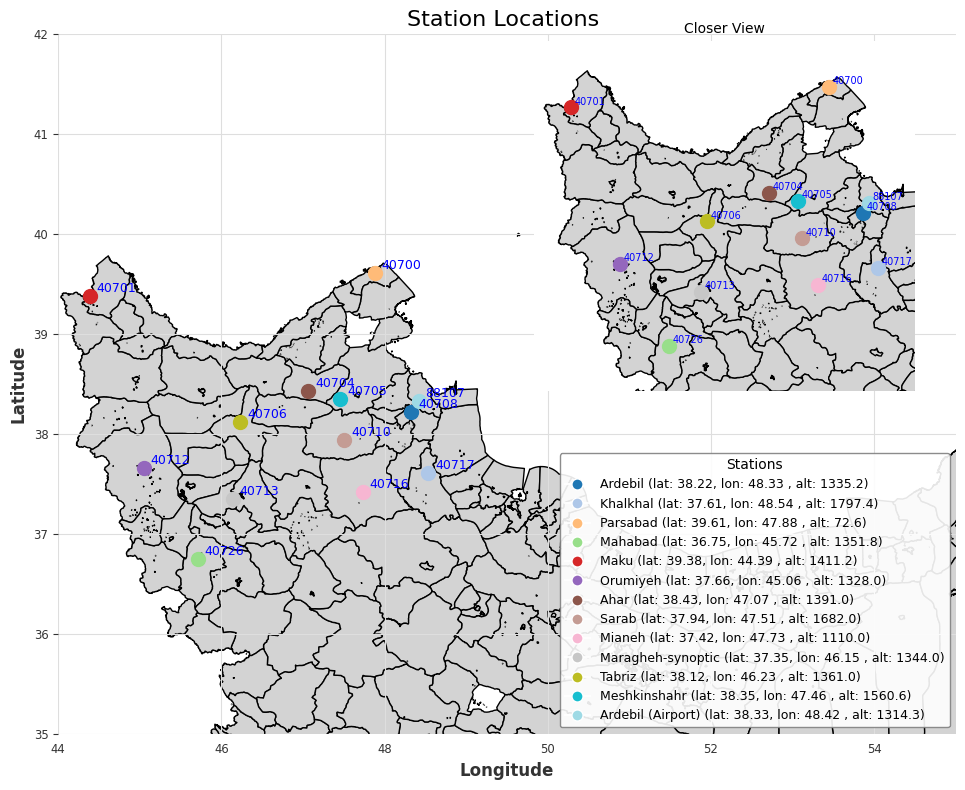

In [80]:
import matplotlib.cm as cm
# import matplotlib.colors as mcolors


world = gpd.read_file('ir_shp/gis_osm_places_a_free_1.shp')
df2 = pd.read_csv('../result/merged_data.csv')
stations = df2[['station_id','station_name','station_elevation', 'lat', 'lon']].drop_duplicates()

# Convert to GeoDataFrame
geometry = [Point(xy) for xy in zip(stations['lon'], stations['lat'])]

geo_df = gpd.GeoDataFrame(stations, geometry=geometry)


geo_df.set_crs(epsg=4326, inplace=True)


# Assign unique colors to each station
num_stations = len(geo_df)
cmap = cm.get_cmap('tab20', num_stations)
colors = [cmap(i) for i in range(num_stations)]
geo_df['color'] = colors

# Create plot
fig, ax = plt.subplots(figsize=(12, 8))
world.plot(ax=ax, color='lightgray', edgecolor='black')

# Plot each station with its unique color
for idx, row in geo_df.iterrows():
    ax.plot(row.geometry.x, row.geometry.y, marker='o', color=row.color, markersize=10)

# Offset and label with station_id
for x, y, label in zip(geo_df.geometry.x, geo_df.geometry.y, geo_df['station_id']):
    ax.text(x + 0.08, y + 0.04, str(label), fontsize=9, ha='left', color='blue')

# Zoom main map to upper north Iran
ax.set_xlim(44, 55)
ax.set_ylim(35, 42)

# Title and axes
plt.title('Station Locations ', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.grid(True)

# Create custom legend using station name and unique color
legend_elements = [
    Line2D([0], [0], marker='o', color='w',
           label=f"{row.station_name} (lat: {row.lat:.2f}, lon: {row.lon:.2f} , alt: {row.station_elevation})",
           markerfacecolor=row.color, markersize=8)
    for _, row in geo_df.iterrows()
]
# Add legend with background box
legend = ax.legend(
    handles=legend_elements, title="Stations", fontsize=9, title_fontsize=10, loc='lower right',
    frameon=True, fancybox=True, framealpha=0.9, edgecolor='gray'
)
legend.get_frame().set_facecolor('white')  # Set background color

# Zoomed inset
axins = inset_axes(ax, width="50%", height="50%", loc='upper right')
world.plot(ax=axins, color='lightgray', edgecolor='black')
for idx, row in geo_df.iterrows():
    axins.plot(row.geometry.x, row.geometry.y, marker='o', color=row.color, markersize=10)
    axins.text(row.geometry.x + 0.05, row.geometry.y + 0.03, str(row.station_id), fontsize=7, ha='left', color='blue')

# Adjust inset zoom area so no point falls in blank space
margin = 0.5
xmin, xmax = geo_df.geometry.x.min() - margin, geo_df.geometry.x.max() + margin
ymin, ymax = geo_df.geometry.y.min() - margin, geo_df.geometry.y.max() + margin
axins.set_xlim(xmin, xmax)
axins.set_ylim(ymin, ymax)
axins.set_xticks([])
axins.set_yticks([])
axins.set_title("Closer View", fontsize=10)

# # Create custom legend using station name and unique color
# legend_elements = [
#     Line2D([0], [0], marker='o', color='w',
#            label=f"{row.station_name} (lat: {row.lat:.2f}, lon: {row.lon:.2f})",
#            markerfacecolor=row.color, markersize=8)
#     for _, row in geo_df.iterrows()
# ]
# ax.legend(handles=legend_elements, title="Stations", fontsize=9, title_fontsize=10, loc='lower right')

# # Zoomed inset
# axins = inset_axes(ax, width="40%", height="40%", loc='upper right')
# world.plot(ax=axins, color='lightgray', edgecolor='black')
# for idx, row in geo_df.iterrows():
#     axins.plot(row.geometry.x, row.geometry.y, marker='o', color=row.color, markersize=10)
#     axins.text(row.geometry.x + 0.05, row.geometry.y + 0.03, str(row.station_id), fontsize=7, ha='left', color='blue')

# # Set tighter zoom in inset (adjust if needed)
# axins.set_xlim(47, 51)
# axins.set_ylim(36, 39)
# axins.set_xticks([])
# axins.set_yticks([])
# axins.set_title("Closer View", fontsize=10)

# Final layout
plt.tight_layout()
plt.show()
